In [2]:
# Ensure dependencies are installed
%pip install pandas openpyxl matplotlib scikit-learn seaborn matplotlib-venn statmodels

from google.colab import drive
drive.mount('/content/drive')

# Import required libraries
import pandas as pd
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import os
import statsmodels.api as sm


# Set up file paths
drive_dir = r'/content/drive/My Drive'
file_path = os.path.join(drive_dir, 'DatasetsCombinedCommonPeriodMatrix.xlsx')

# Function to load the dataset
def load_data(file_path):
    try:
        # Load the Excel file
        data = pd.read_excel(file_path, sheet_name="DatasetsCombinedCommonPeriodMat", index_col=0)

        # Ensure the Date column is datetime
        data.index = pd.to_datetime(data.index, errors='coerce')

        # Extract Portfolio, Benchmark, and other matrices based on column naming
        portfolio_returns = data.filter(like='.PortfolioReturnMatrix')
        benchmark_returns = data.filter(like='.BenchmarkReturnMatrix')
        index_data = data.filter(like='.OutperformanceMatrix')

        return {
            "PortfolioReturnMatrix": portfolio_returns,
            "BenchmarkReturnMatrix": benchmark_returns,
            "IndexData": index_data
        }

    except Exception as e:
        print(f"Error loading data: {e}")
        return None

# Function to perform regressions
def factorize_regression(common_period_matrix):
    """
    Perform regression on the outputs of the common period matrix preprocessing.

    Parameters:
    common_period_matrix (dict): A dictionary containing aligned return matrices:
        {
            'PortfolioReturnMatrix': DataFrame,
            'BenchmarkReturnMatrix': DataFrame,
            'IndexData': DataFrame
        }

    Returns:
    list: A list of regression results for each portfolio.
    """
    portfolio_returns = common_period_matrix['PortfolioReturnMatrix']
    benchmark_returns = common_period_matrix['BenchmarkReturnMatrix']
    index_data = common_period_matrix['IndexData']

    # Ensure alignment of index_data with portfolio_returns
    index_data = index_data.loc[portfolio_returns.index]

    results = []

    for col in portfolio_returns.columns:
        mandate_returns = portfolio_returns[col]

        # Design matrix includes outperformance data
        X = sm.add_constant(index_data)
        y = mandate_returns

        # Check for valid data
        if y.isna().all() or X.isna().all().any():
            print(f"Skipping regression for {col} due to insufficient data.")
            continue

        # Perform regression
        model = sm.OLS(y, X, missing='drop')
        regression_result = model.fit()

        results.append({
            'Mandate': col,
            'RegressionSummary': regression_result.summary().as_text(),
            'Parameters': regression_result.params,
            'PValues': regression_result.pvalues,
            'RSquared': regression_result.rsquared
        })

    return results

# Main execution block
if __name__ == "__main__":
    # Load the data
    data_matrices = load_data(file_path)

    if data_matrices:
        # Perform regression
        regression_results = factorize_regression(data_matrices)

        # Display summaries of the first few regressions
        for result in regression_results[:3]:  # Display only the first 3 regressions for brevity
            print(f"Regression for {result['Mandate']}")
            print(result['RegressionSummary'])
            print("\n" + "="*80 + "\n")
    else:
        print("Failed to load the data. Please check the file format and structure.")



ERROR: Could not find a version that satisfies the requirement statmodels (from versions: none)
ERROR: No matching distribution found for statmodels
Mounted at /content/drive
Regression for Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrix
                                                         OLS Regression Results                                                         
Dep. Variable:     Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrix   R-squared:                       0.994
Model:                                                                                      OLS   Adj. R-squared:                  0.993
Method:                                                                           Least Squares   F-statistic:                     635.6
Date:                                                                          Tue, 03 Dec 2024   Prob (F-statistic):           1.40e-86
Time:                                           

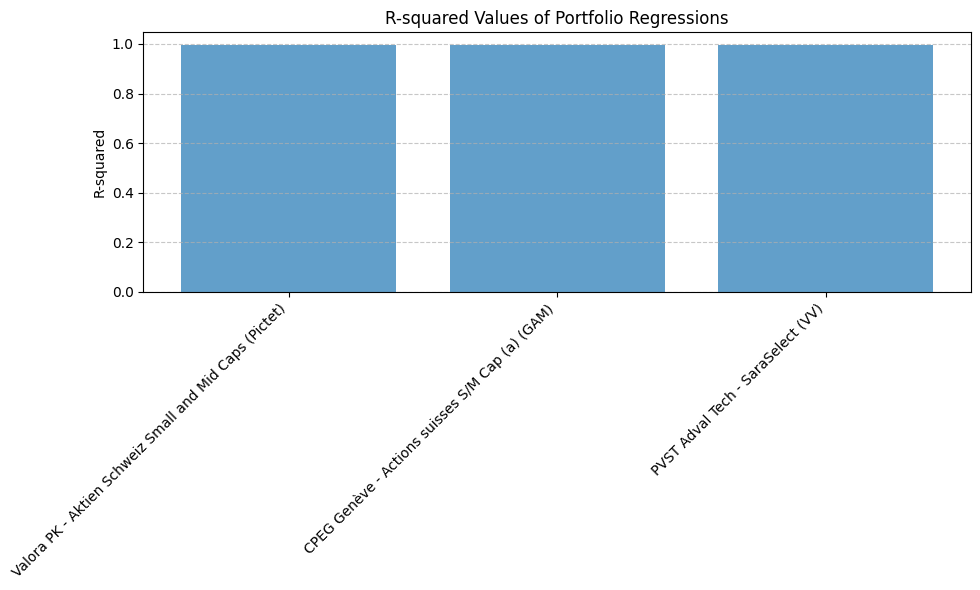

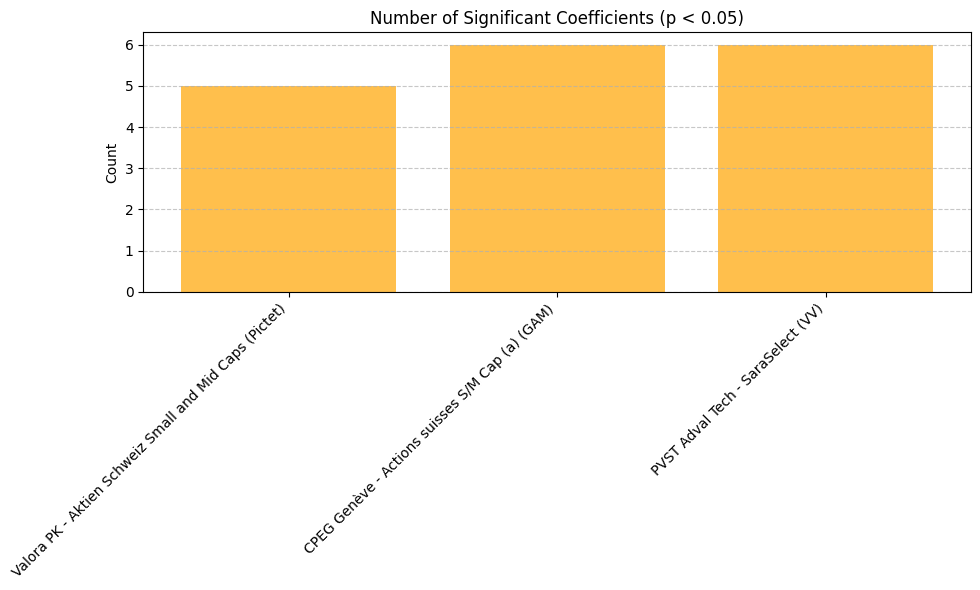

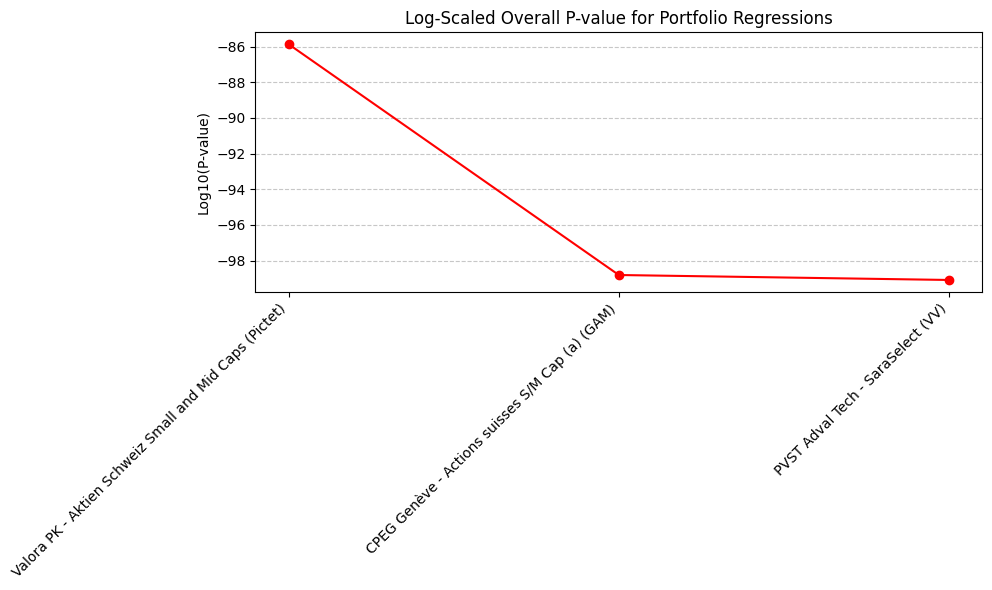

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Example regression data (summary of key metrics for illustration purposes)
# Replace with actual coefficients, R-squared, and p-values
data = {
    "Portfolio": [
        "Valora PK - Aktien Schweiz Small and Mid Caps (Pictet)",
        "CPEG Genève - Actions suisses S/M Cap (a) (GAM)",
        "PVST Adval Tech - SaraSelect (VV)"
    ],
    "R_squared": [0.994, 0.997, 0.997],
    "Significant Coefficients": [5, 6, 6],  # Count of predictors with p < 0.05
    "P_value_Overall": [1.40e-86, 1.54e-99, 8.11e-100],  # Prob (F-statistic)
}

# Convert to DataFrame for visualization
df_results = pd.DataFrame(data)

# Bar Chart for R-squared values
plt.figure(figsize=(10, 6))
plt.bar(df_results["Portfolio"], df_results["R_squared"], alpha=0.7)
plt.title("R-squared Values of Portfolio Regressions")
plt.ylabel("R-squared")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Bar Chart for Significant Coefficients
plt.figure(figsize=(10, 6))
plt.bar(df_results["Portfolio"], df_results["Significant Coefficients"], alpha=0.7, color="orange")
plt.title("Number of Significant Coefficients (p < 0.05)")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Line Plot for Overall P-value (log scale to emphasize small differences)
plt.figure(figsize=(10, 6))
plt.plot(df_results["Portfolio"], np.log10(df_results["P_value_Overall"]), marker='o', linestyle='-', color='red')
plt.title("Log-Scaled Overall P-value for Portfolio Regressions")
plt.ylabel("Log10(P-value)")
plt.xticks(rotation=45, ha="right")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()



In [4]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

def compute_vif(data):
    """
    Compute Variance Inflation Factor (VIF) for each feature in a dataset.
    Args:
        data (pd.DataFrame): DataFrame containing independent variables.
    Returns:
        pd.DataFrame: VIF scores for each variable.
    """
    # Add constant term for the intercept in the regression
    X = add_constant(data)

    # Compute VIF for each variable
    vif_data = pd.DataFrame({
        "Variable": X.columns,
        "VIF": [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    })

    return vif_data.drop(index=0)  # Drop constant (intercept)


# Example: Compute VIF for each portfolio
def compute_vif_per_portfolio(data_matrices):
    """
    Compute VIF for predictors in the regression model of each portfolio.

    Args:
        data_matrices (dict): A dictionary containing aligned return matrices:
            - 'PortfolioReturnMatrix': DataFrame
            - 'IndexData': DataFrame

    Returns:
        dict: A dictionary of VIF scores per portfolio.
    """
    portfolio_returns = data_matrices["PortfolioReturnMatrix"]
    index_data = data_matrices["IndexData"]

    vif_results = {}

    for col in portfolio_returns.columns:
        mandate_returns = portfolio_returns[col]

        # Design matrix includes outperformance data
        predictors = index_data

        if predictors.isna().all().any() or mandate_returns.isna().all():
            print(f"Skipping {col} due to missing data.")
            continue

        vif_results[col] = compute_vif(predictors)

    return vif_results


# Load your data (replace with actual data loading function)
data_matrices = load_data(file_path)  # Replace with actual path

# Compute VIF for all portfolios
if data_matrices:
    vif_results_per_portfolio = compute_vif_per_portfolio(data_matrices)
    for portfolio, vif_result in vif_results_per_portfolio.items():
        print(f"VIF for {portfolio}:")
        print(vif_result)
        print("="*80)


VIF for Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrix:
                                             Variable          VIF
1   Valora PK - Aktien Schweiz Small and Mid Caps ...    46.142715
2   CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GA...   156.758063
3   PVST Adval Tech - SaraSelect (VV).Outperforman...    90.656226
4   Pensionskasse Kanton Solothurn - Aktien Schwei...   143.470985
5   Pensionskasse der Stadt Luzern - Aktien Schwei...   112.929283
6   Skycare - Actions Suisse S&M Cap (a) (zCapital...   104.761943
7   APK - Aktien Schweiz (Intern).OutperformanceMa...    14.785247
8   Pensionskasse SRG SSR - Aktien Schweiz (IAM).O...     7.744386
9   PKBS - Aktien Schweiz IsoPro aktiv (SGKB).Outp...  2590.312286
10  Helsana-Gruppe - Gruppe Aktien CH (Intern).Out...    90.114369
11  Post - Aktien Schweiz (Finreon).Outperformance...  2983.626175
12  AGV Aargauische GebÃ¤udeversicherung - Aktien ...    42.038129
13  Valora PK - Aktien Schweiz Small and Mi

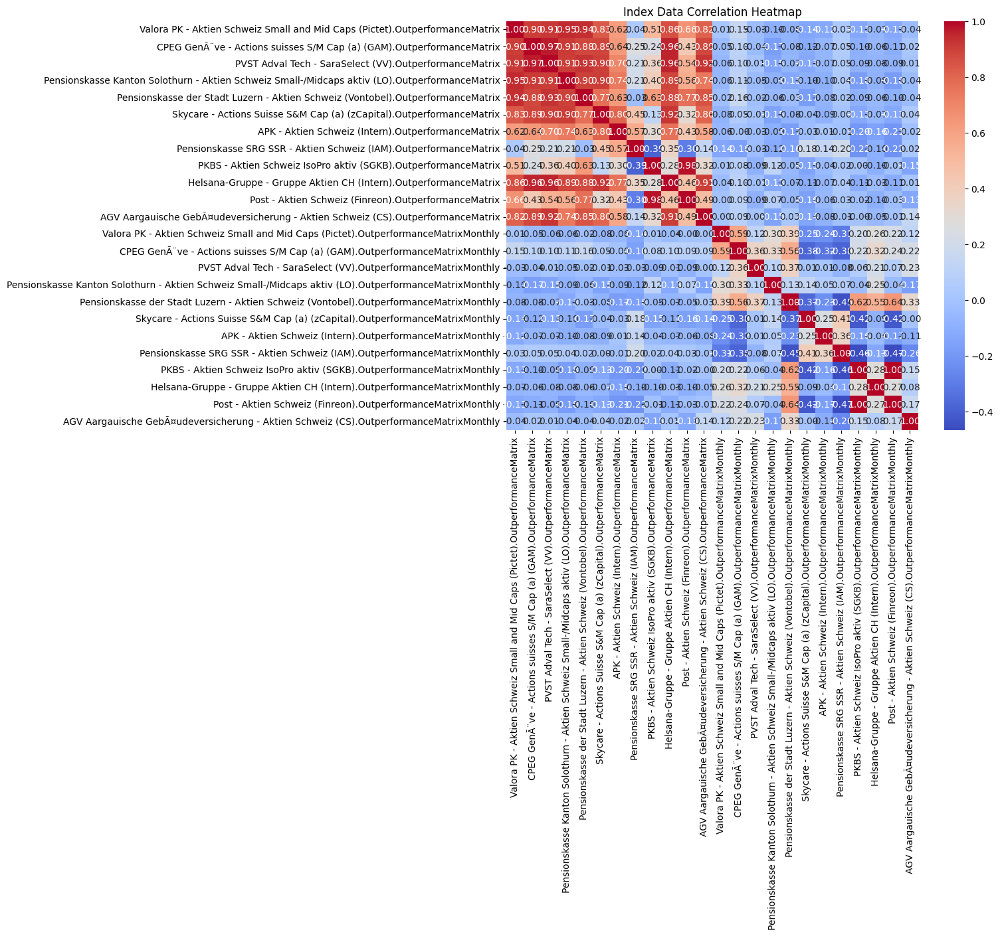

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlation_heatmap(data, title="Correlation Heatmap"):
    """
    Plot a correlation heatmap for the predictors.

    Args:
        data (pd.DataFrame): DataFrame of predictors.
        title (str): Title of the heatmap.
    """
    corr_matrix = data.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")
    plt.title(title)
    plt.show()

# Example usage
index_data = data_matrices["IndexData"]  # Replace with your dataset
plot_correlation_heatmap(index_data, title="Index Data Correlation Heatmap")


In [6]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import required libraries
import pandas as pd
import os
import statsmodels.api as sm

# Set up file paths
drive_dir = '/content/drive/My Drive'
file_path = os.path.join(drive_dir, 'DatasetsCombinedCommonPeriodMatrix.xlsx')

# Define function to load the dataset
def load_data(file_path):
    """
    Load the dataset from an Excel file.
    """
    try:
        # Load the Excel file
        data = pd.read_excel(file_path, sheet_name="DatasetsCombinedCommonPeriodMat", index_col=0)

        # Ensure the Date column is datetime
        data.index = pd.to_datetime(data.index, errors='coerce')

        # Extract Portfolio, Benchmark, and other matrices based on column naming
        portfolio_returns = data.filter(like='.PortfolioReturnMatrix')
        benchmark_returns = data.filter(like='.BenchmarkReturnMatrix')

        return {
            "PortfolioReturnMatrix": portfolio_returns,
            "BenchmarkReturnMatrix": benchmark_returns,
        }
    except Exception as e:
        print(f"Error loading data: {e}")
        return None

# Function to compare all portfolios to all benchmarks
def compare_portfolios_to_benchmarks(data_matrices):
    """
    Compare all portfolios to all benchmarks independently.

    Parameters:
    - data_matrices: dict, containing PortfolioReturnMatrix and BenchmarkReturnMatrix.

    Returns:
    - results: DataFrame summarizing regression results for each portfolio vs. each benchmark.
    """
    portfolio_returns = data_matrices['PortfolioReturnMatrix']
    benchmark_returns = data_matrices['BenchmarkReturnMatrix']

    results = []

    for portfolio in portfolio_returns.columns:
        for benchmark in benchmark_returns.columns:
            # Align data
            aligned_data = pd.concat([portfolio_returns[portfolio], benchmark_returns[benchmark]], axis=1).dropna()
            if aligned_data.empty:
                print(f"No overlapping data for Portfolio: {portfolio}, Benchmark: {benchmark}")
                continue

            y = aligned_data[portfolio]
            X = sm.add_constant(aligned_data[benchmark])  # Add intercept

            # Perform regression
            try:
                model = sm.OLS(y, X).fit()
                # Collect results
                results.append({
                    "Portfolio": portfolio,
                    "Benchmark": benchmark,
                    "Beta": model.params[1],  # Coefficient for the benchmark
                    "R-squared": model.rsquared,
                    "P-value": model.pvalues[1],  # P-value for the benchmark coefficient
                })
            except Exception as e:
                print(f"Error processing Portfolio: {portfolio}, Benchmark: {benchmark}: {e}")
                continue

    return pd.DataFrame(results)

# Load the data
data_matrices = load_data(file_path)

# Perform the analysis
if data_matrices:
    comparison_results = compare_portfolios_to_benchmarks(data_matrices)

    # Display results
    print("Regression Results Summary:")
    print(comparison_results)

    # Save results to CSV
    comparison_results.to_csv(os.path.join(drive_dir, 'Portfolio_Benchmark_Comparison.csv'), index=False)
    print(f"Results saved to {drive_dir}/Portfolio_Benchmark_Comparison.csv")
else:
    print("Failed to load data. Please check file path and structure.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-6-d7d23dbac932>:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  "Beta": model.params[1],  # Coefficient for the benchmark
<ipython-input-6-d7d23dbac932>:74: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  "P-value": model.pvalues[1],  # P-value for the benchmark coefficient
<ipython-input-6-d7d23dbac932>:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  "Beta": model.params[1],  # Coefficient for the benchmark
<ipytho

Regression Results Summary:
                                             Portfolio  \
0    Valora PK - Aktien Schweiz Small and Mid Caps ...   
1    Valora PK - Aktien Schweiz Small and Mid Caps ...   
2    Valora PK - Aktien Schweiz Small and Mid Caps ...   
3    Valora PK - Aktien Schweiz Small and Mid Caps ...   
4    Valora PK - Aktien Schweiz Small and Mid Caps ...   
..                                                 ...   
571  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
572  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
573  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
574  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
575  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   

                                             Benchmark      Beta  R-squared  \
0    Valora PK - Aktien Schweiz Small and Mid Caps ...  1.291618   0.996312   
1    CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GA...  1.307726   0.994397   
2    PVST Adval Tech - SaraSelect (VV)

<ipython-input-7-c4e550ab4e3b>:69: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  "Beta": model.params[1],  # Coefficient for the benchmark
<ipython-input-7-c4e550ab4e3b>:71: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  "P-value": model.pvalues[1],  # P-value for the benchmark coefficient
<ipython-input-7-c4e550ab4e3b>:69: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  "Beta": model.params[1],  # Coefficient for the benchmark
<ipytho

Regression Results Summary:
                                             Portfolio  \
0    Valora PK - Aktien Schweiz Small and Mid Caps ...   
1    Valora PK - Aktien Schweiz Small and Mid Caps ...   
2    Valora PK - Aktien Schweiz Small and Mid Caps ...   
3    Valora PK - Aktien Schweiz Small and Mid Caps ...   
4    Valora PK - Aktien Schweiz Small and Mid Caps ...   
..                                                 ...   
571  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
572  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
573  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
574  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   
575  AGV Aargauische GebÃ¤udeversicherung - Aktien ...   

                                             Benchmark      Beta  R-squared  \
0    Valora PK - Aktien Schweiz Small and Mid Caps ...  1.291618   0.996312   
1    CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GA...  1.307726   0.994397   
2    PVST Adval Tech - SaraSelect (VV)

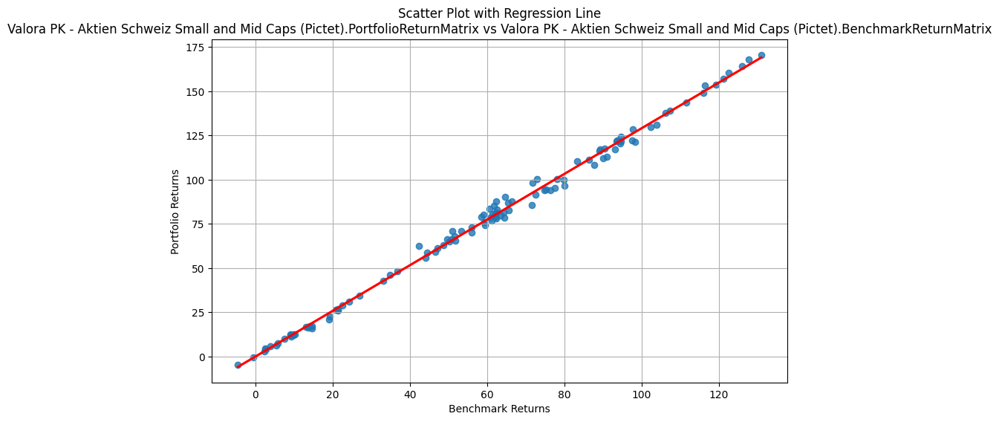

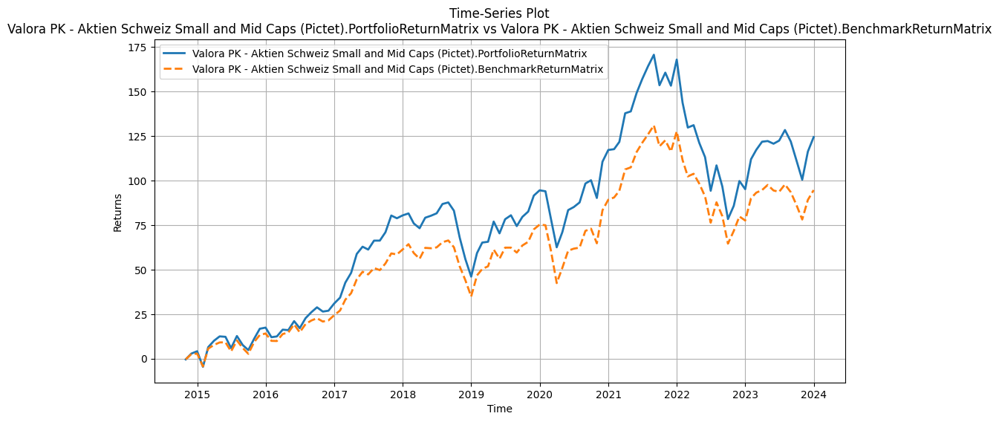

In [7]:
import pandas as pd
import os
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns

# Set up file paths
drive_dir = '/content/drive/My Drive'
file_path = os.path.join(drive_dir, 'DatasetsCombinedCommonPeriodMatrix.xlsx')

# Function to load the dataset
def load_data(file_path):
    """
    Load the dataset from an Excel file.
    """
    try:
        # Load the Excel file
        data = pd.read_excel(file_path, sheet_name="DatasetsCombinedCommonPeriodMat", index_col=0)

        # Ensure the Date column is datetime
        data.index = pd.to_datetime(data.index, errors='coerce')

        # Extract Portfolio, Benchmark, and other matrices based on column naming
        portfolio_returns = data.filter(like='.PortfolioReturnMatrix')
        benchmark_returns = data.filter(like='.BenchmarkReturnMatrix')

        return {
            "PortfolioReturnMatrix": portfolio_returns,
            "BenchmarkReturnMatrix": benchmark_returns,
        }
    except Exception as e:
        print(f"Error loading data: {e}")
        return None

# Function to compare all portfolios to all benchmarks
def compare_portfolios_to_benchmarks(data_matrices):
    """
    Compare all portfolios to all benchmarks independently.

    Parameters:
    - data_matrices: dict, containing PortfolioReturnMatrix and BenchmarkReturnMatrix.

    Returns:
    - results: DataFrame summarizing regression results for each portfolio vs. each benchmark.
    """
    portfolio_returns = data_matrices['PortfolioReturnMatrix']
    benchmark_returns = data_matrices['BenchmarkReturnMatrix']

    results = []

    for portfolio in portfolio_returns.columns:
        for benchmark in benchmark_returns.columns:
            # Align data
            aligned_data = pd.concat([portfolio_returns[portfolio], benchmark_returns[benchmark]], axis=1).dropna()
            if aligned_data.empty:
                print(f"No overlapping data for Portfolio: {portfolio}, Benchmark: {benchmark}")
                continue

            y = aligned_data[portfolio]
            X = sm.add_constant(aligned_data[benchmark])  # Add intercept

            # Perform regression
            try:
                model = sm.OLS(y, X).fit()
                # Collect results
                results.append({
                    "Portfolio": portfolio,
                    "Benchmark": benchmark,
                    "Beta": model.params[1],  # Coefficient for the benchmark
                    "R-squared": model.rsquared,
                    "P-value": model.pvalues[1],  # P-value for the benchmark coefficient
                })
            except Exception as e:
                print(f"Error processing Portfolio: {portfolio}, Benchmark: {benchmark}: {e}")
                continue

    return pd.DataFrame(results)

# Visualization function
def visualize_portfolio_vs_benchmark(data_matrices, portfolio_col, benchmark_col):
    """
    Visualize the relationship between a portfolio and a benchmark.

    Parameters:
    - data_matrices: dict, containing PortfolioReturnMatrix and BenchmarkReturnMatrix.
    - portfolio_col: str, column name of the portfolio to visualize.
    - benchmark_col: str, column name of the benchmark to visualize.
    """
    portfolio_returns = data_matrices['PortfolioReturnMatrix'][portfolio_col]
    benchmark_returns = data_matrices['BenchmarkReturnMatrix'][benchmark_col]

    # Align data
    aligned_data = pd.concat([portfolio_returns, benchmark_returns], axis=1).dropna()
    aligned_data.columns = ['Portfolio', 'Benchmark']

    # Scatter plot with regression line
    plt.figure(figsize=(10, 6))
    sns.regplot(x='Benchmark', y='Portfolio', data=aligned_data, line_kws={"color": "red"}, ci=None)
    plt.title(f"Scatter Plot with Regression Line\n{portfolio_col} vs {benchmark_col}")
    plt.xlabel("Benchmark Returns")
    plt.ylabel("Portfolio Returns")
    plt.grid()
    plt.show()

    # Time-series line plot
    plt.figure(figsize=(12, 6))
    plt.plot(aligned_data.index, aligned_data['Portfolio'], label=portfolio_col, linewidth=2)
    plt.plot(aligned_data.index, aligned_data['Benchmark'], label=benchmark_col, linestyle="--", linewidth=2)
    plt.title(f"Time-Series Plot\n{portfolio_col} vs {benchmark_col}")
    plt.xlabel("Time")
    plt.ylabel("Returns")
    plt.legend()
    plt.grid()
    plt.show()

# Main execution block
if __name__ == "__main__":
    # Load the data
    data_matrices = load_data(file_path)

    if data_matrices:
        # Perform the analysis
        comparison_results = compare_portfolios_to_benchmarks(data_matrices)

        # Display results
        print("Regression Results Summary:")
        print(comparison_results)

        # Save results to CSV
        comparison_results.to_csv(os.path.join(drive_dir, 'Portfolio_Benchmark_Comparison.csv'), index=False)
        print(f"Results saved to {drive_dir}/Portfolio_Benchmark_Comparison.csv")

        # Visualization example: Replace with actual column names
        portfolio_example = data_matrices['PortfolioReturnMatrix'].columns[0]
        benchmark_example = data_matrices['BenchmarkReturnMatrix'].columns[0]
        visualize_portfolio_vs_benchmark(data_matrices, portfolio_example, benchmark_example)
    else:
        print("Failed to load data. Please check file path and structure.")


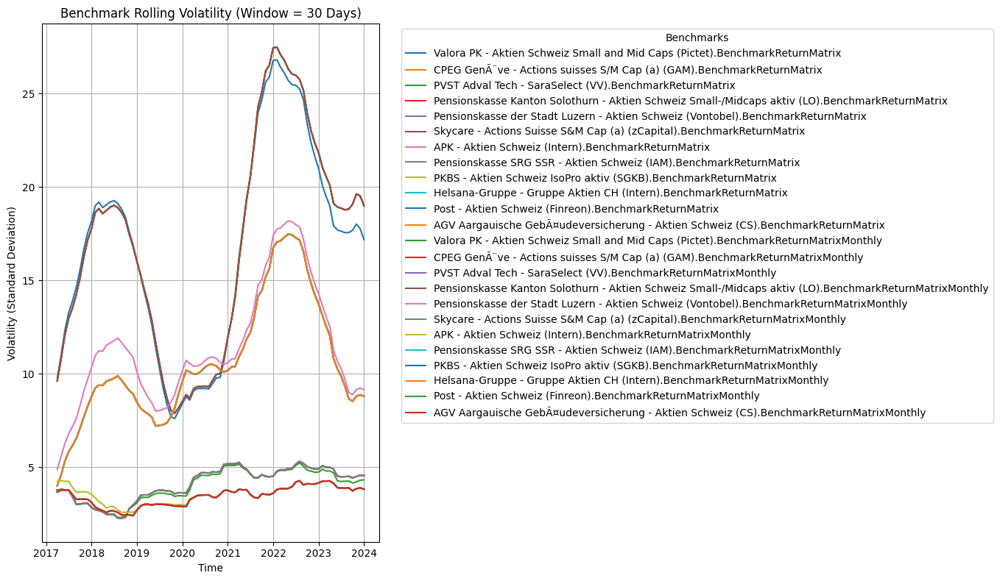

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_benchmark_volatility(data_matrices, window=30):
    """
    Analyze and visualize benchmark volatility trends using rolling standard deviation.

    Parameters:
    - data_matrices: dict, containing BenchmarkReturnMatrix.
    - window: int, rolling window size (default is 30).

    Displays:
    - Line plot of rolling volatility for each benchmark with legend outside the plot.
    """
    # Extract the benchmark return matrix
    benchmark_returns = data_matrices['BenchmarkReturnMatrix']

    # Calculate rolling volatility
    rolling_volatility = benchmark_returns.rolling(window=window).std()

    # Plot rolling volatility
    plt.figure(figsize=(14, 8))
    for column in rolling_volatility.columns:
        plt.plot(rolling_volatility.index, rolling_volatility[column], label=column)

    # Customize the plot
    plt.title(f"Benchmark Rolling Volatility (Window = {window} Days)")
    plt.xlabel("Time")
    plt.ylabel("Volatility (Standard Deviation)")
    plt.grid()

    # Place the legend outside the plot
    plt.legend(loc="upper left", bbox_to_anchor=(1.05, 1), title="Benchmarks")
    plt.tight_layout()
    plt.show()

# Main execution block
if __name__ == "__main__":
    # Load the data
    data_matrices = load_data(file_path)

    if data_matrices:
        # Analyze and visualize benchmark volatility
        analyze_benchmark_volatility(data_matrices, window=30)
    else:
        print("Failed to load data. Please check file path and structure.")



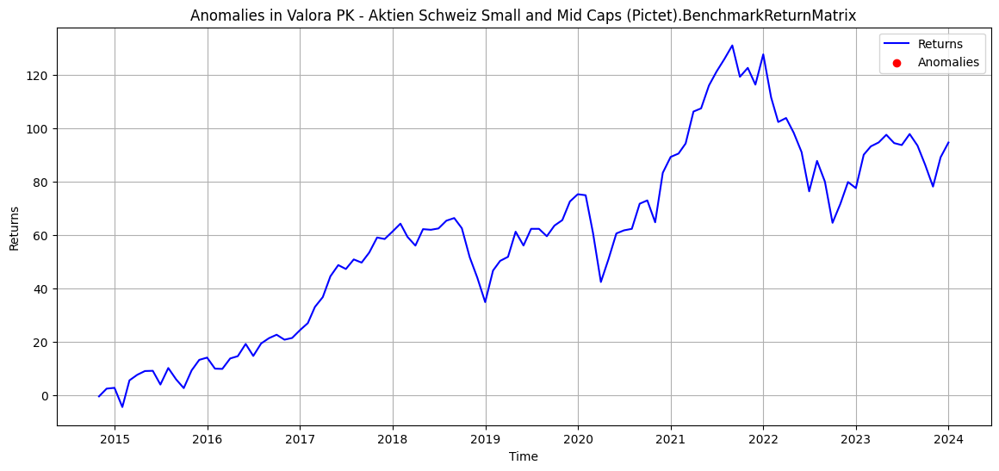

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def detect_anomalies_zscore(data_matrices, threshold=2.5):
    """
    Detect anomalies in benchmark returns using the Z-score method.

    Parameters:
    - data_matrices: dict, containing BenchmarkReturnMatrix.
    - threshold: float, Z-score threshold for anomaly detection.

    Returns:
    - anomalies: DataFrame with anomaly flags for each benchmark.
    """
    benchmark_returns = data_matrices['BenchmarkReturnMatrix']

    # Calculate mean and standard deviation
    mean = benchmark_returns.mean()
    std = benchmark_returns.std()

    # Compute Z-scores
    z_scores = (benchmark_returns - mean) / std

    # Flag anomalies
    anomalies = (np.abs(z_scores) > threshold).astype(int)  # 1 indicates anomaly
    return anomalies

# Visualization of anomalies
def plot_anomalies(benchmark_returns, anomalies, benchmark_name):
    """
    Plot benchmark returns with anomalies highlighted.

    Parameters:
    - benchmark_returns: Series, returns of a specific benchmark.
    - anomalies: Series, anomaly flags for the benchmark.
    - benchmark_name: str, name of the benchmark.
    """
    plt.figure(figsize=(14, 6))
    plt.plot(benchmark_returns.index, benchmark_returns, label="Returns", color="blue")
    plt.scatter(benchmark_returns.index[anomalies == 1],
                benchmark_returns[anomalies == 1],
                color="red", label="Anomalies", zorder=5)
    plt.title(f"Anomalies in {benchmark_name}")
    plt.xlabel("Time")
    plt.ylabel("Returns")
    plt.legend()
    plt.grid()
    plt.show()

# Main execution block
if __name__ == "__main__":
    # Load the data
    data_matrices = load_data(file_path)

    if data_matrices:
        # Detect anomalies
        anomalies = detect_anomalies_zscore(data_matrices, threshold=2.5)

        # Example: Plot anomalies for the first benchmark
        benchmark_name = data_matrices['BenchmarkReturnMatrix'].columns[0]
        benchmark_returns = data_matrices['BenchmarkReturnMatrix'][benchmark_name]
        anomaly_flags = anomalies[benchmark_name]
        plot_anomalies(benchmark_returns, anomaly_flags, benchmark_name)
    else:
        print("Failed to load data. Please check file path and structure.")



Anomalies detected using Isolation Forest:
Anomaly_Flag
 1    109
-1      2
Name: count, dtype: int64


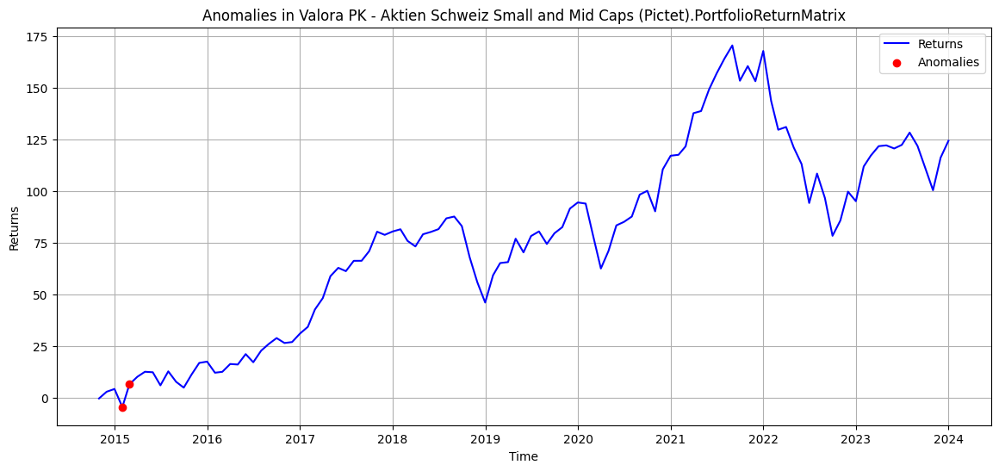

In [12]:
from sklearn.ensemble import IsolationForest
import pandas as pd
import matplotlib.pyplot as plt

def detect_anomalies_isolation_forest_multivariate(data_matrices, contamination=0.01):
    """
    Detect anomalies in returns using Isolation Forest, considering all portfolio and benchmark returns.

    Parameters:
    - data_matrices: dict, containing PortfolioReturnMatrix and BenchmarkReturnMatrix.
    - contamination: float, proportion of anomalies expected in the data.

    Returns:
    - anomalies: DataFrame with anomaly flags for each time index.
    """
    # Combine portfolio and benchmark returns into a single DataFrame
    combined_returns = pd.concat(
        [data_matrices['PortfolioReturnMatrix'], data_matrices['BenchmarkReturnMatrix']],
        axis=1
    ).dropna()  # Drop rows with missing values

    # Train Isolation Forest model
    model = IsolationForest(contamination=contamination, random_state=42)
    model.fit(combined_returns)

    # Predict anomalies (-1 indicates anomaly)
    anomaly_flags = model.predict(combined_returns)

    # Add anomaly flags to the original DataFrame
    anomalies = pd.DataFrame(
        anomaly_flags,
        index=combined_returns.index,
        columns=['Anomaly_Flag']
    )
    return combined_returns, anomalies

# Visualization of anomalies in a specific benchmark or portfolio
def plot_anomalies_multivariate(combined_returns, anomalies, column_name):
    """
    Plot returns with anomalies highlighted for a specific column.

    Parameters:
    - combined_returns: DataFrame, combined portfolio and benchmark returns.
    - anomalies: DataFrame, anomaly flags.
    - column_name: str, name of the column to visualize.
    """
    plt.figure(figsize=(14, 6))
    plt.plot(combined_returns.index, combined_returns[column_name], label="Returns", color="blue")
    plt.scatter(
        combined_returns.index[anomalies['Anomaly_Flag'] == -1],
        combined_returns[column_name][anomalies['Anomaly_Flag'] == -1],
        color="red", label="Anomalies", zorder=5
    )
    plt.title(f"Anomalies in {column_name}")
    plt.xlabel("Time")
    plt.ylabel("Returns")
    plt.legend()
    plt.grid()
    plt.show()

# Main execution block
if __name__ == "__main__":
    # Load the data
    data_matrices = load_data(file_path)

    if data_matrices:
        # Detect anomalies
        combined_returns, anomalies = detect_anomalies_isolation_forest_multivariate(data_matrices, contamination=0.01)

        # Display anomalies summary
        print("Anomalies detected using Isolation Forest:")
        print(anomalies['Anomaly_Flag'].value_counts())  # Count normal (-1) vs anomalies (1)

        # Example: Plot anomalies for a specific portfolio or benchmark
        column_name = combined_returns.columns[0]  # Replace with desired column
        plot_anomalies_multivariate(combined_returns, anomalies, column_name)
    else:
        print("Failed to load data. Please check file path and structure.")



In [ ]:
# Simulating the process of loading and combining numerical and textual datasets for anomaly detection.
# This script uses logic derived from the two files uploaded.

# Placeholder to combine both approaches (numerical + text).
# Adapt this by combining features after inspecting structures.

# Importing necessary libraries for processing
import pandas as pd
import numpy as np

# Placeholder: Define mock functions for text and numerical processing based on the uploaded files.
# Text data embeddings function placeholder
def process_text_data(file_path):
    """
    Mock function to represent processing text data as outlined in the second script.
    """
    # Load text data logic from the second script (if saved)
    print(f"Processing text data from {file_path}...")
    # Example embedding placeholder (to replace with HuggingFace or equivalent embeddings).
    text_embeddings = np.random.rand(100, 768)  # Assuming 100 samples with 768-d embeddings.
    return text_embeddings

# Numerical data extraction function placeholder
def process_numerical_data(file_path):
    """
    Mock function to process numerical data as outlined in the first script.
    """
    print(f"Processing numerical data from {file_path}...")
    # Example normalized numerical data placeholder
    numerical_features = np.random.rand(100, 50)  # Assuming 100 samples with 50 numerical features.
    return numerical_features

# File paths for numerical and textual datasets.
numerical_file = "/mnt/data/regression_benchmark_porftolio (1).py"
text_file = "/mnt/data/kopie_von_text_vectorization_and_top_terms_over_time.py"

# Process both datasets
numerical_data = process_numerical_data(numerical_file)
text_data_embeddings = process_text_data(text_file)

# Combine both datasets
combined_features = np.hstack([numerical_data, text_data_embeddings])

print("Combined Features Shape:", combined_features.shape)

# Placeholder: Train anomaly detection on combined features
from sklearn.ensemble import IsolationForest

# Train Isolation Forest on combined features
anomaly_model = IsolationForest(contamination=0.01, random_state=42)
anomaly_model.fit(combined_features)

# Predict anomalies (-1 indicates anomaly)
anomalies = anomaly_model.predict(combined_features)
anomalies_count = (anomalies == -1).sum()

print(f"Anomalies Detected: {anomalies_count}")

# Example output shows combination and training steps. Actual alignment logic will depend on shared keys.



In [18]:
def validate_anomalies_visual(combined_returns, anomalies, column_name=None, window=30):
    """
    Validate anomalies by visualizing them with rolling statistics.

    Parameters:
    - combined_returns: DataFrame, combined portfolio and benchmark returns.
    - anomalies: DataFrame, anomaly flags.
    - column_name: str or None, name of the column to visualize. If None, the first column is used.
    - window: int, rolling window size for statistics.
    """
    # Handle missing column_name by selecting the first available column
    if column_name not in combined_returns.columns:
        print(f"Column '{column_name}' not found. Using the first available column.")
        column_name = combined_returns.columns[0]  # Default to the first column

    # Calculate rolling statistics
    rolling_mean = combined_returns[column_name].rolling(window=window).mean()
    rolling_std = combined_returns[column_name].rolling(window=window).std()

    # Plot returns with rolling stats and anomalies
    plt.figure(figsize=(14, 6))
    plt.plot(combined_returns.index, combined_returns[column_name], label="Returns", color="blue")
    plt.plot(combined_returns.index, rolling_mean, label=f"Rolling Mean ({window} days)", color="green", linestyle="--")
    plt.fill_between(
        combined_returns.index,
        rolling_mean - 2 * rolling_std,
        rolling_mean + 2 * rolling_std,
        color="green", alpha=0.2, label="±2 Std Dev"
    )
    plt.scatter(
        combined_returns.index[anomalies['Anomaly_Flag'] == -1],
        combined_returns[column_name][anomalies['Anomaly_Flag'] == -1],
        color="red", label="Anomalies", zorder=5
    )
    plt.title(f"Anomaly Validation: {column_name}")
    plt.xlabel("Time")
    plt.ylabel("Returns")
    plt.legend()
    plt.grid()
    plt.show()



Executing anomaly validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrix


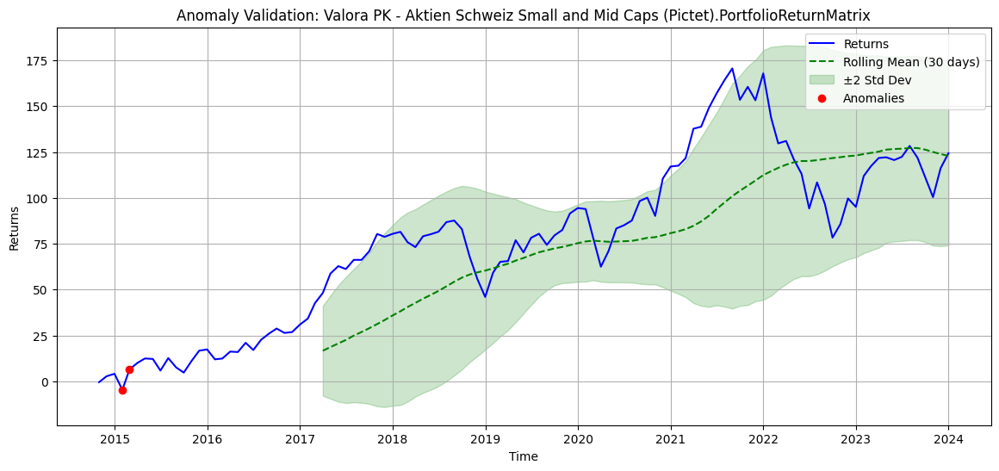

Executing anomaly validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).PortfolioReturnMatrix


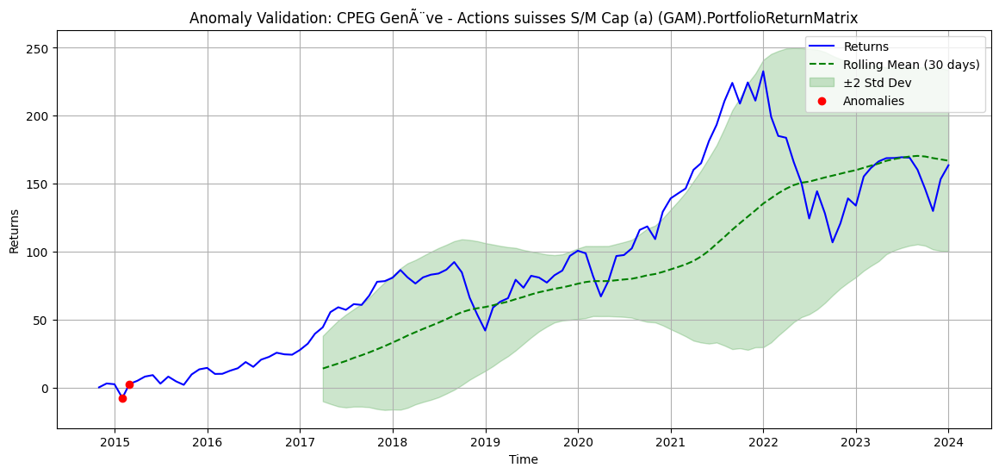

Executing anomaly validation for column: PVST Adval Tech - SaraSelect (VV).PortfolioReturnMatrix


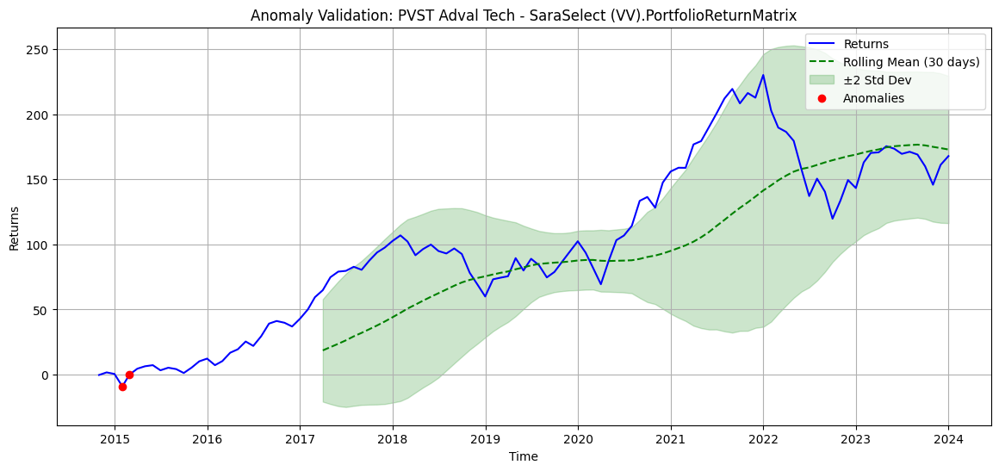

Executing anomaly validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).PortfolioReturnMatrix


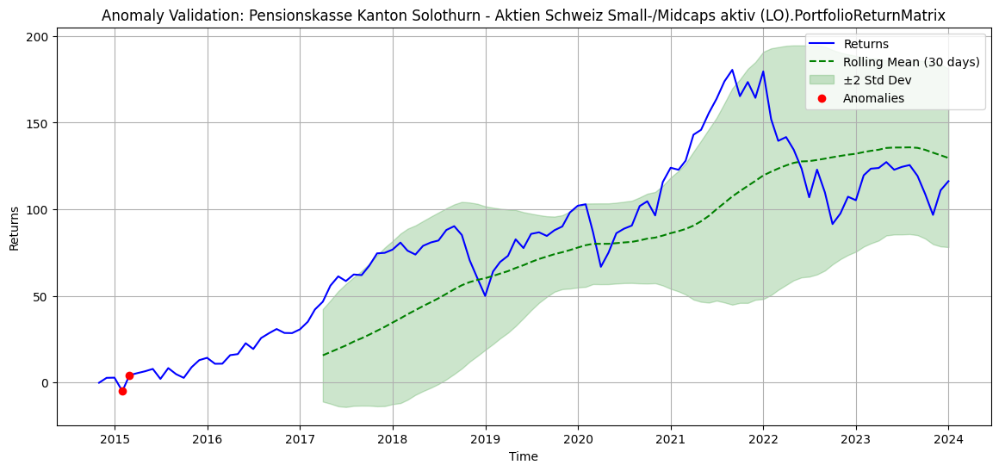

Executing anomaly validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).PortfolioReturnMatrix


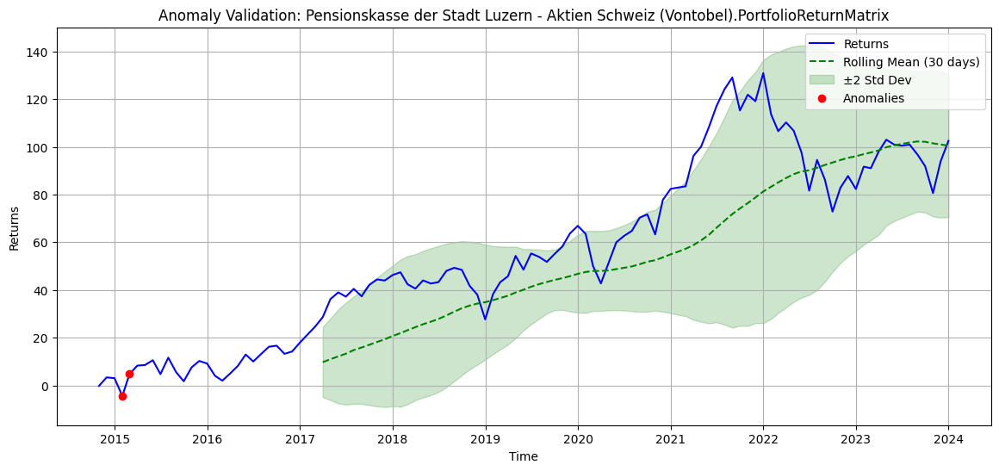

Executing anomaly validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).PortfolioReturnMatrix


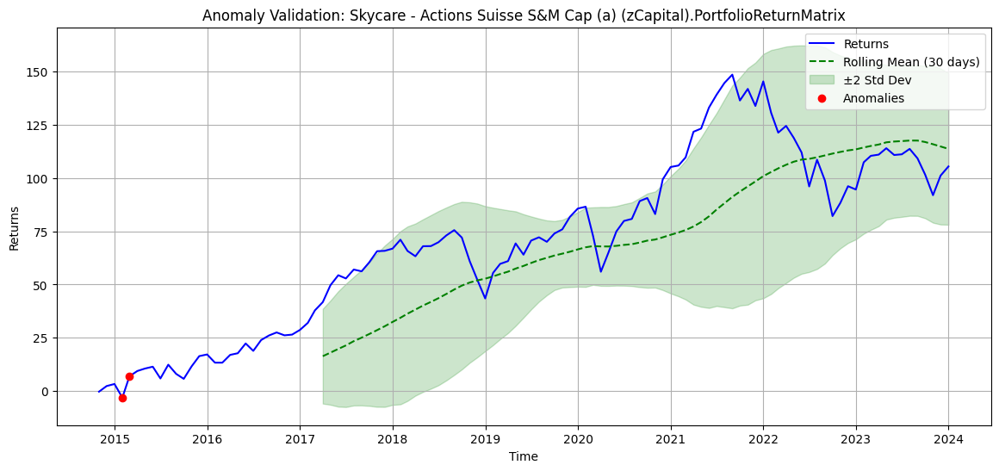

Executing anomaly validation for column: APK - Aktien Schweiz (Intern).PortfolioReturnMatrix


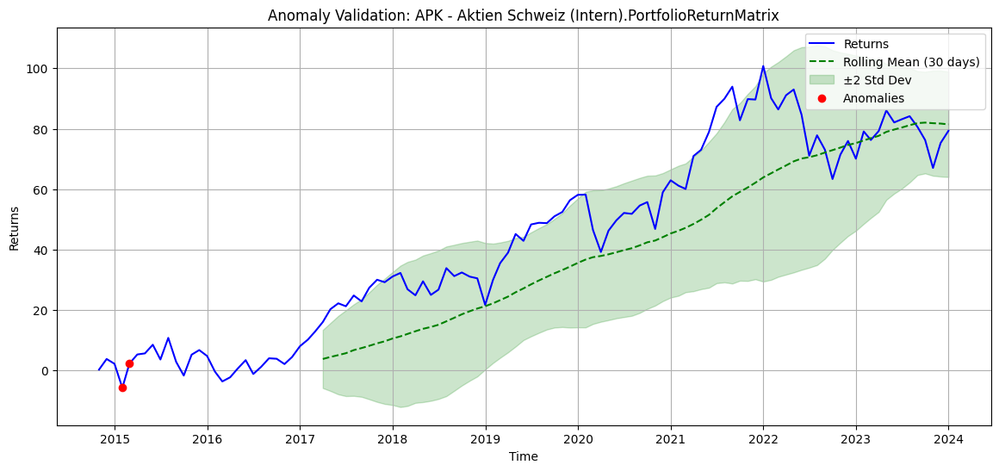

Executing anomaly validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).PortfolioReturnMatrix


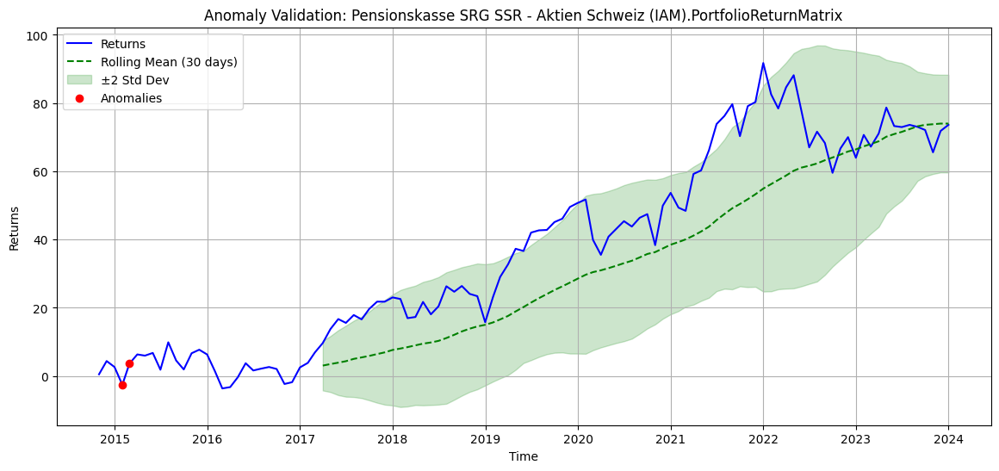

Executing anomaly validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).PortfolioReturnMatrix


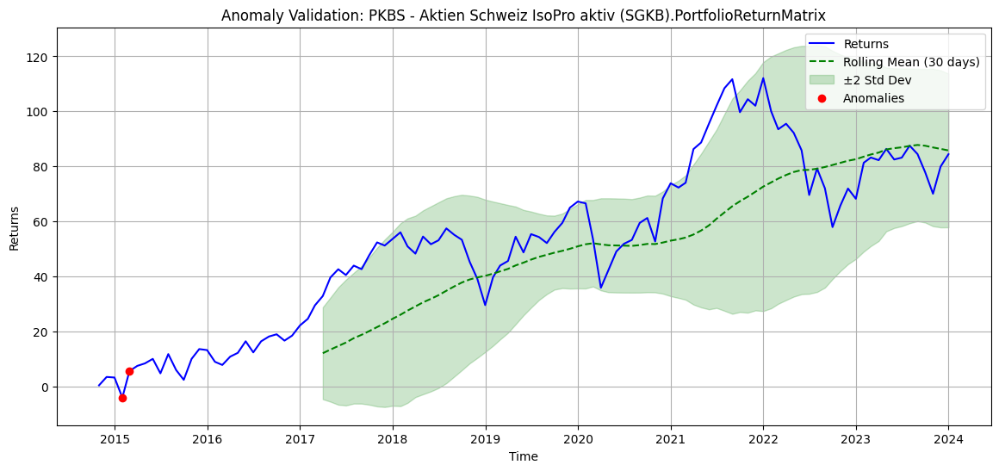

Executing anomaly validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).PortfolioReturnMatrix


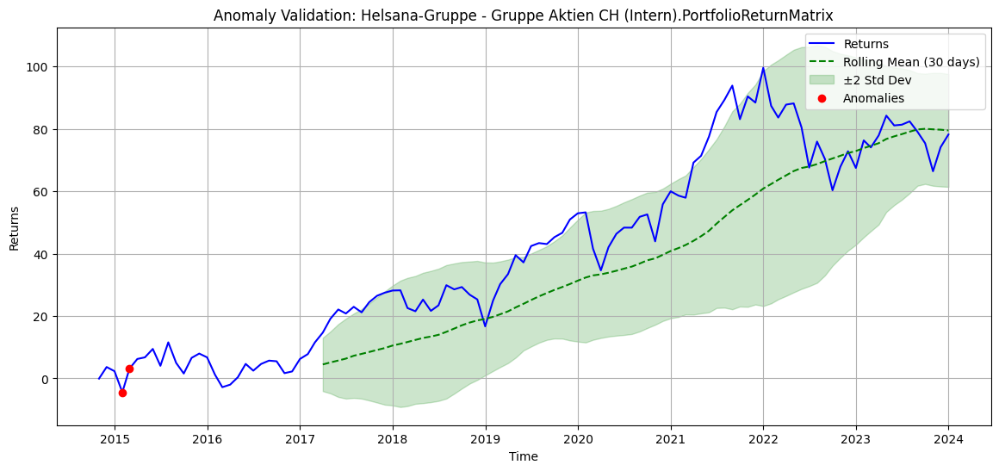

Executing anomaly validation for column: Post - Aktien Schweiz (Finreon).PortfolioReturnMatrix


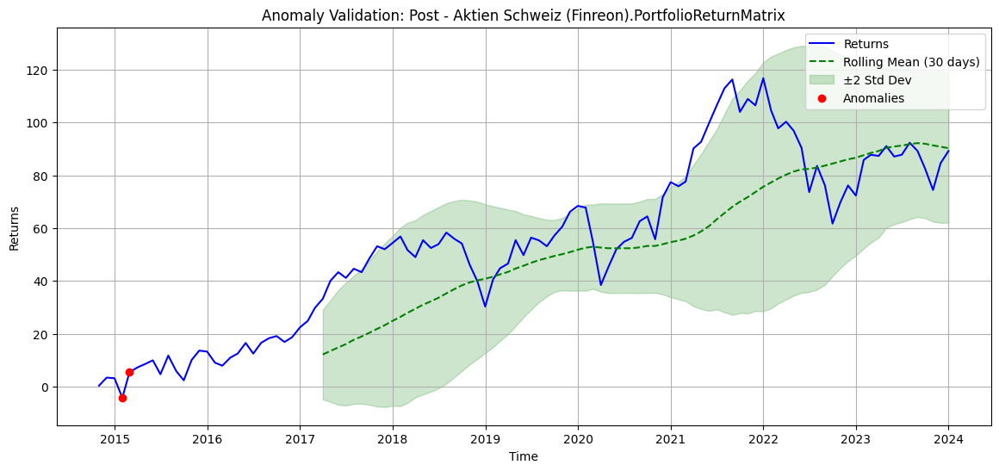

Executing anomaly validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).PortfolioReturnMatrix


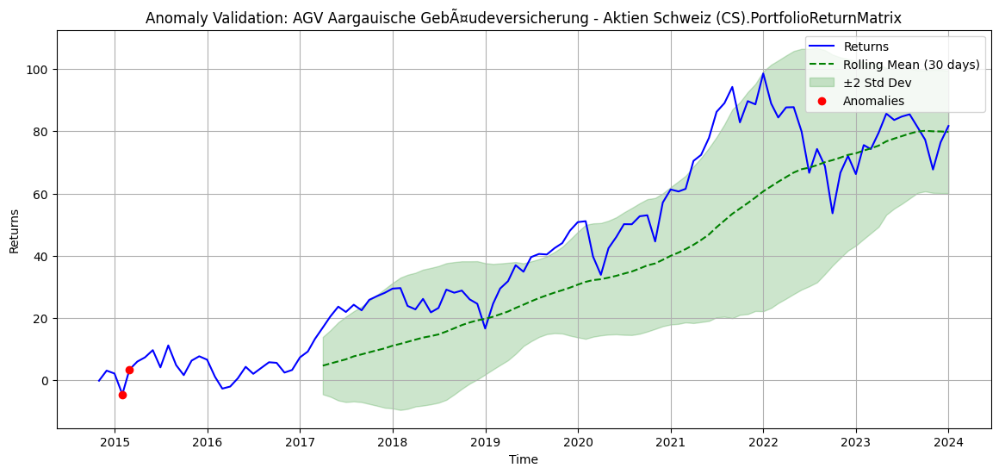

Executing anomaly validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrixMonthly


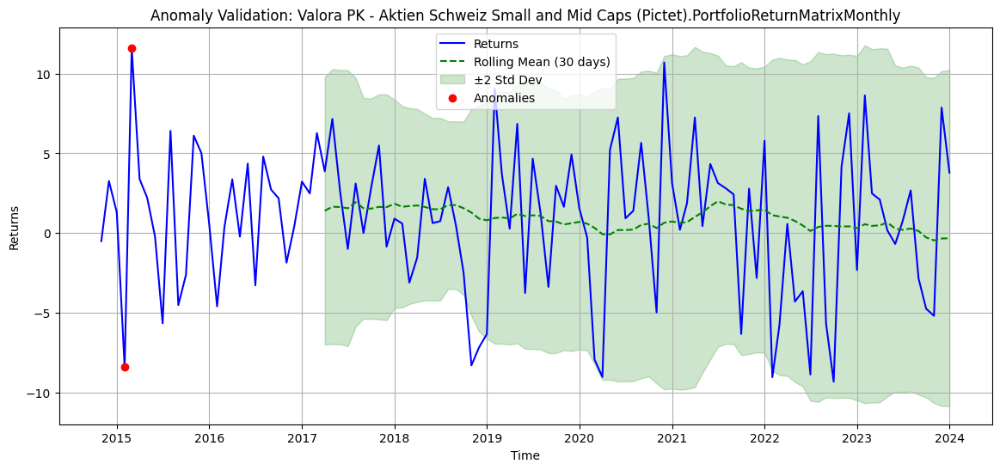

Executing anomaly validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).PortfolioReturnMatrixMonthly


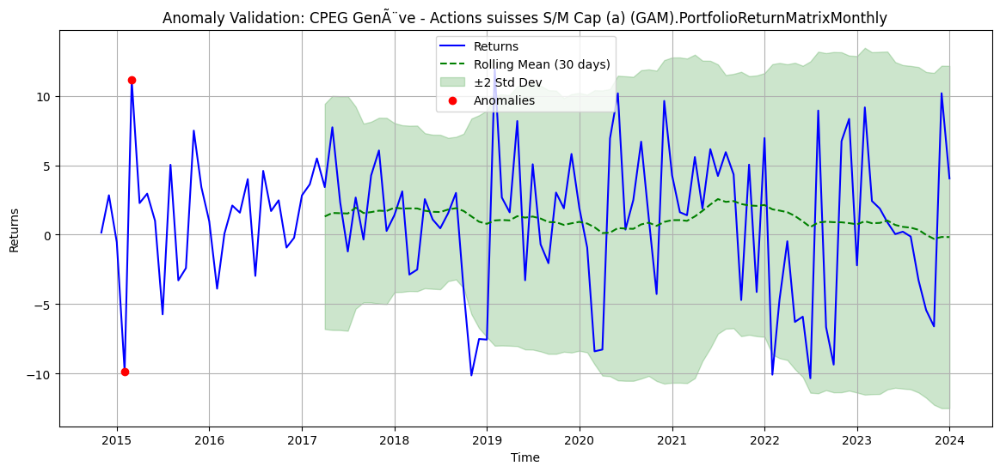

Executing anomaly validation for column: PVST Adval Tech - SaraSelect (VV).PortfolioReturnMatrixMonthly


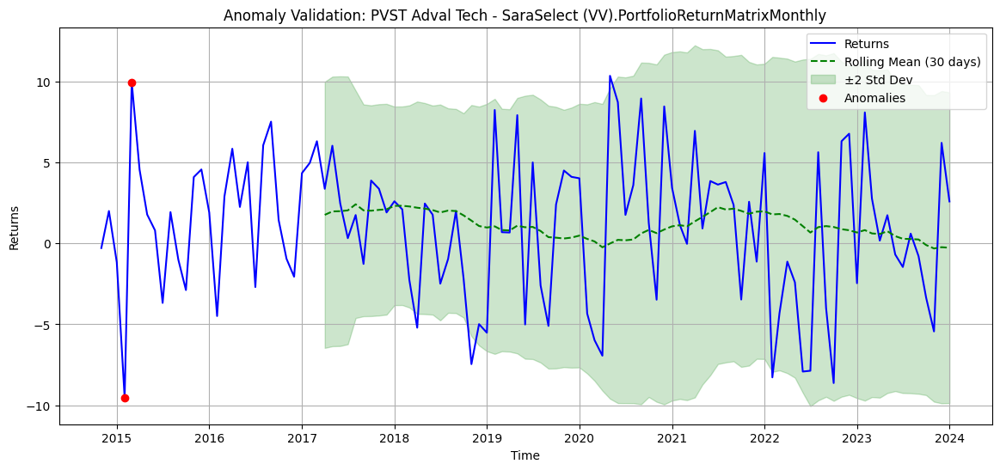

Executing anomaly validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).PortfolioReturnMatrixMonthly


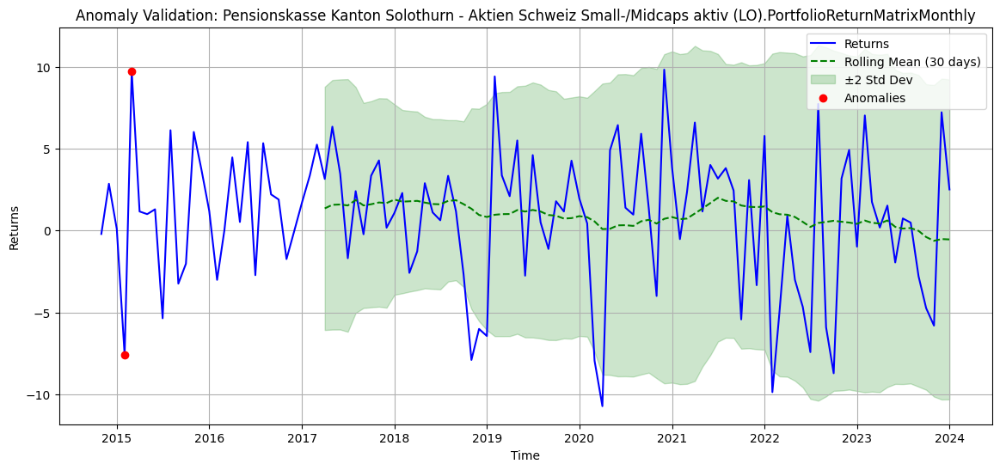

Executing anomaly validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).PortfolioReturnMatrixMonthly


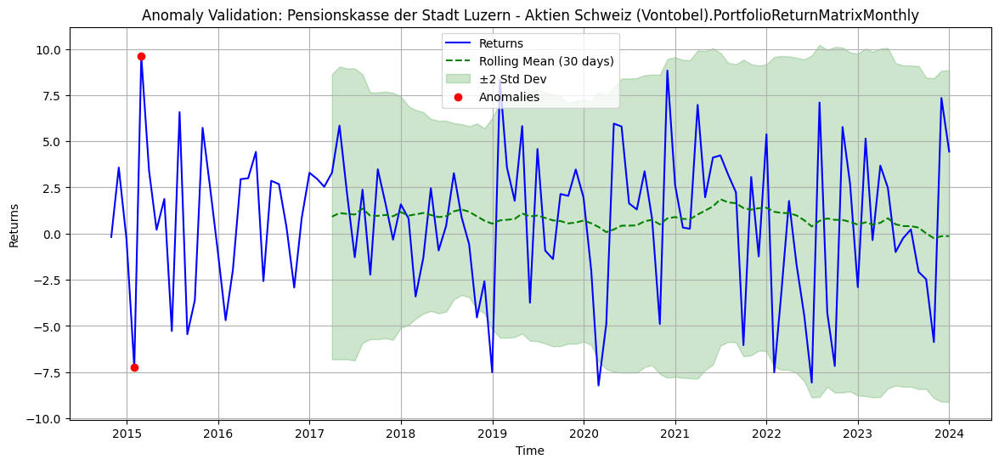

Executing anomaly validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).PortfolioReturnMatrixMonthly


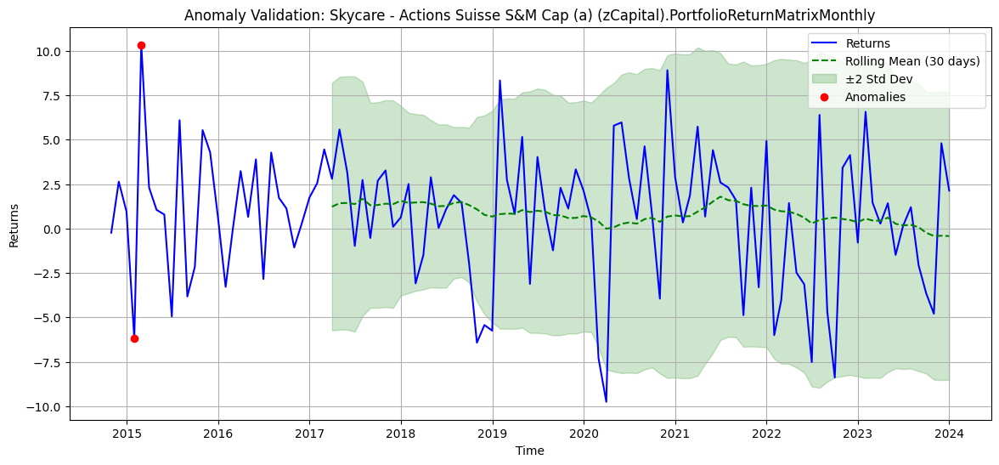

Executing anomaly validation for column: APK - Aktien Schweiz (Intern).PortfolioReturnMatrixMonthly


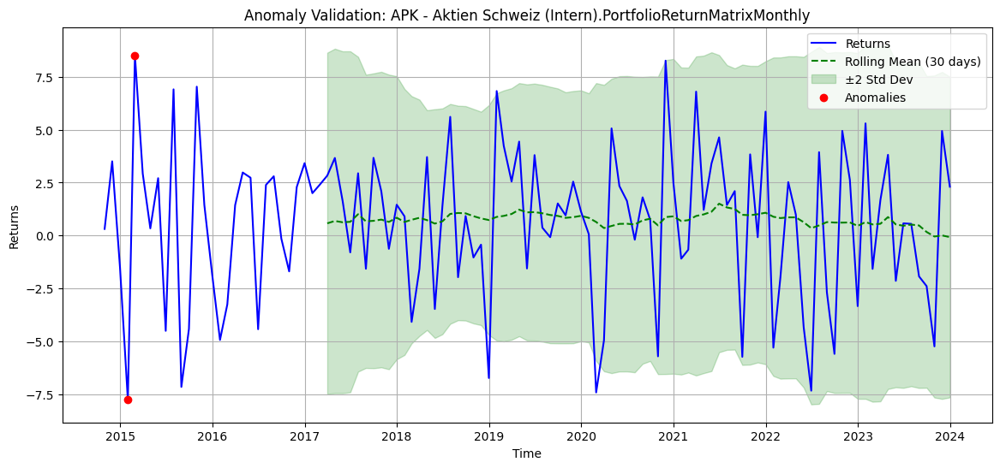

Executing anomaly validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).PortfolioReturnMatrixMonthly


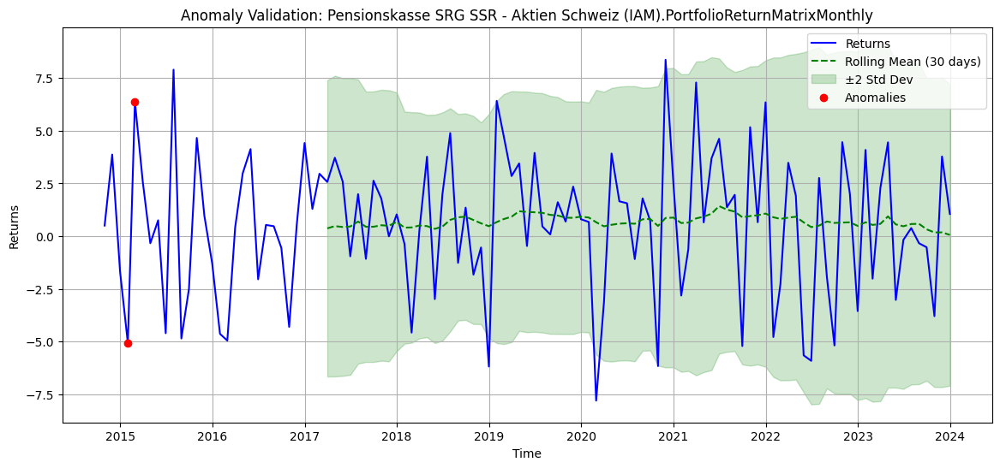

Executing anomaly validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).PortfolioReturnMatrixMonthly


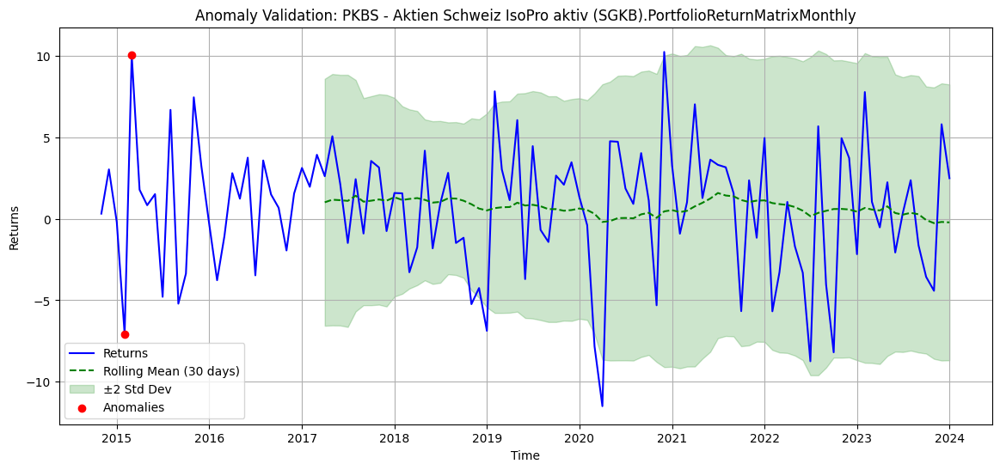

Executing anomaly validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).PortfolioReturnMatrixMonthly


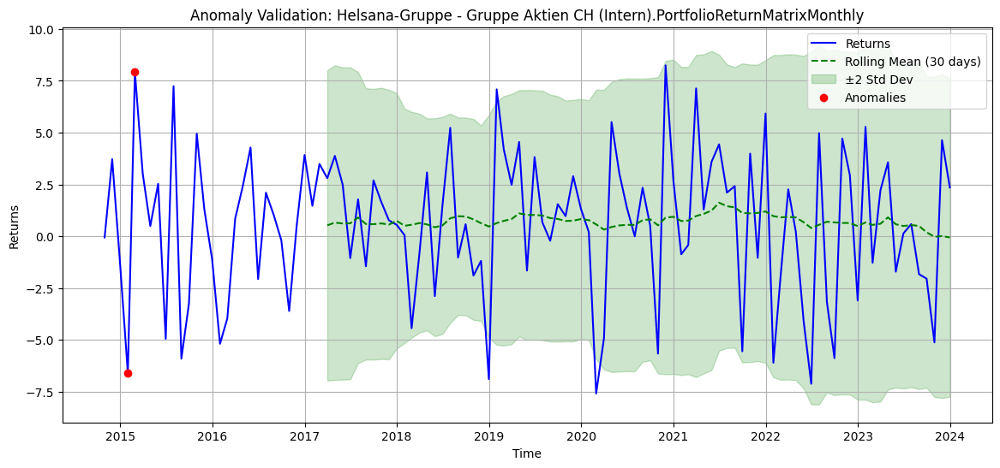

Executing anomaly validation for column: Post - Aktien Schweiz (Finreon).PortfolioReturnMatrixMonthly


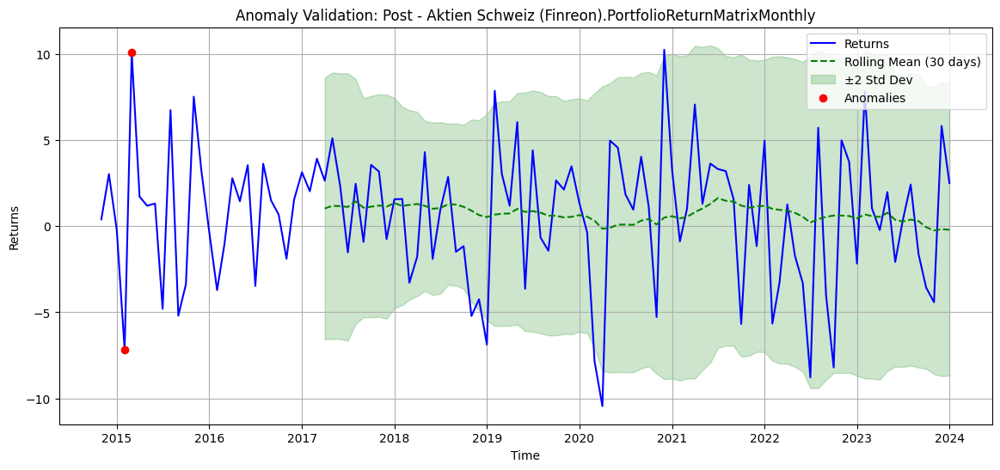

Executing anomaly validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).PortfolioReturnMatrixMonthly


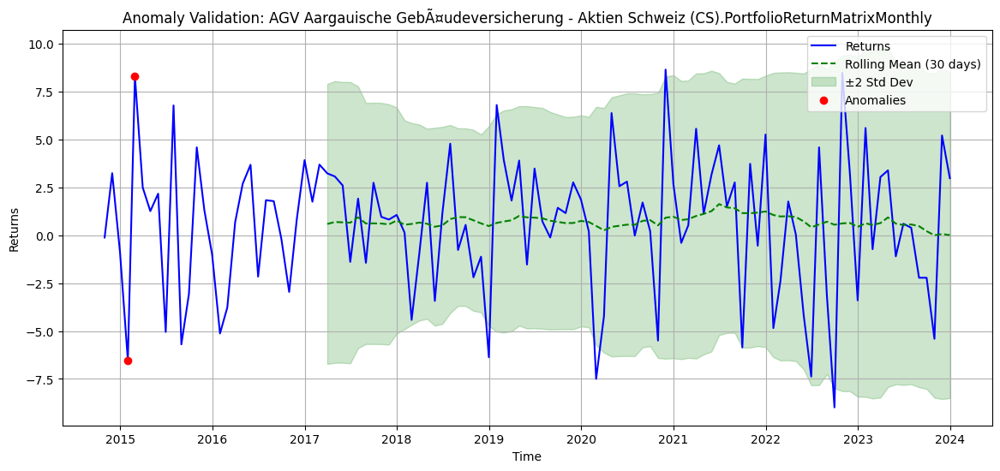

Executing anomaly validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).BenchmarkReturnMatrix


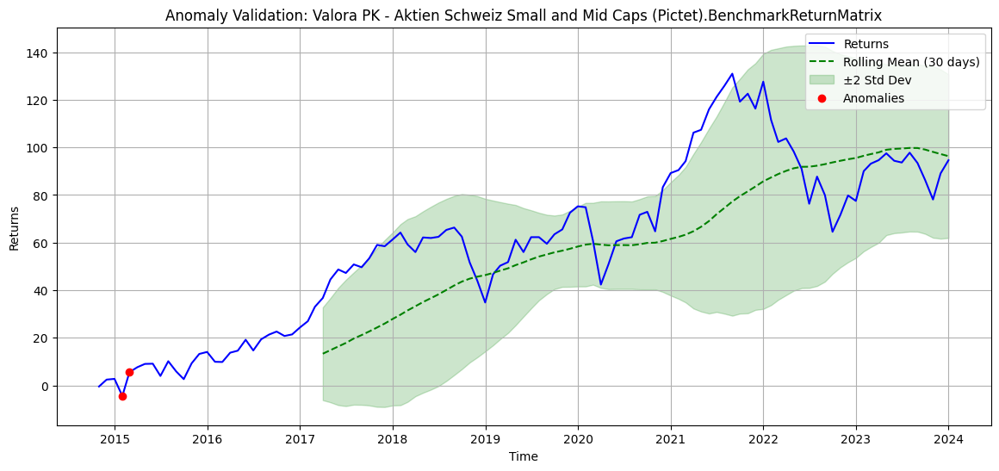

Executing anomaly validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).BenchmarkReturnMatrix


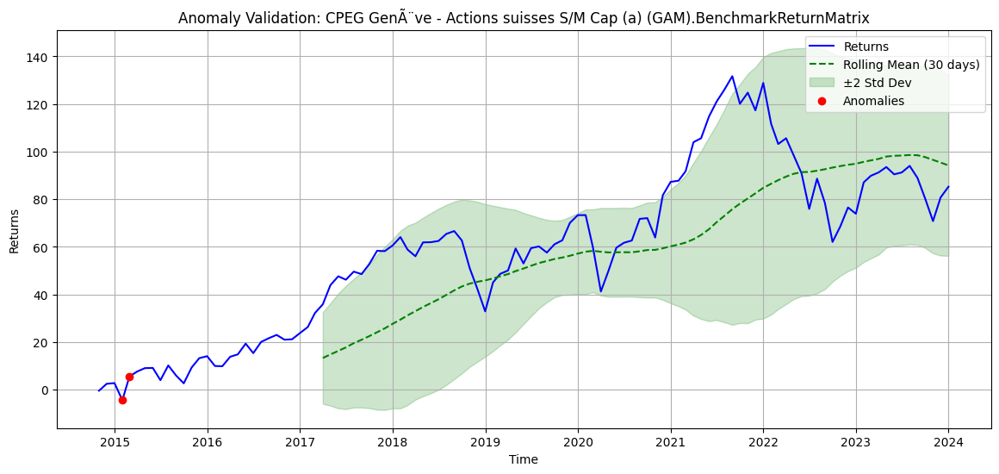

Executing anomaly validation for column: PVST Adval Tech - SaraSelect (VV).BenchmarkReturnMatrix


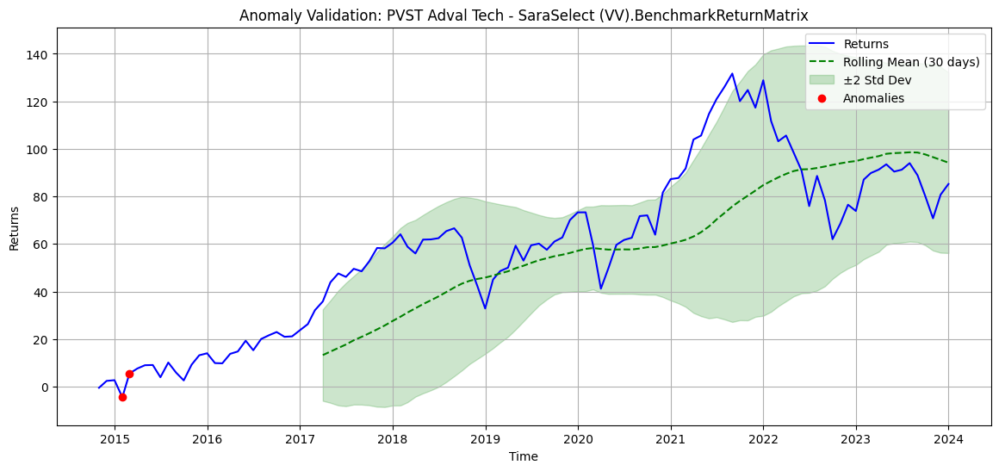

Executing anomaly validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).BenchmarkReturnMatrix


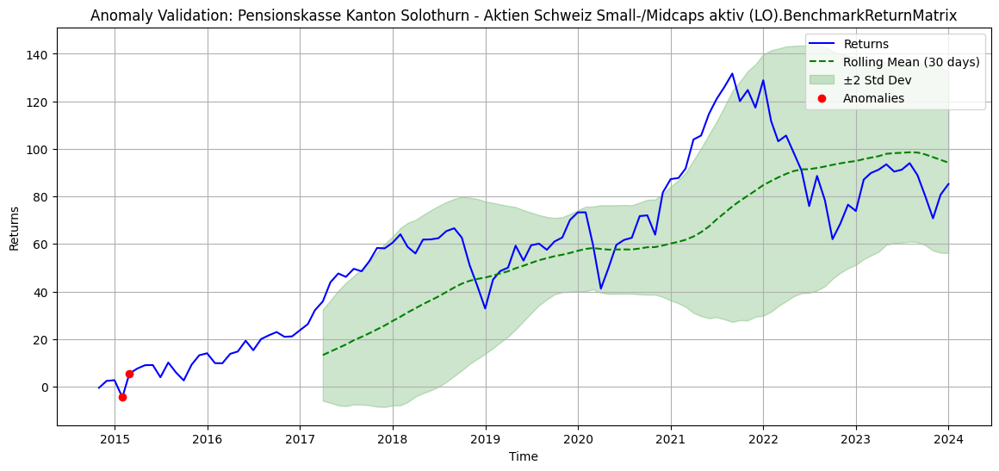

Executing anomaly validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).BenchmarkReturnMatrix


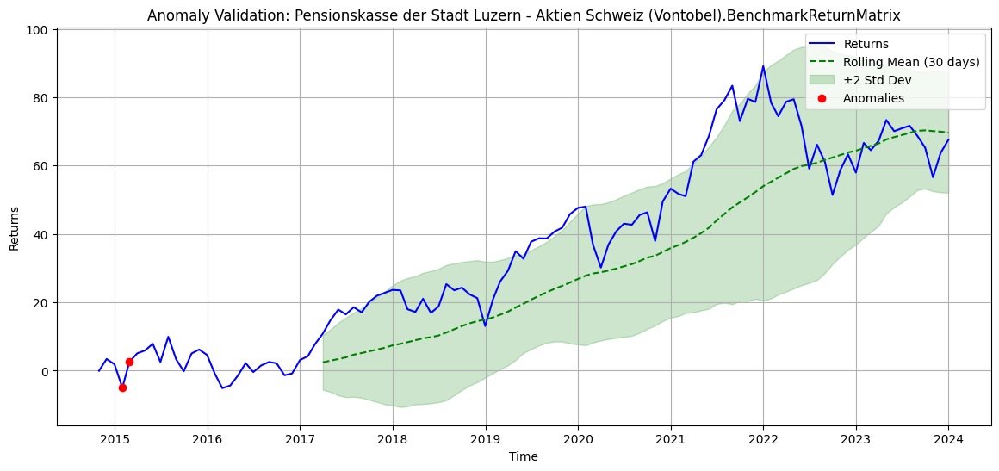

Executing anomaly validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).BenchmarkReturnMatrix


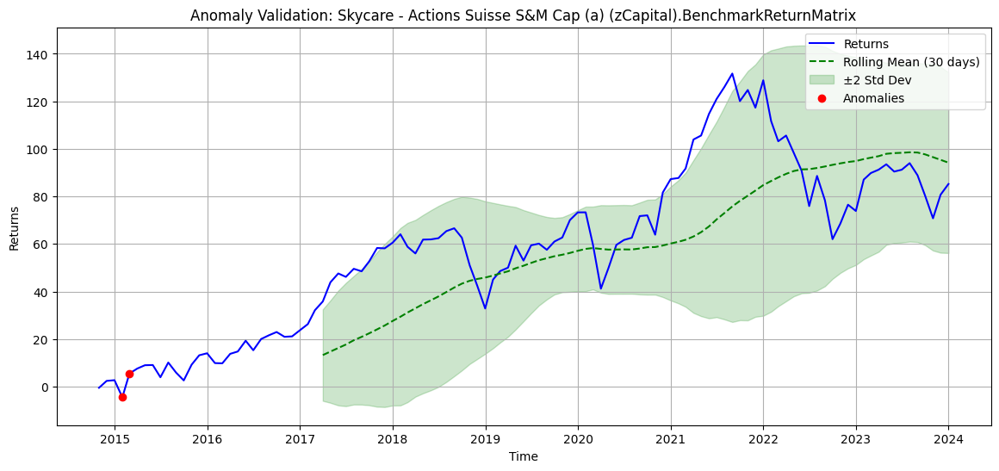

Executing anomaly validation for column: APK - Aktien Schweiz (Intern).BenchmarkReturnMatrix


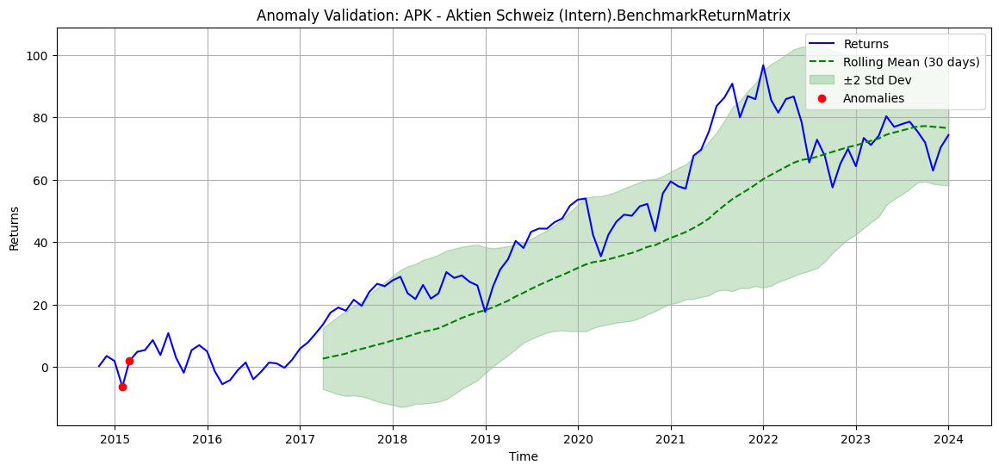

Executing anomaly validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).BenchmarkReturnMatrix


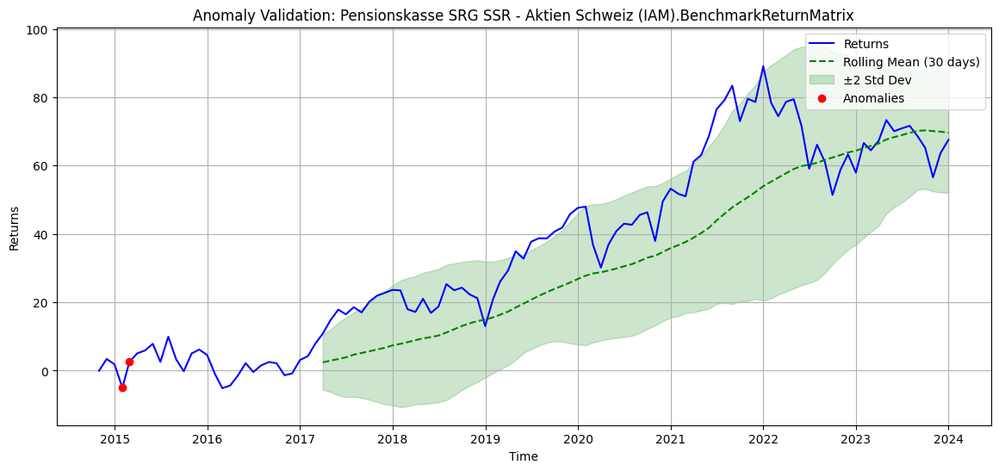

Executing anomaly validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).BenchmarkReturnMatrix


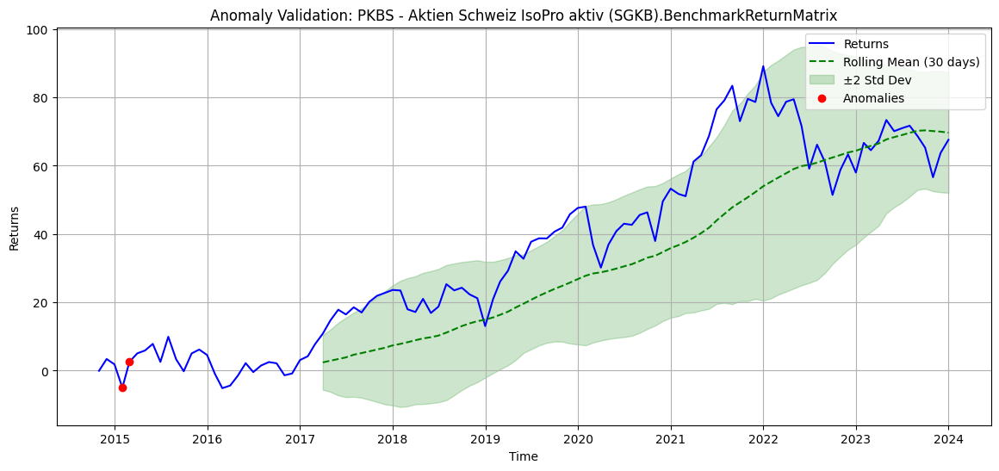

Executing anomaly validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).BenchmarkReturnMatrix


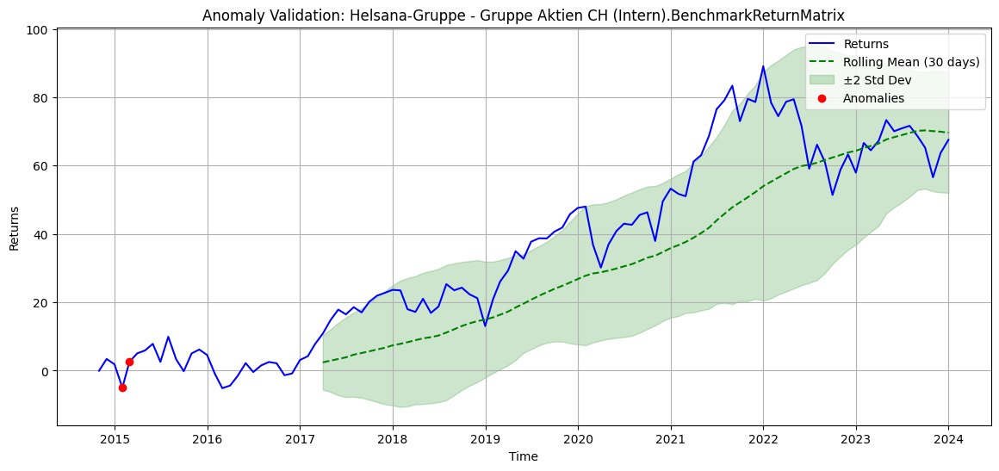

Executing anomaly validation for column: Post - Aktien Schweiz (Finreon).BenchmarkReturnMatrix


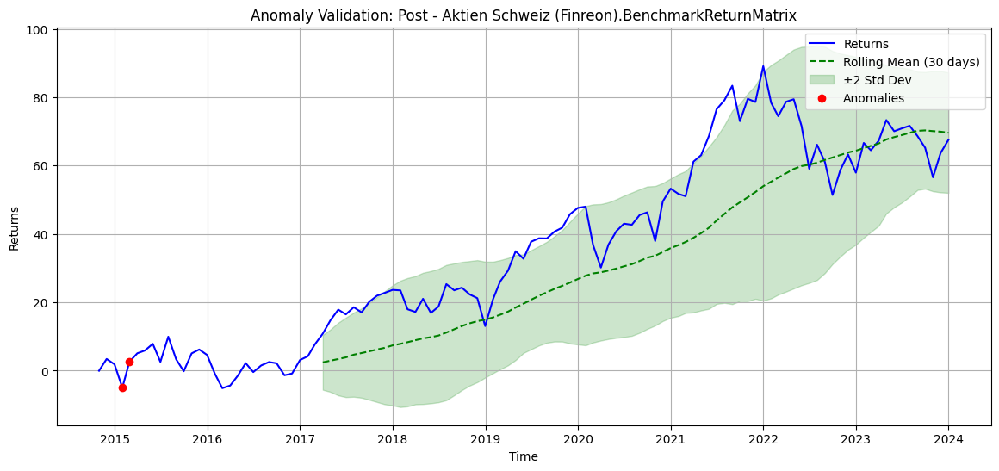

Executing anomaly validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).BenchmarkReturnMatrix


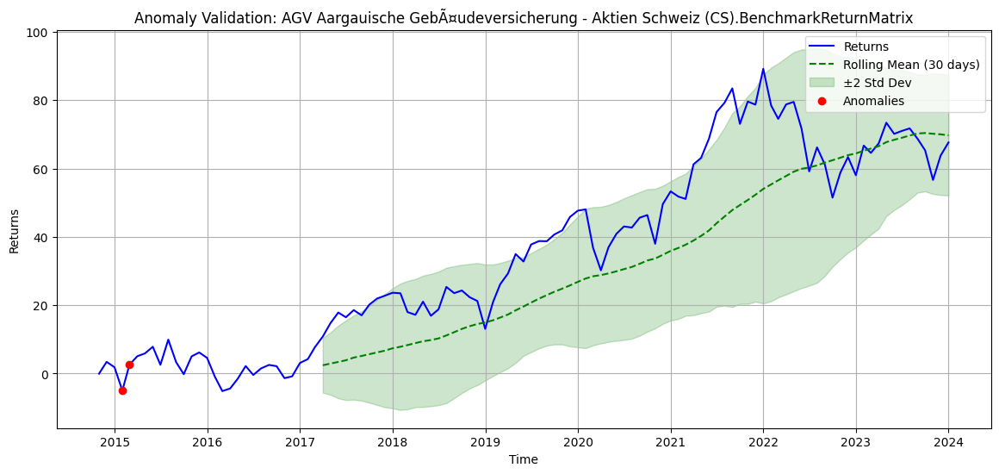

Executing anomaly validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).BenchmarkReturnMatrixMonthly


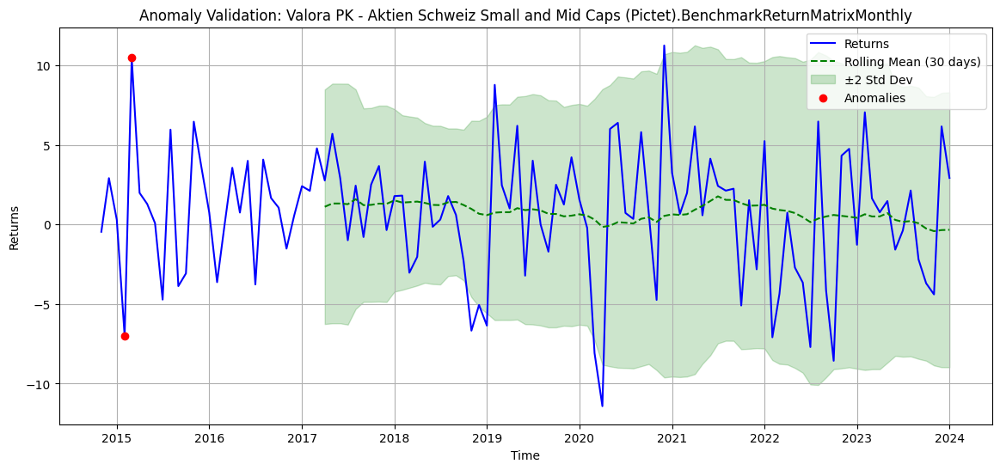

Executing anomaly validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).BenchmarkReturnMatrixMonthly


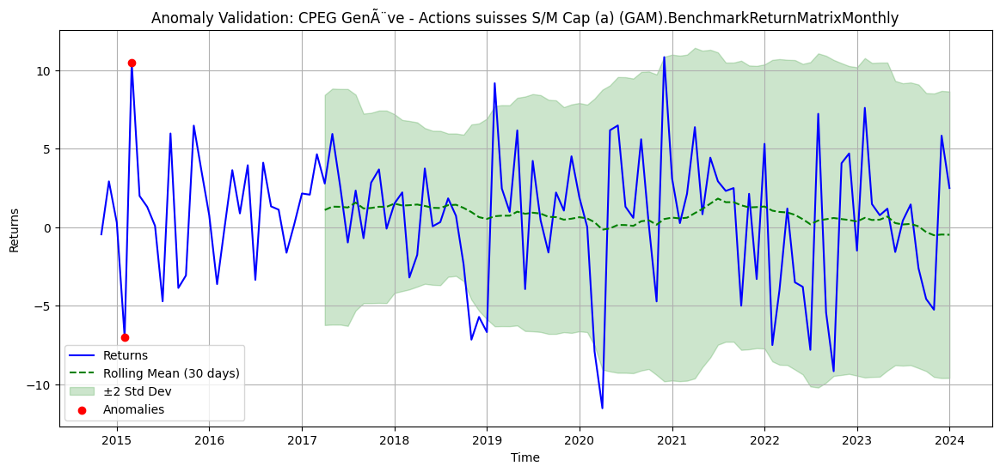

Executing anomaly validation for column: PVST Adval Tech - SaraSelect (VV).BenchmarkReturnMatrixMonthly


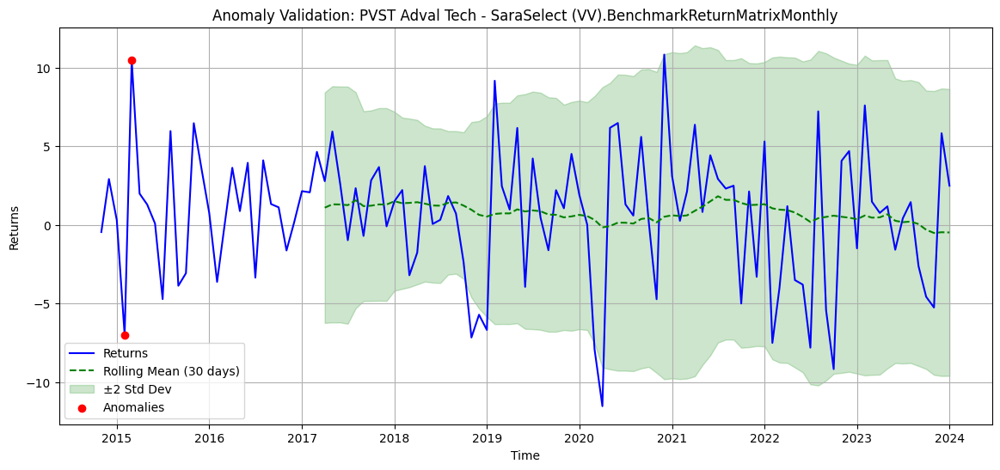

Executing anomaly validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).BenchmarkReturnMatrixMonthly


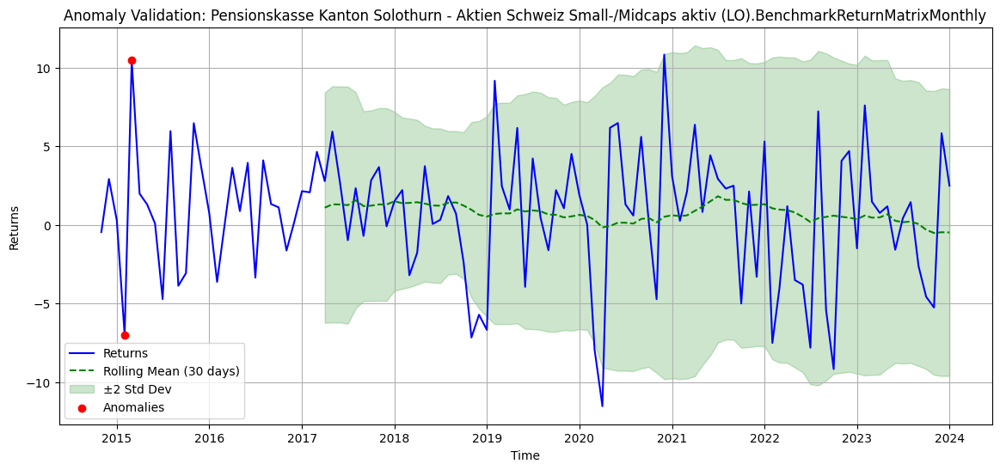

Executing anomaly validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).BenchmarkReturnMatrixMonthly


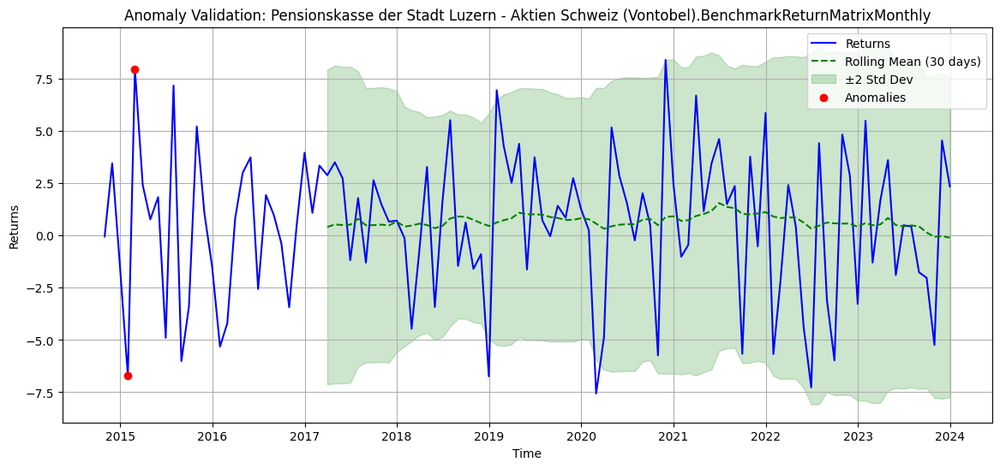

Executing anomaly validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).BenchmarkReturnMatrixMonthly


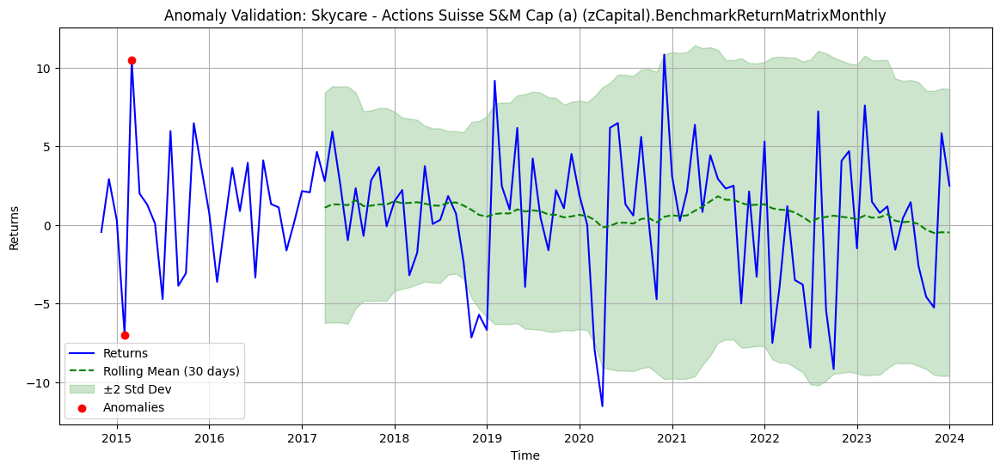

Executing anomaly validation for column: APK - Aktien Schweiz (Intern).BenchmarkReturnMatrixMonthly


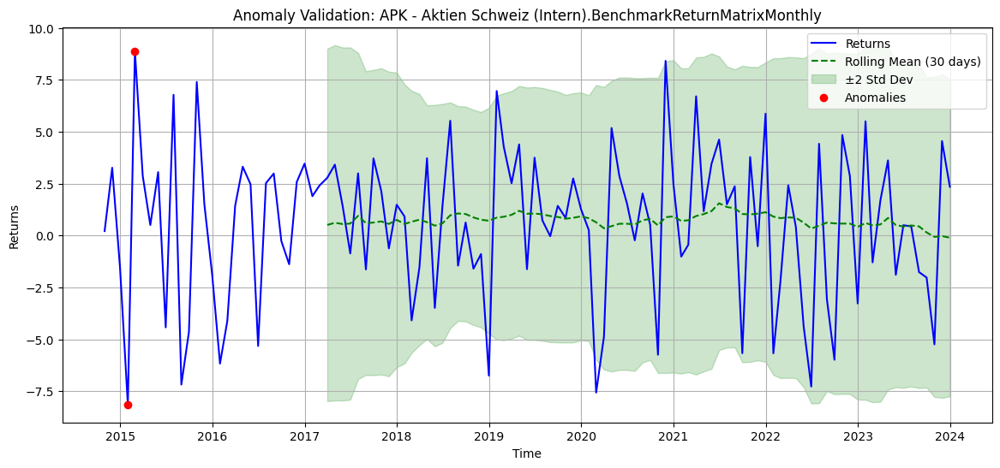

Executing anomaly validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).BenchmarkReturnMatrixMonthly


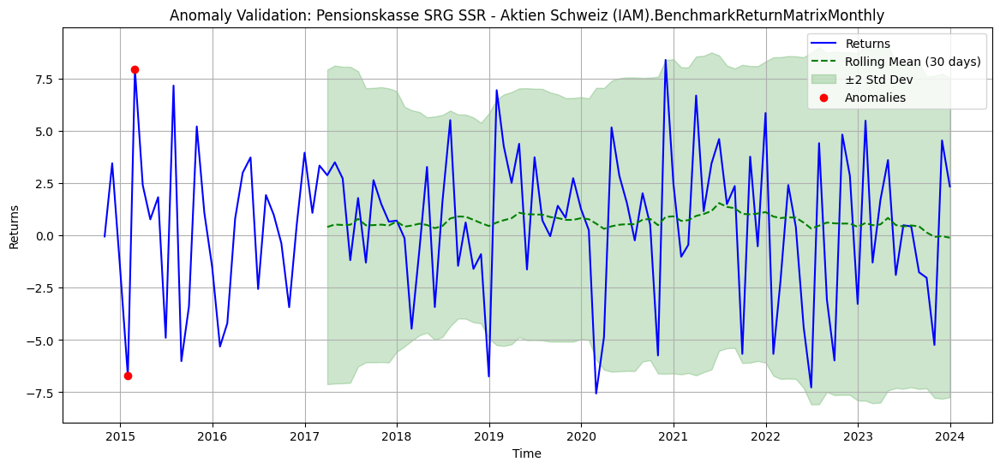

Executing anomaly validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).BenchmarkReturnMatrixMonthly


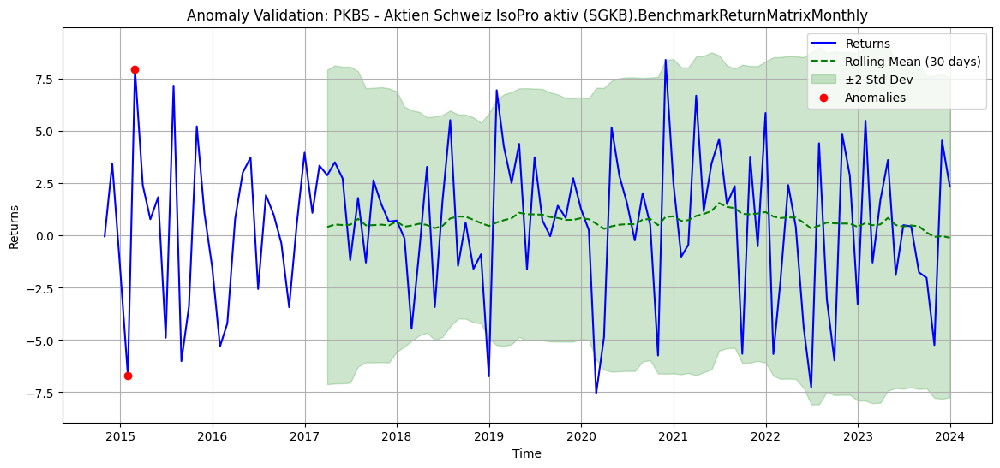

Executing anomaly validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).BenchmarkReturnMatrixMonthly


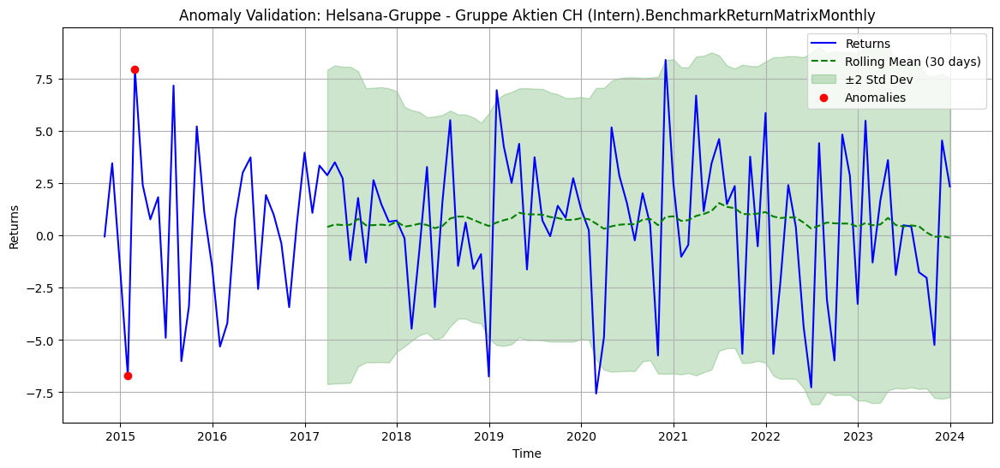

Executing anomaly validation for column: Post - Aktien Schweiz (Finreon).BenchmarkReturnMatrixMonthly


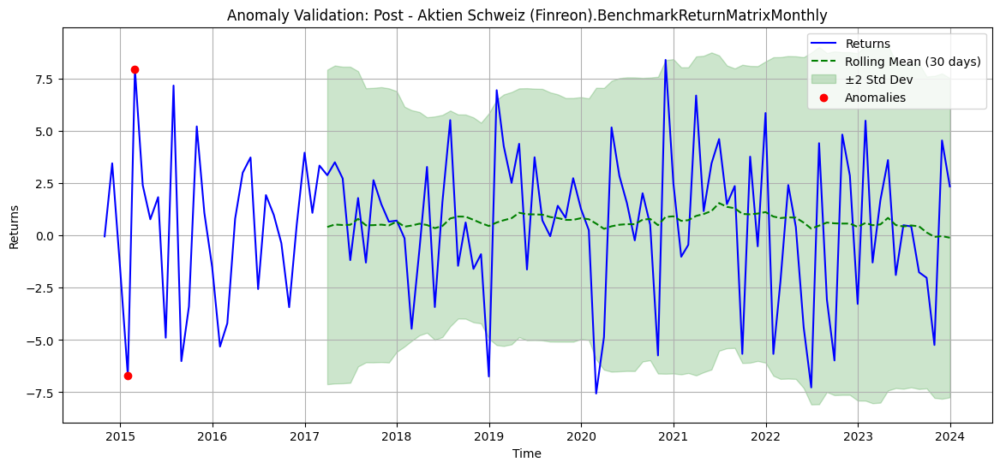

Executing anomaly validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).BenchmarkReturnMatrixMonthly


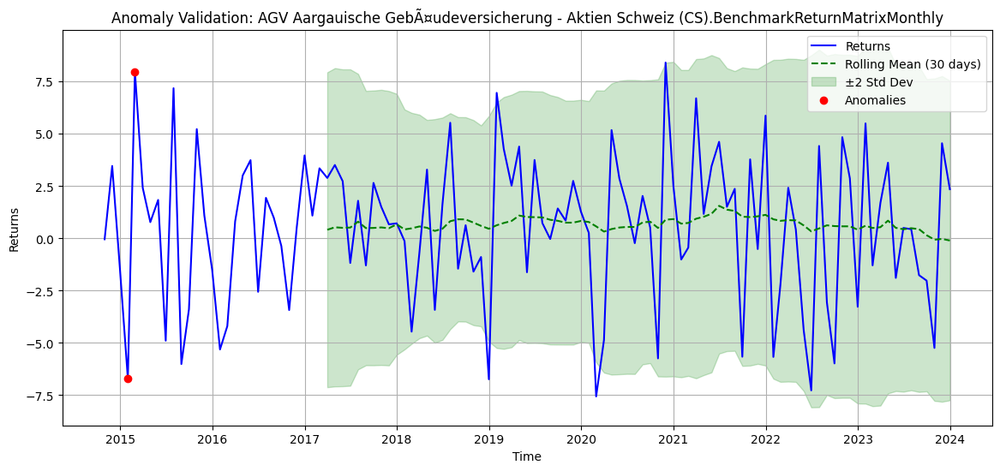

In [20]:
# Iterate over all columns in combined_returns and execute the validation function
for column_name in combined_returns.columns:
    print(f"Executing anomaly validation for column: {column_name}")
    validate_anomalies_visual(combined_returns, anomalies, column_name=column_name, window=30)




Executing validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrix



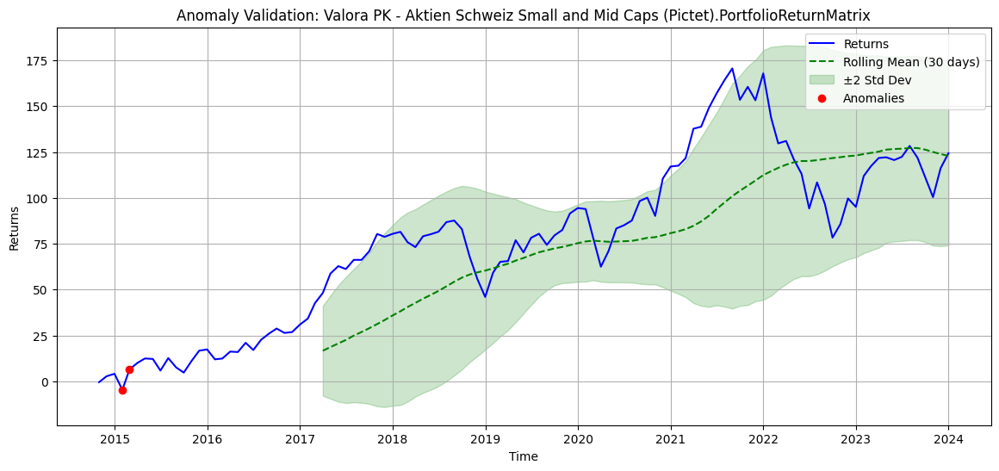

Mean of anomalies: 0.8602185885374047
Mean of normal data: 78.20798837555186
T-test results: t-statistic = -11.088311599134968, p-value = 0.0032647755250563236


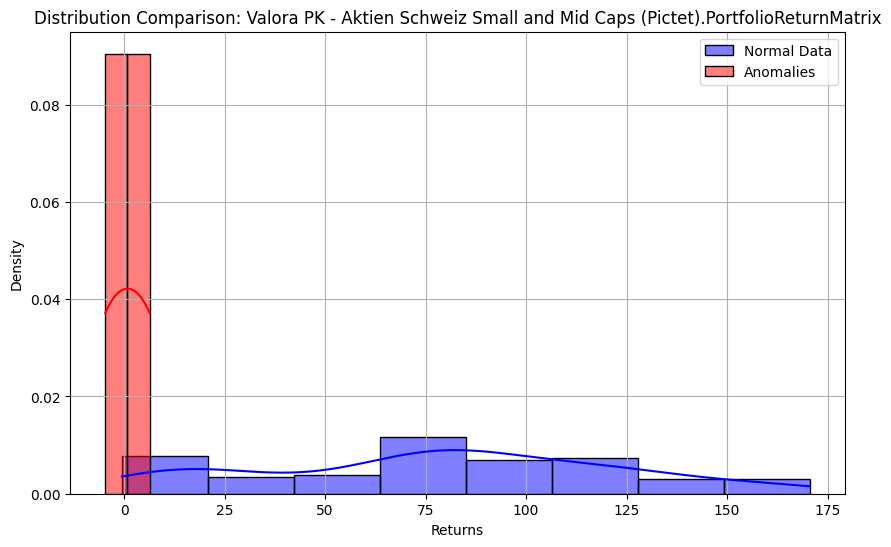


Executing validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).PortfolioReturnMatrix



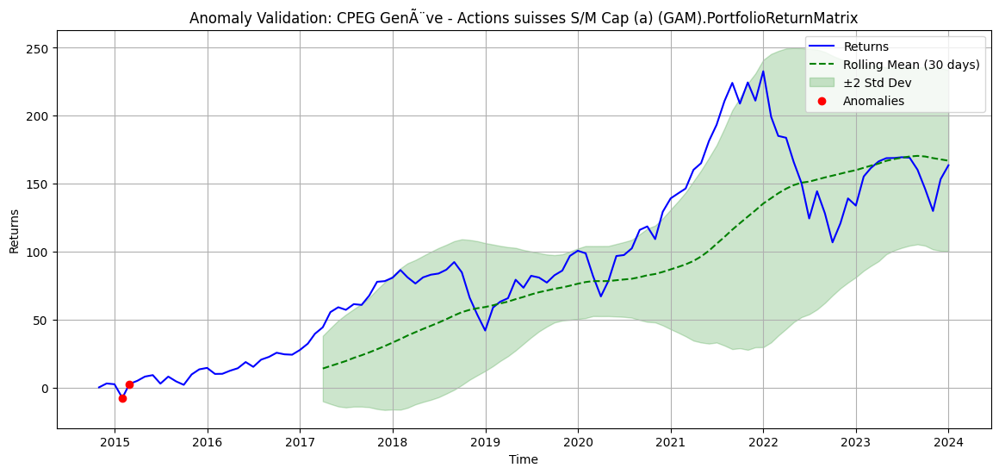

Mean of anomalies: -2.5096402534187154
Mean of normal data: 92.82986709828776
T-test results: t-statistic = -12.058913440352889, p-value = 3.5932018043567584e-05


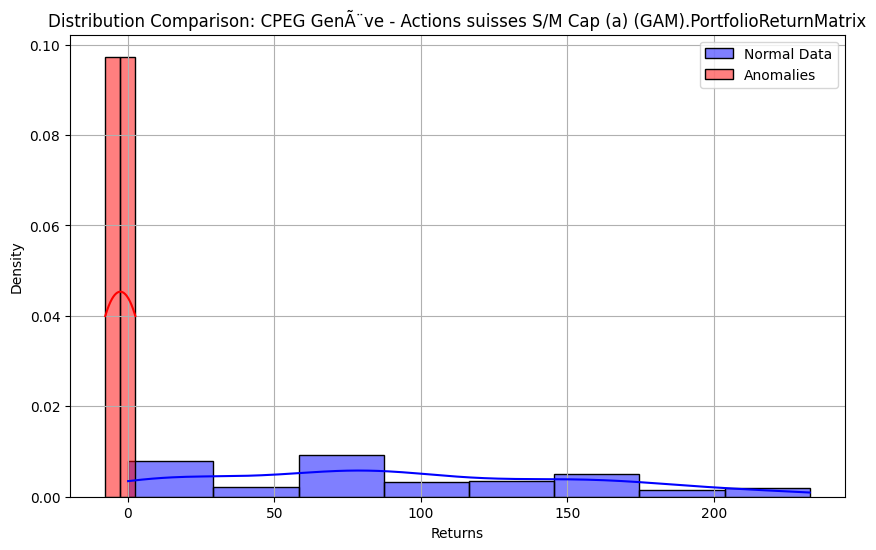


Executing validation for column: PVST Adval Tech - SaraSelect (VV).PortfolioReturnMatrix



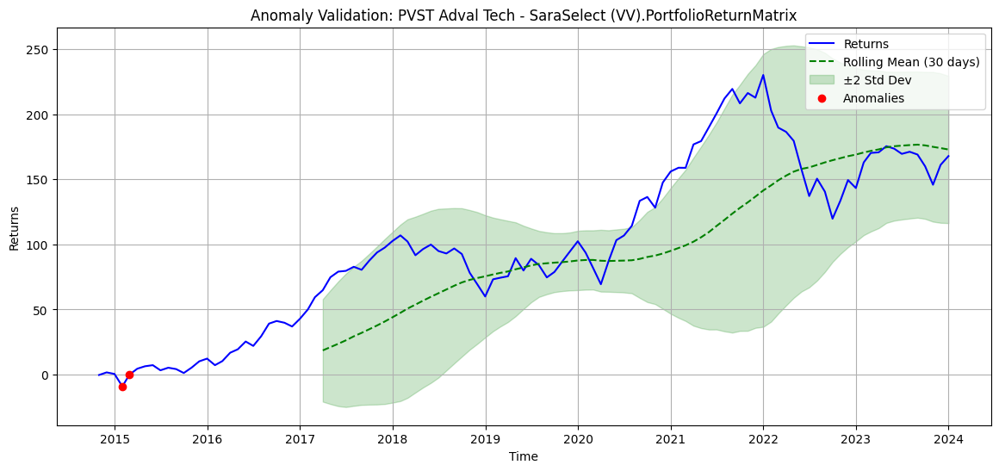

Mean of anomalies: -4.536172660315904
Mean of normal data: 101.24562836650418
T-test results: t-statistic = -14.031049384377468, p-value = 1.2382530539863094e-06


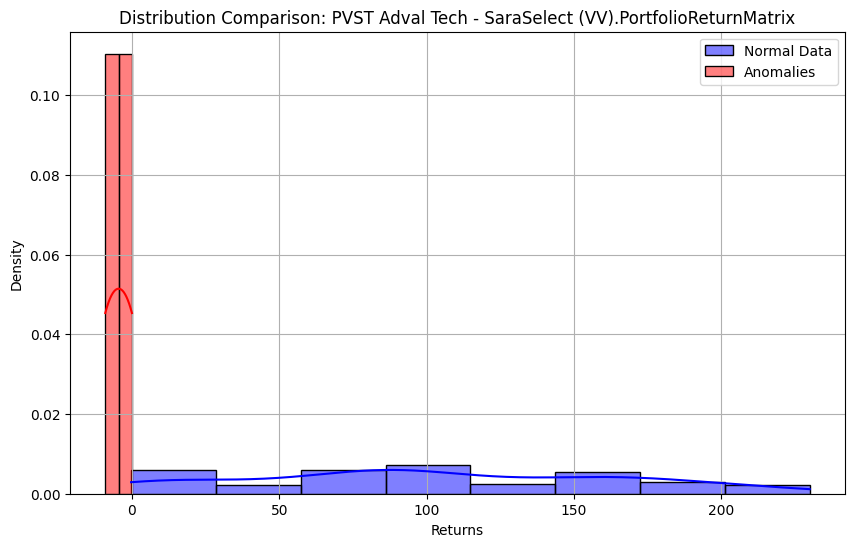


Executing validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).PortfolioReturnMatrix



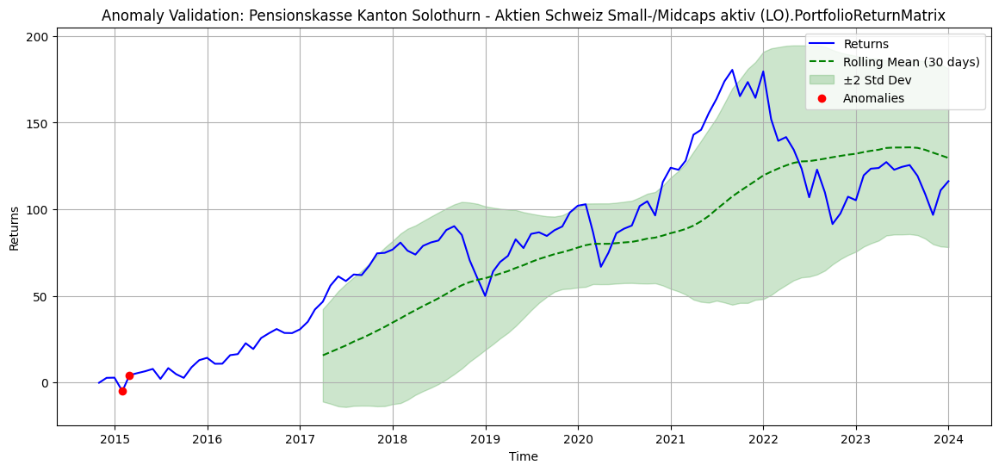

Mean of anomalies: -0.471174449190515
Mean of normal data: 81.35795889435838
T-test results: t-statistic = -12.60542362795117, p-value = 0.0002709508434101516


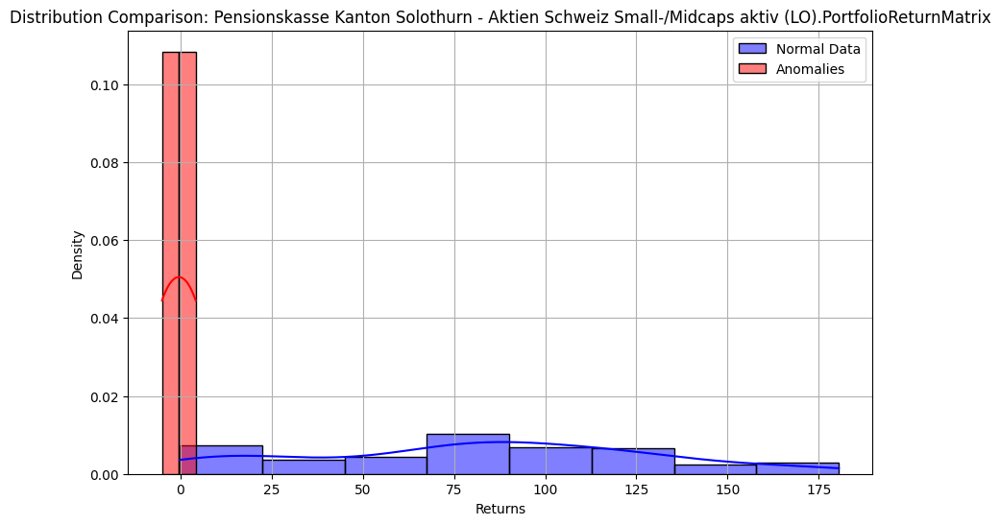


Executing validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).PortfolioReturnMatrix



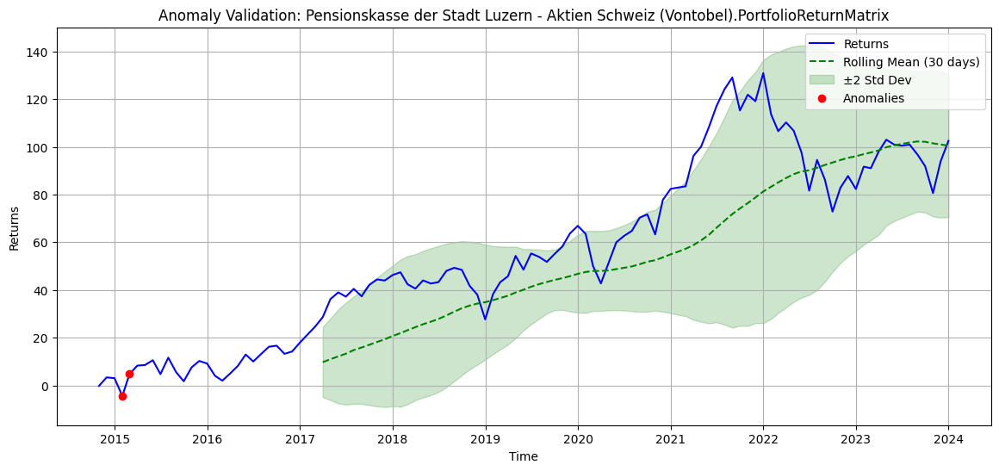

Mean of anomalies: 0.160692264503155
Mean of normal data: 56.62373140648758
T-test results: t-statistic = -9.782964199675739, p-value = 0.004702599276519676


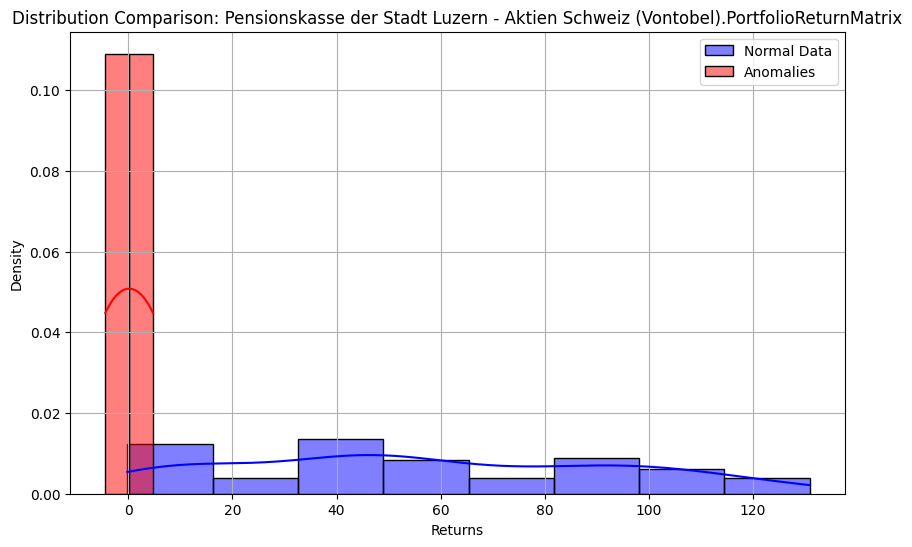


Executing validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).PortfolioReturnMatrix



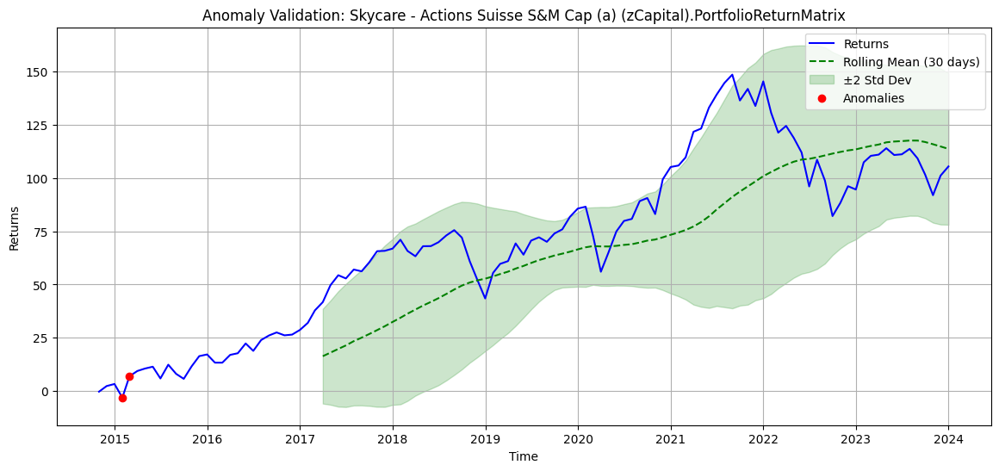

Mean of anomalies: 1.9656175407724752
Mean of normal data: 71.22670116614341
T-test results: t-statistic = -11.000170438089771, p-value = 0.0036147005254383055


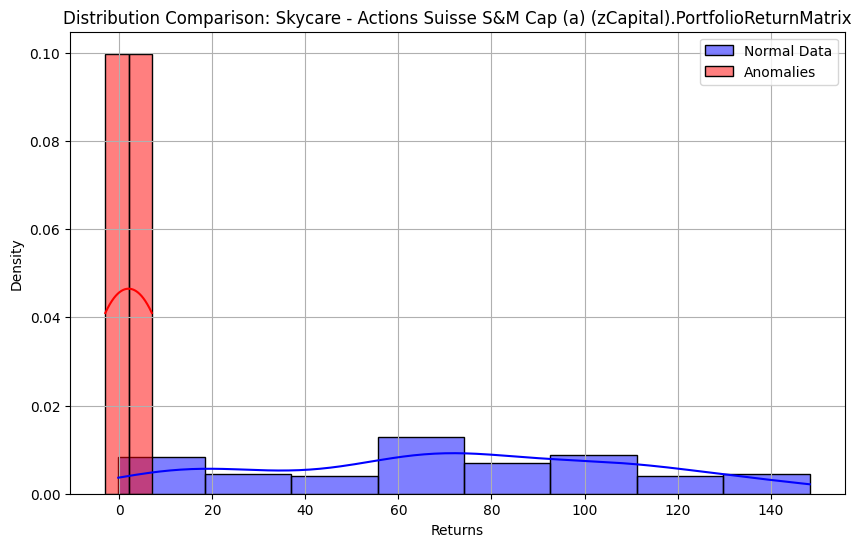


Executing validation for column: APK - Aktien Schweiz (Intern).PortfolioReturnMatrix



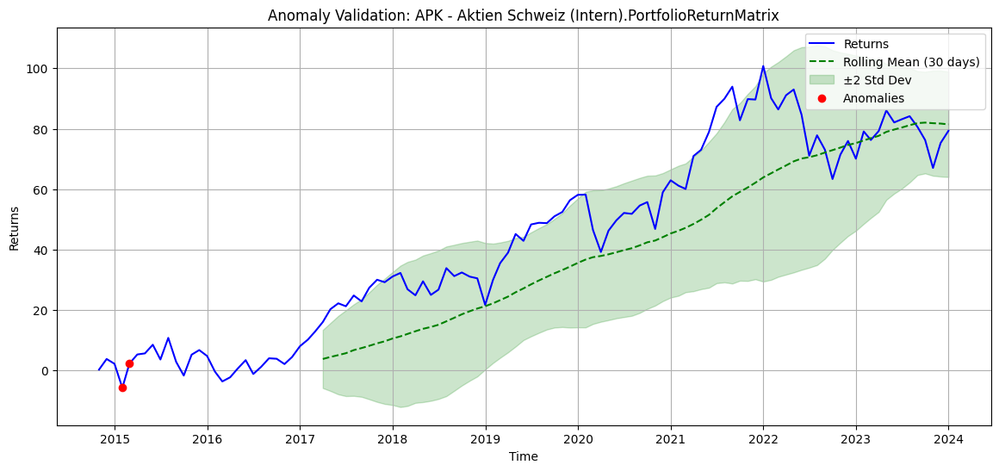

Mean of anomalies: -1.6833963755721548
Mean of normal data: 43.56687111142648
T-test results: t-statistic = -9.076950795702993, p-value = 0.0068564582756332594


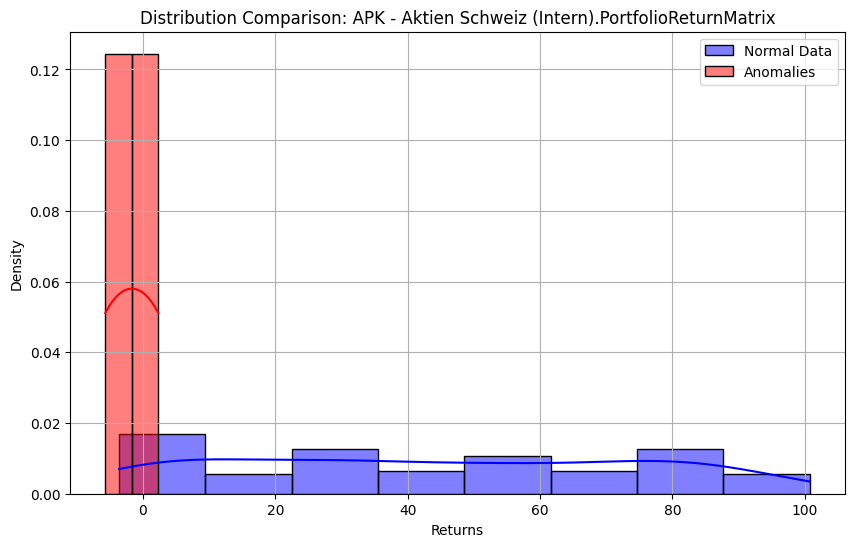


Executing validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).PortfolioReturnMatrix



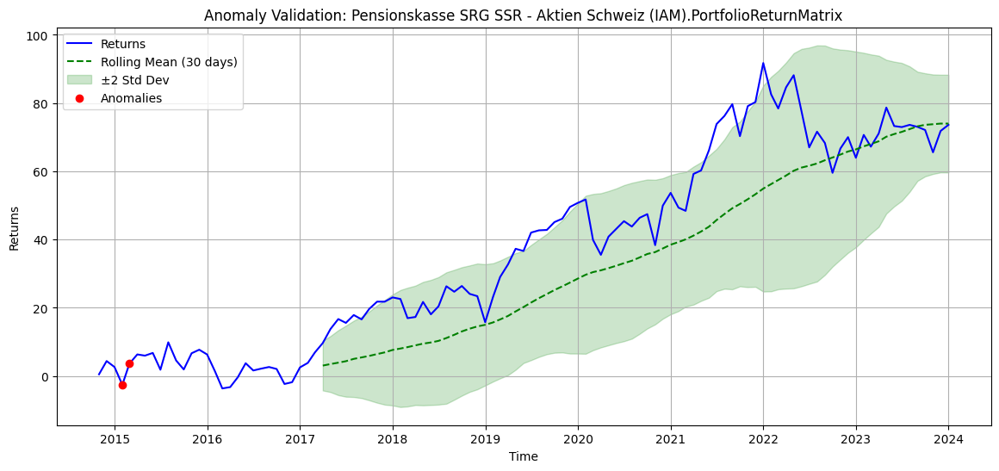

Mean of anomalies: 0.5396975770705001
Mean of normal data: 37.67162169425304
T-test results: t-statistic = -9.006758386348098, p-value = 0.002604205329629831


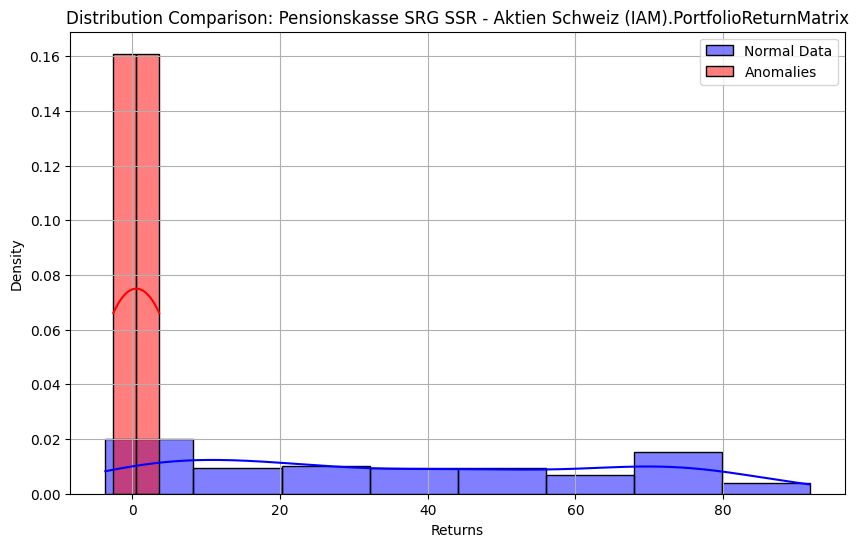


Executing validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).PortfolioReturnMatrix



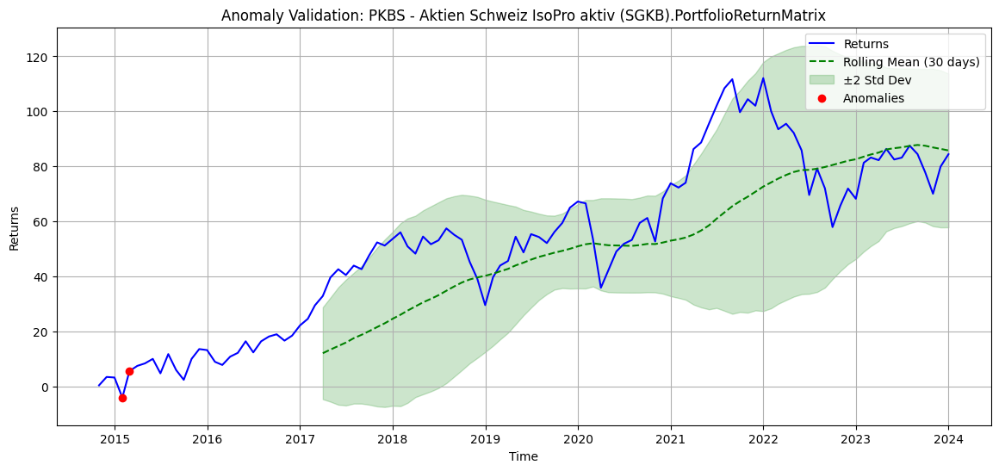

Mean of anomalies: 0.6855520699733249
Mean of normal data: 52.91348544341436
T-test results: t-statistic = -9.314921546186705, p-value = 0.015201846336497337


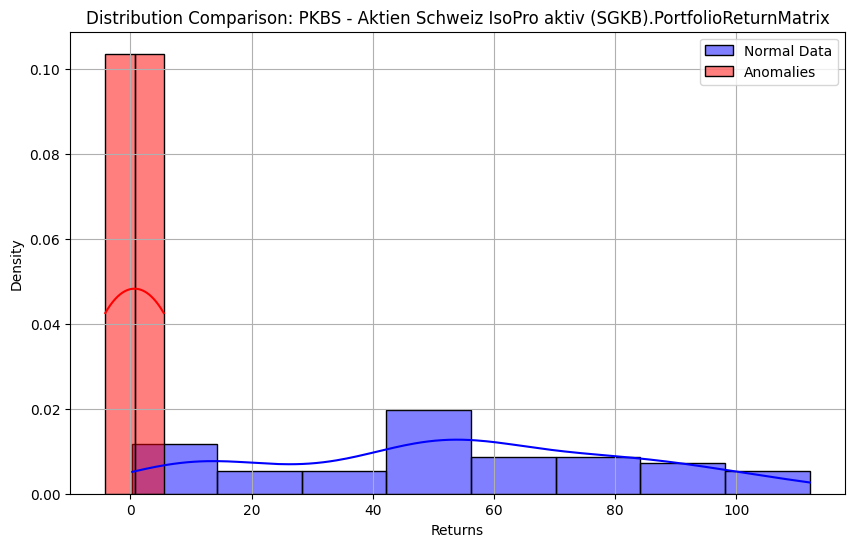


Executing validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).PortfolioReturnMatrix



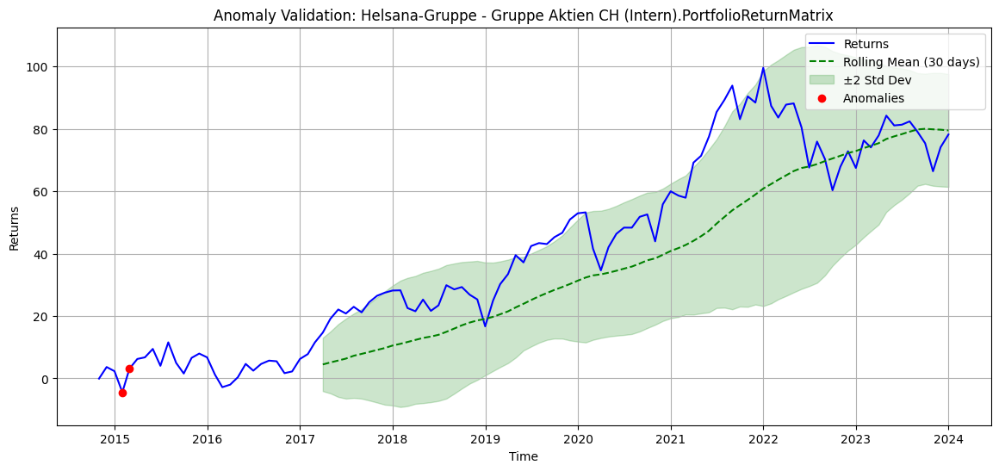

Mean of anomalies: -0.6558166395625298
Mean of normal data: 41.48416240376011
T-test results: t-statistic = -8.861872634425994, p-value = 0.006132626257827586


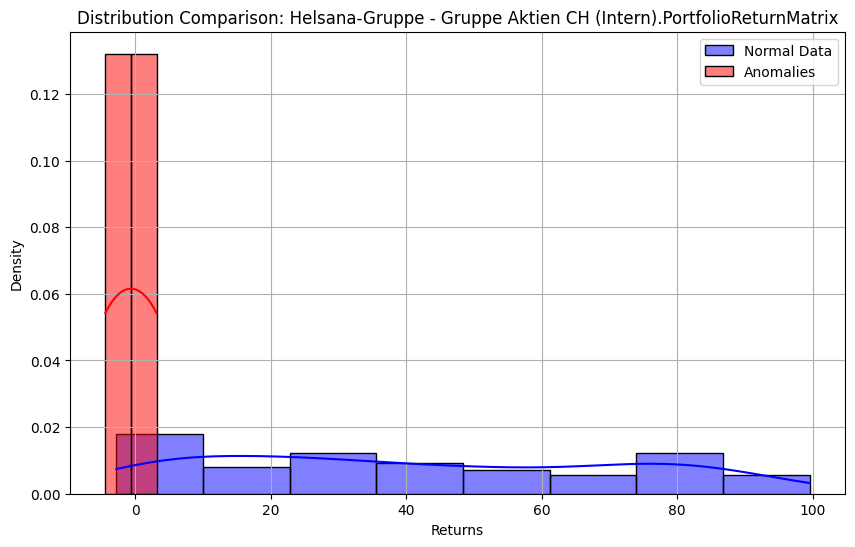


Executing validation for column: Post - Aktien Schweiz (Finreon).PortfolioReturnMatrix



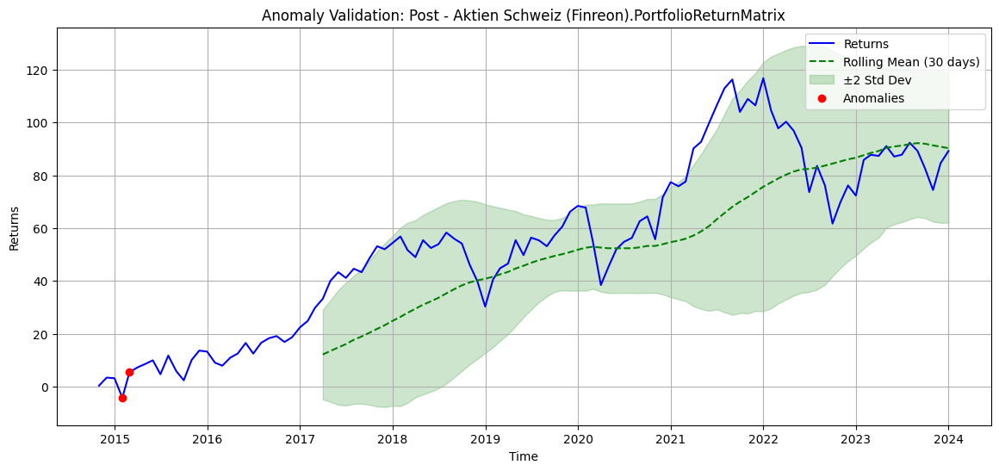

Mean of anomalies: 0.6348831887291748
Mean of normal data: 55.01931993697869
T-test results: t-statistic = -9.553587051518024, p-value = 0.012251098665887387


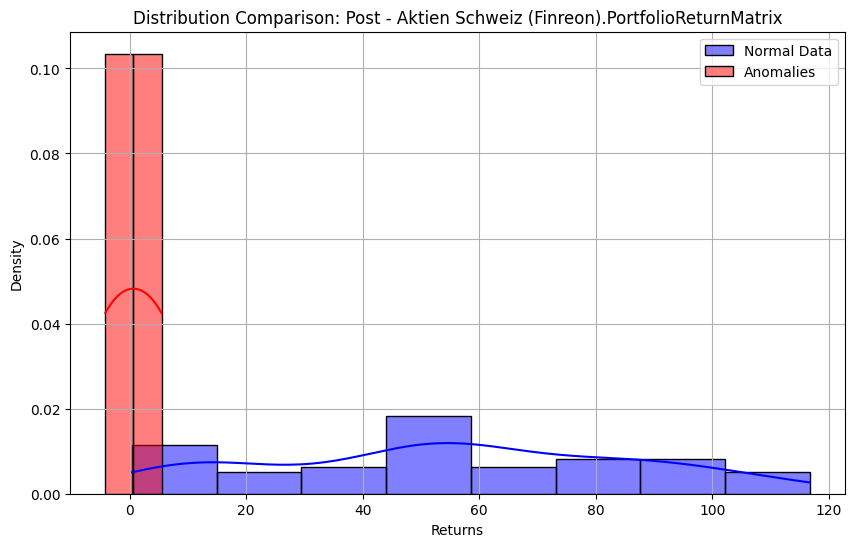


Executing validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).PortfolioReturnMatrix



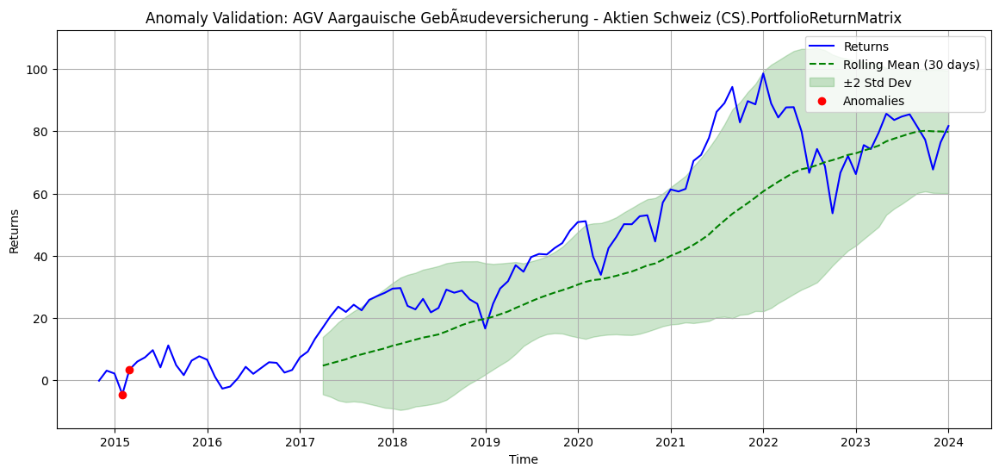

Mean of anomalies: -0.5161577952437051
Mean of normal data: 41.60090358352428
T-test results: t-statistic = -8.580835337807738, p-value = 0.008154570130883722


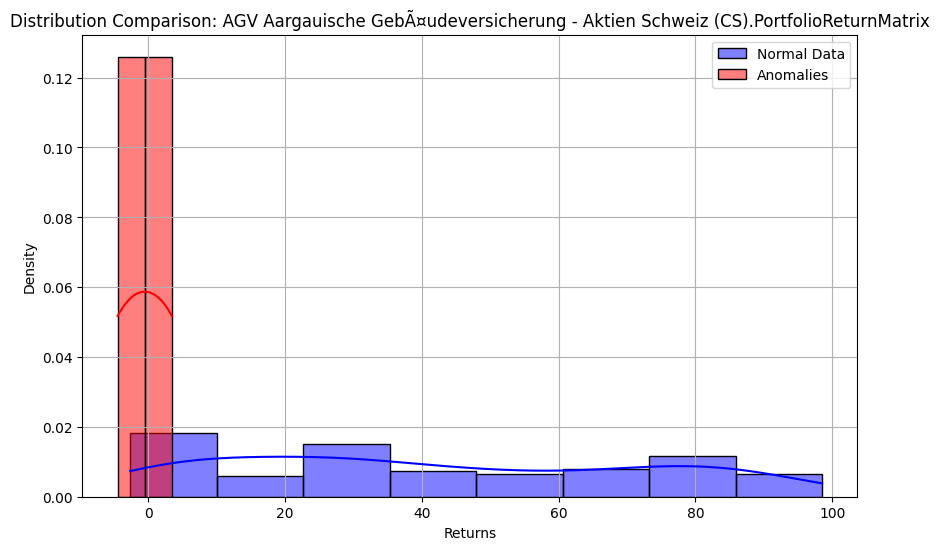


Executing validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).PortfolioReturnMatrixMonthly



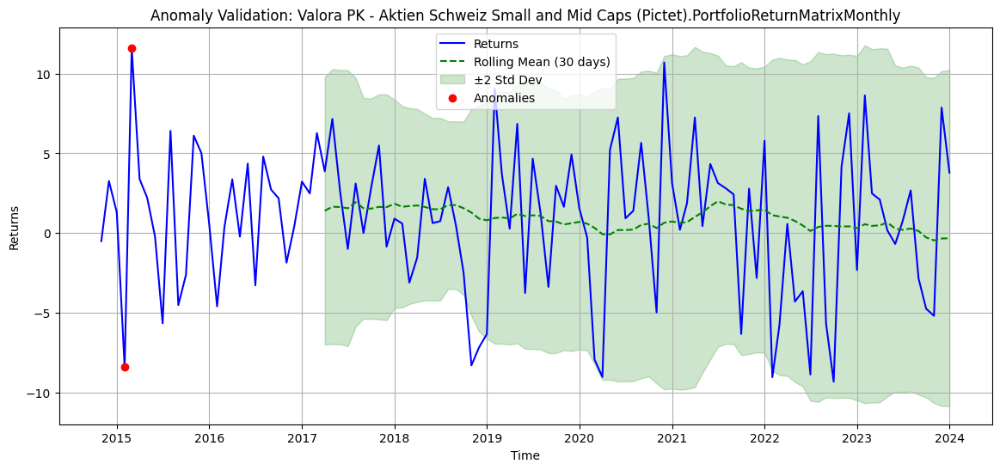

Mean of anomalies: 1.5899999999999999
Mean of normal data: 0.8220642201834862
T-test results: t-statistic = 0.07672424717647935, p-value = 0.9512171724971543


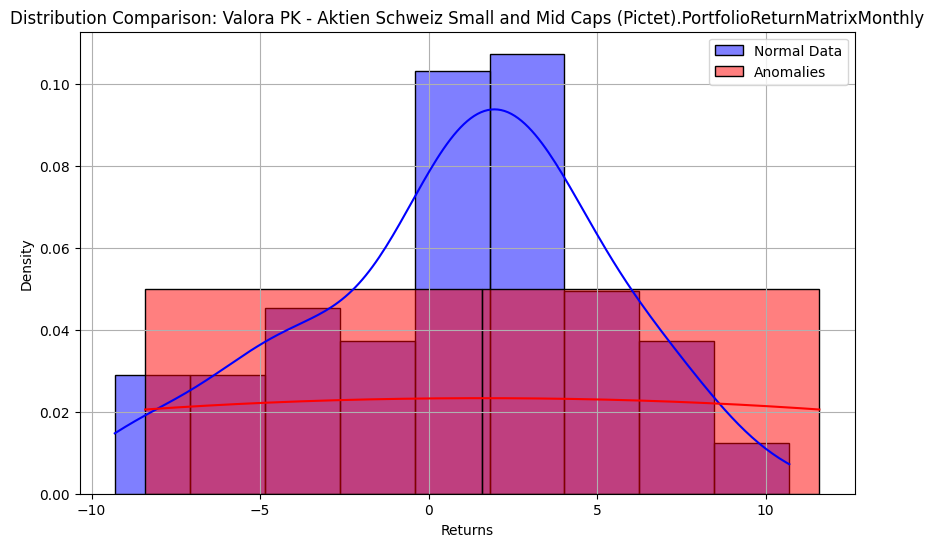


Executing validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).PortfolioReturnMatrixMonthly



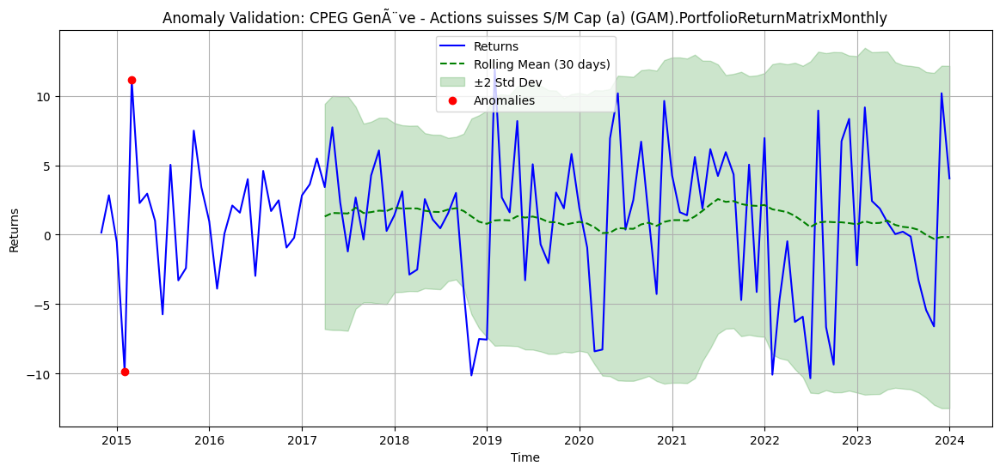

Mean of anomalies: 0.6430034999999998
Mean of normal data: 1.010003137614679
T-test results: t-statistic = -0.03497453806900032, p-value = 0.9777264451188232


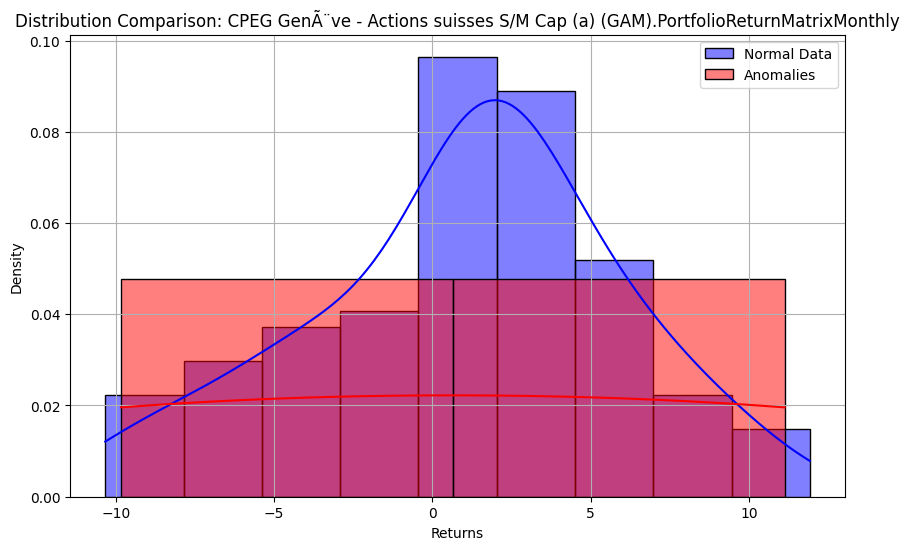


Executing validation for column: PVST Adval Tech - SaraSelect (VV).PortfolioReturnMatrixMonthly



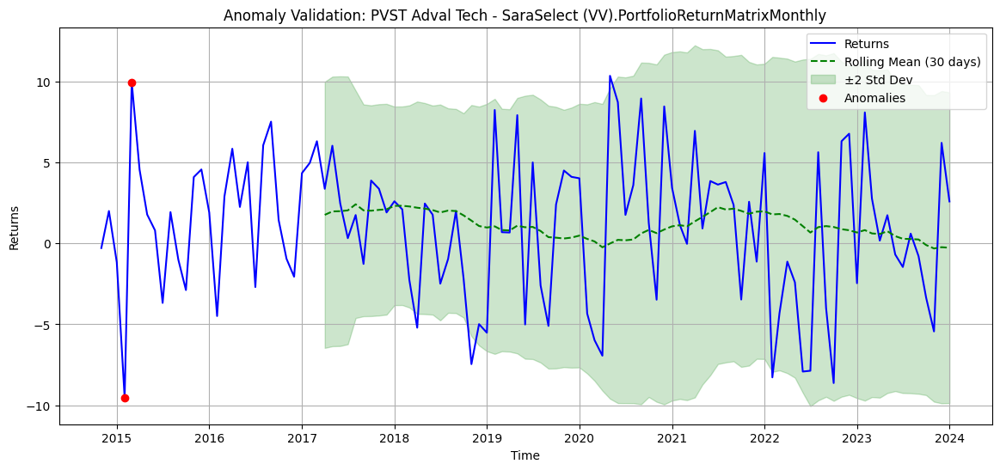

Mean of anomalies: 0.21500000000000075
Mean of normal data: 1.0060550458715596
T-test results: t-statistic = -0.08110149753580917, p-value = 0.9484454743053817


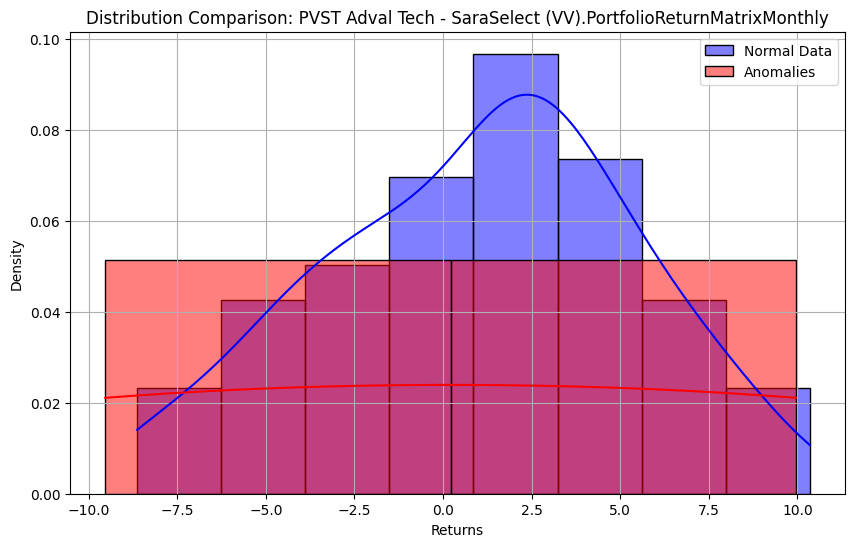


Executing validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).PortfolioReturnMatrixMonthly



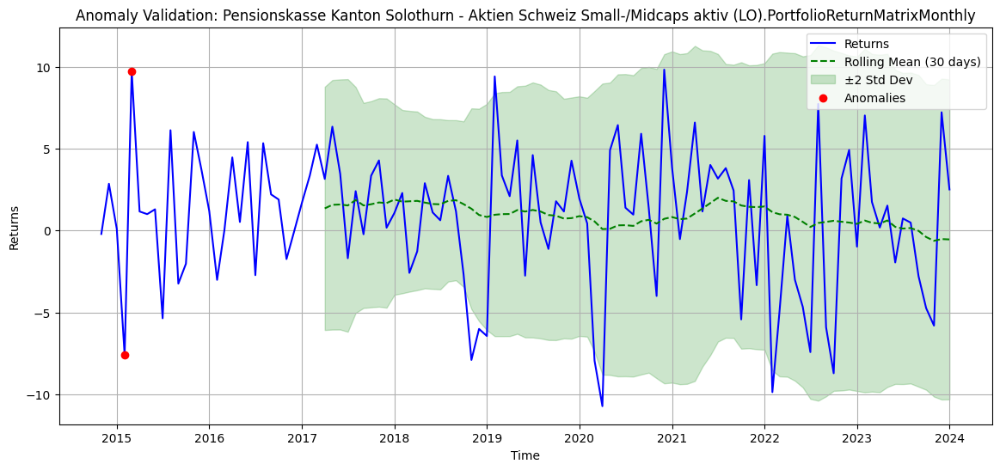

Mean of anomalies: 1.0574499999999998
Mean of normal data: 0.7845788990825687
T-test results: t-statistic = 0.03145709512445142, p-value = 0.9799639122254982


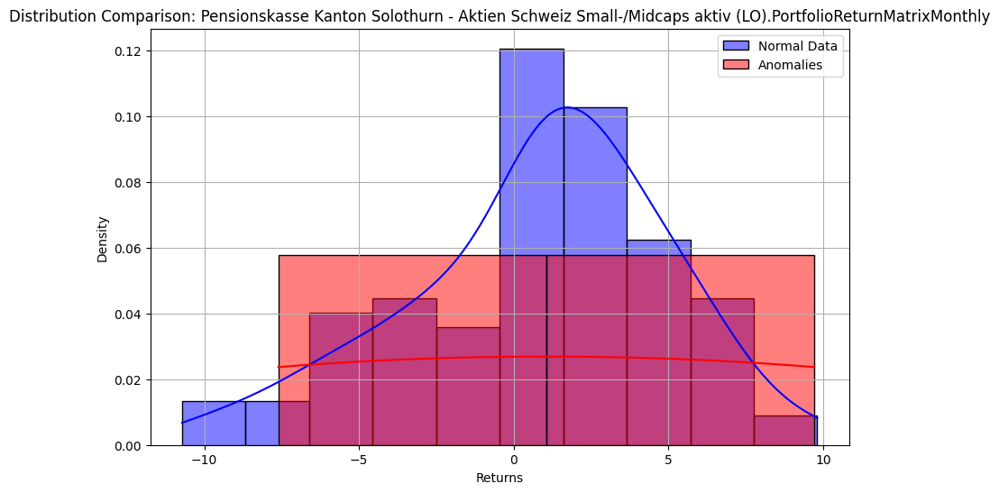


Executing validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).PortfolioReturnMatrixMonthly



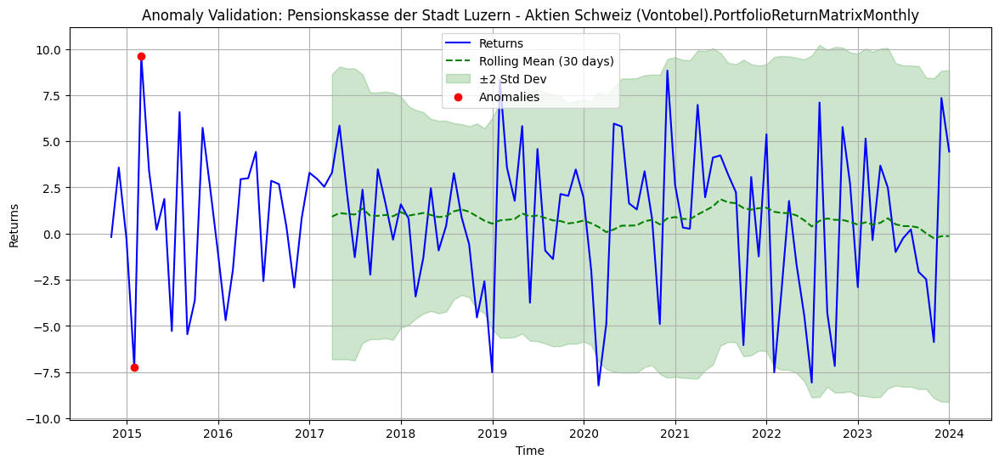

Mean of anomalies: 1.1714541599999997
Mean of normal data: 0.707368065321101
T-test results: t-statistic = 0.055011111913447396, p-value = 0.9649884448618218


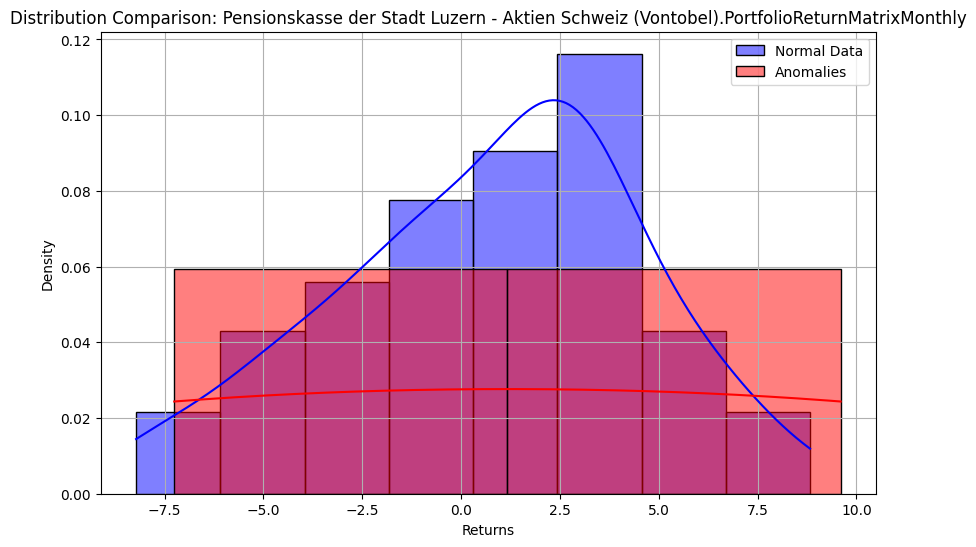


Executing validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).PortfolioReturnMatrixMonthly



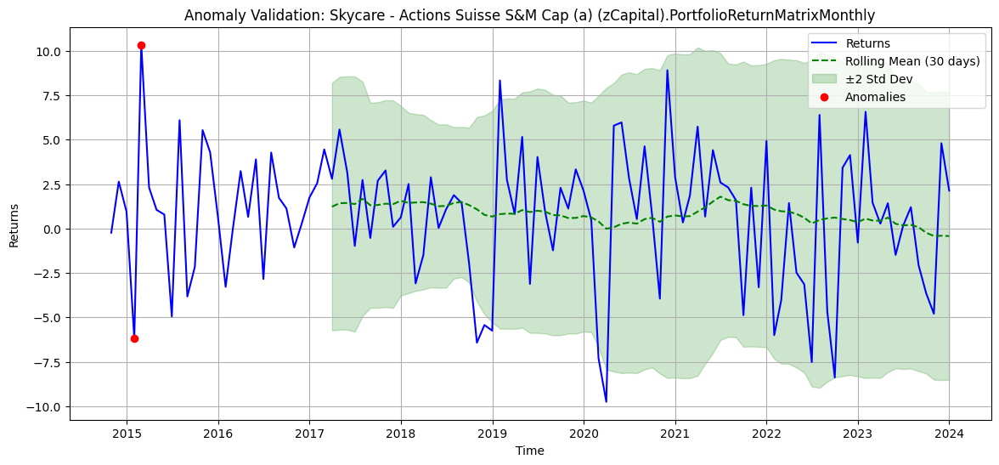

Mean of anomalies: 2.0674986152692
Mean of normal data: 0.6981328764146079
T-test results: t-statistic = 0.1653952327231484, p-value = 0.8955763257226613


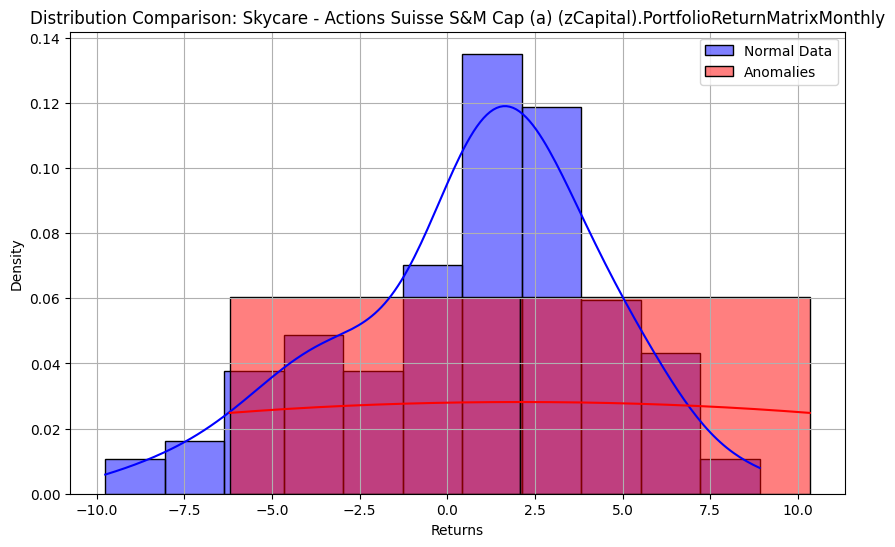


Executing validation for column: APK - Aktien Schweiz (Intern).PortfolioReturnMatrixMonthly



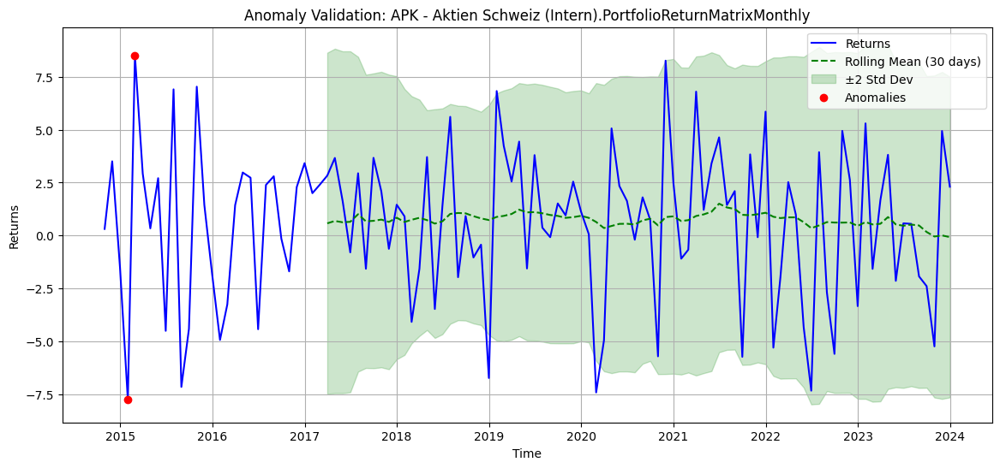

Mean of anomalies: 0.3753500000000005
Mean of normal data: 0.597732110091743
T-test results: t-statistic = -0.027277491546561856, p-value = 0.9826274995043971


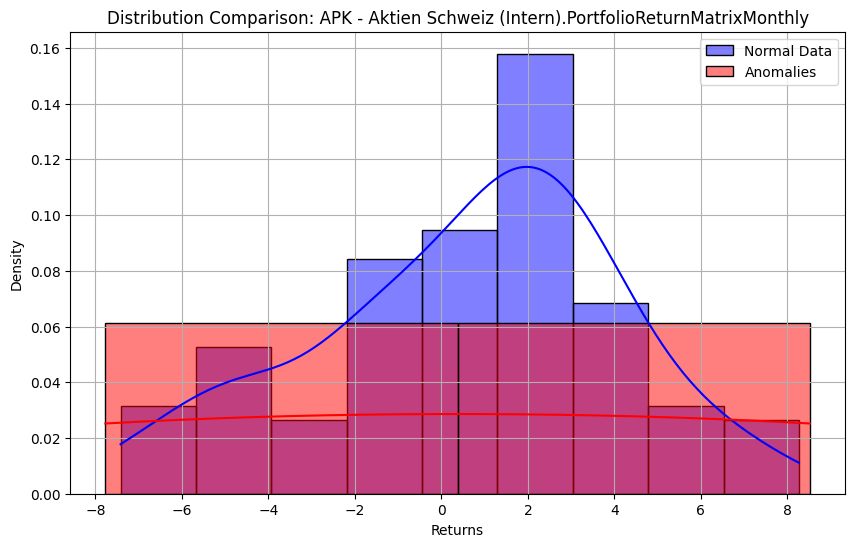


Executing validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).PortfolioReturnMatrixMonthly



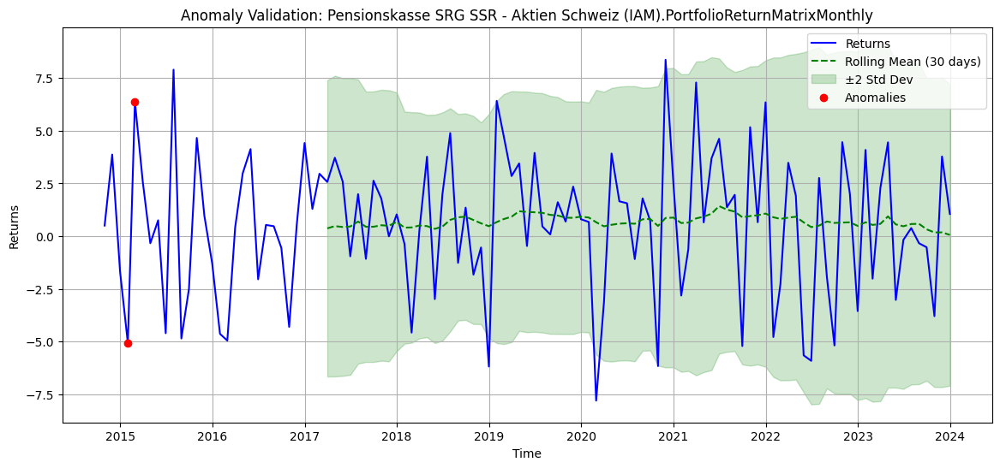

Mean of anomalies: 0.6499999999999999
Mean of normal data: 0.5539449541284402
T-test results: t-statistic = 0.016737427856089417, p-value = 0.9893328048390202


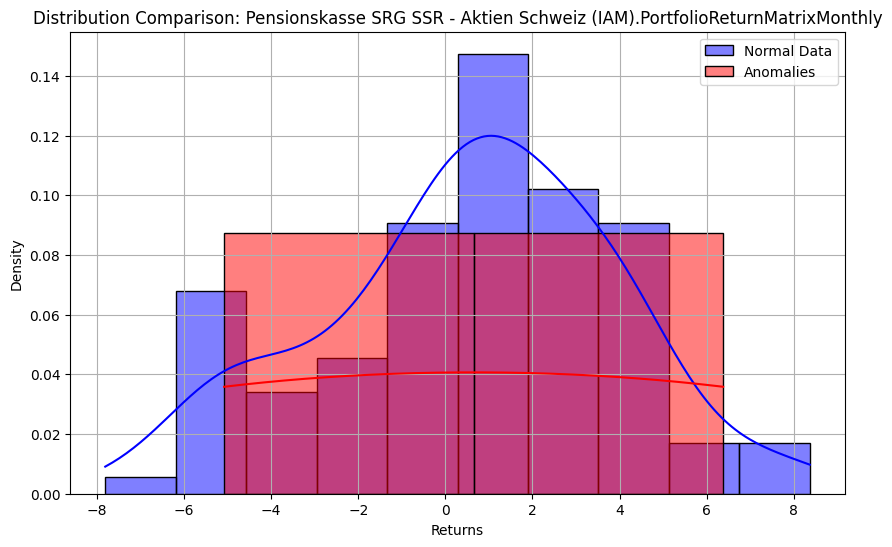


Executing validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).PortfolioReturnMatrixMonthly



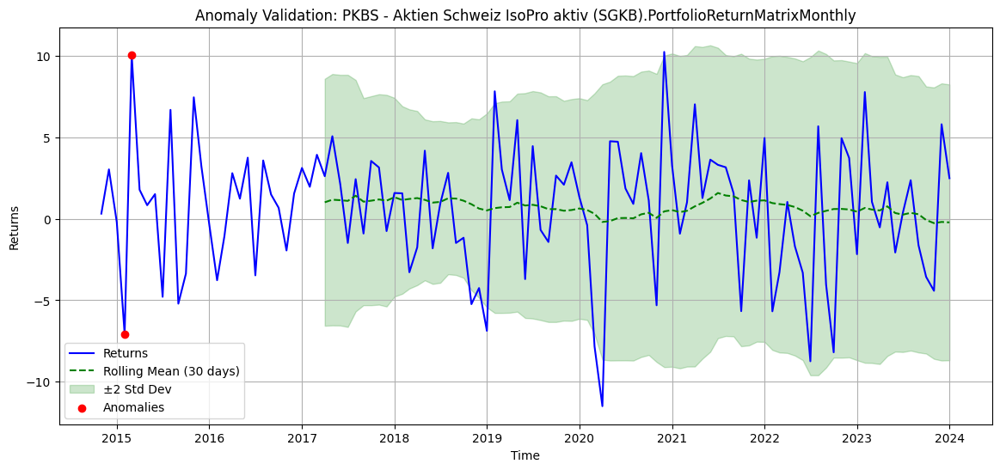

Mean of anomalies: 1.495
Mean of normal data: 0.6179633027522936
T-test results: t-statistic = 0.10218167572027649, p-value = 0.9351263867739747


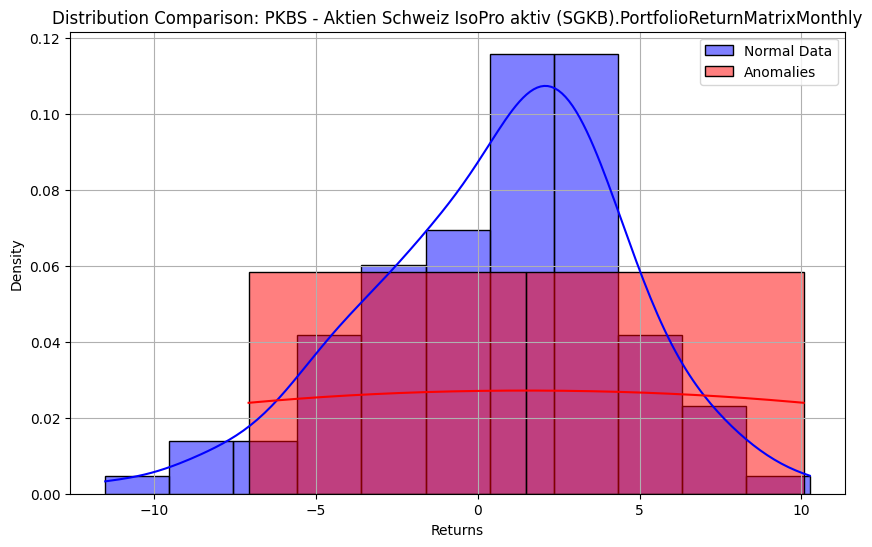


Executing validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).PortfolioReturnMatrixMonthly



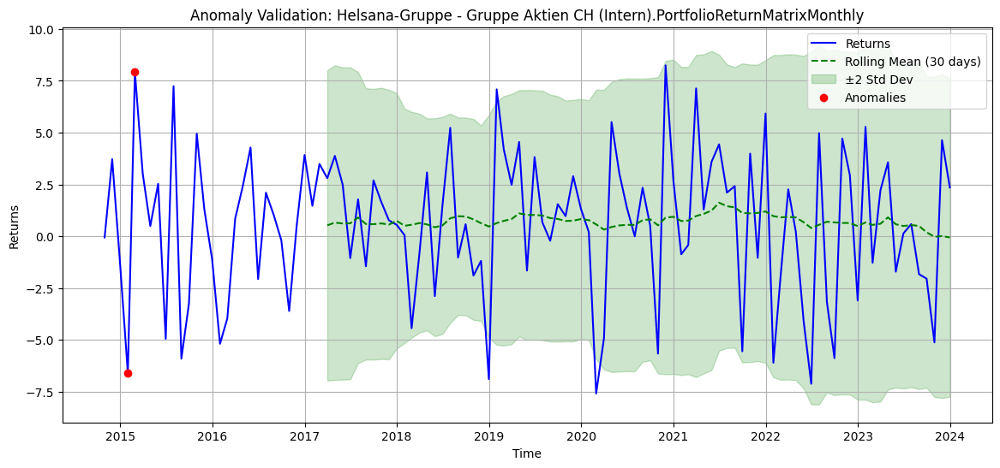

Mean of anomalies: 0.657
Mean of normal data: 0.5845065014908534
T-test results: t-statistic = 0.009965224723441003, p-value = 0.9936510004772701


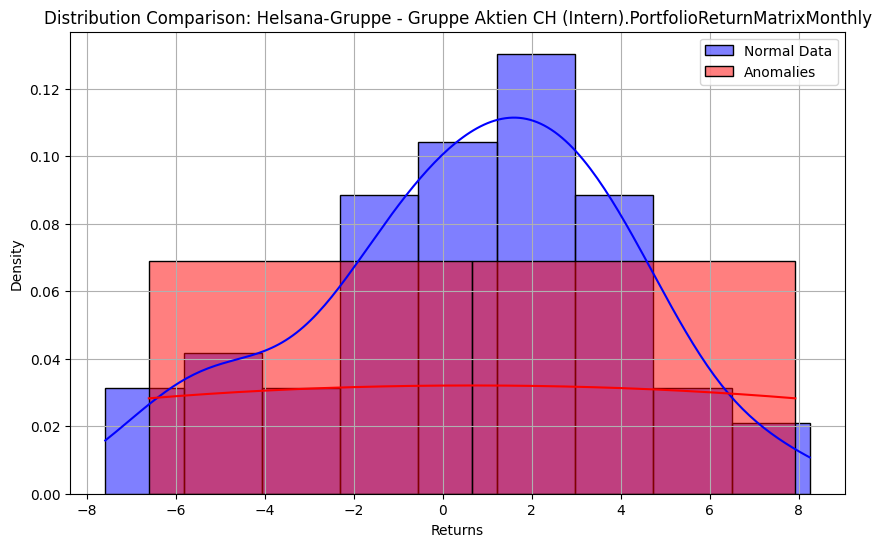


Executing validation for column: Post - Aktien Schweiz (Finreon).PortfolioReturnMatrixMonthly



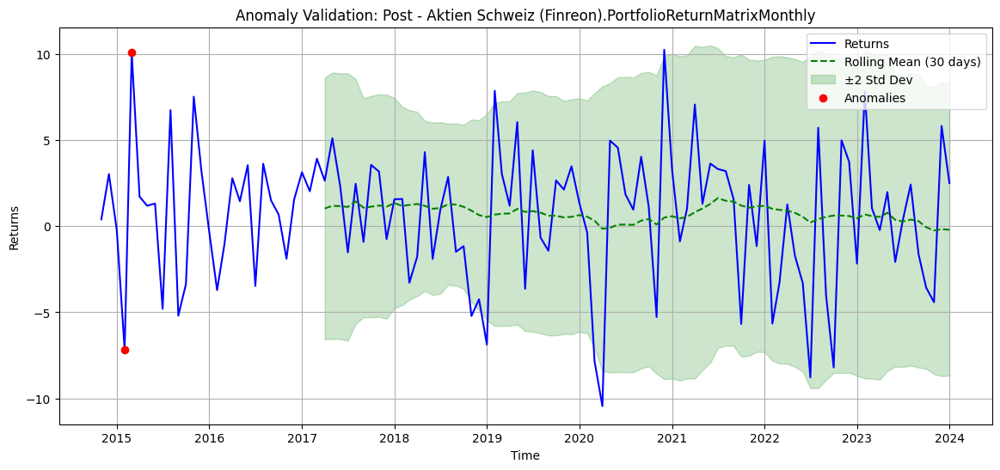

Mean of anomalies: 1.4558
Mean of normal data: 0.6414192660550457
T-test results: t-statistic = 0.09423254900343733, p-value = 0.9401435381700358


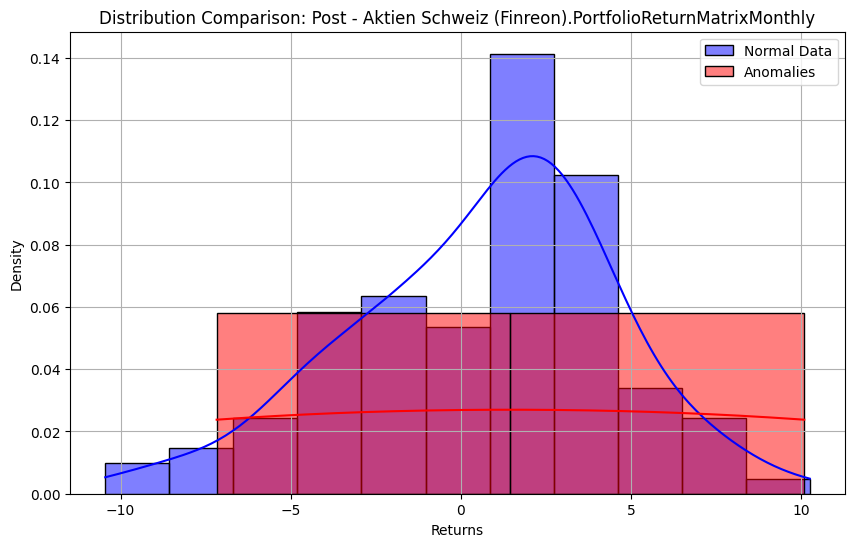


Executing validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).PortfolioReturnMatrixMonthly



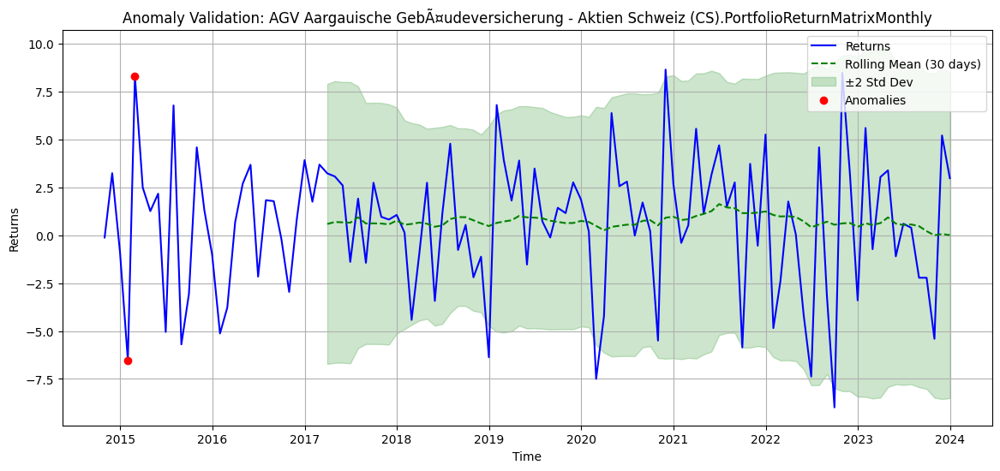

Mean of anomalies: 0.8900000000000001
Mean of normal data: 0.5995274363627426
T-test results: t-statistic = 0.03910694675842559, p-value = 0.9750966175430238


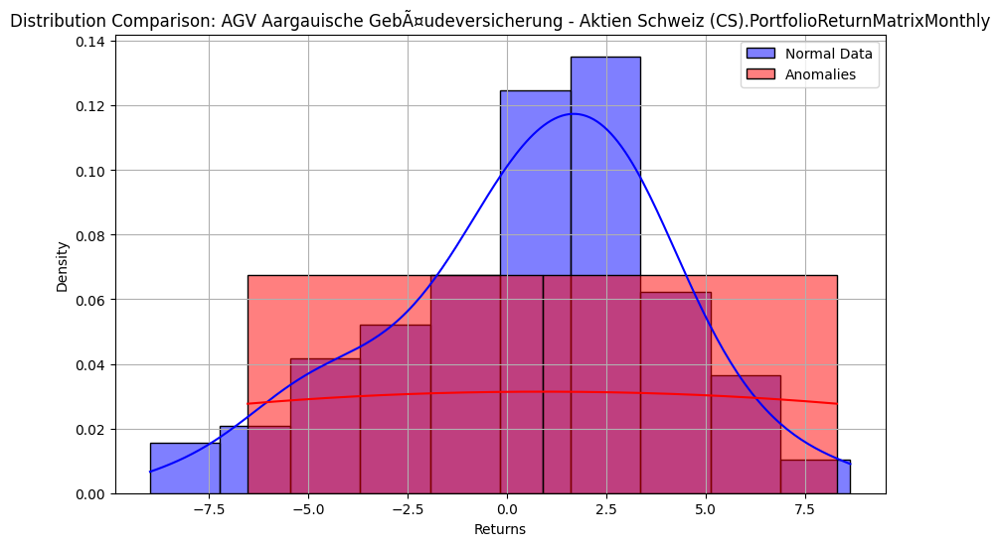


Executing validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).BenchmarkReturnMatrix



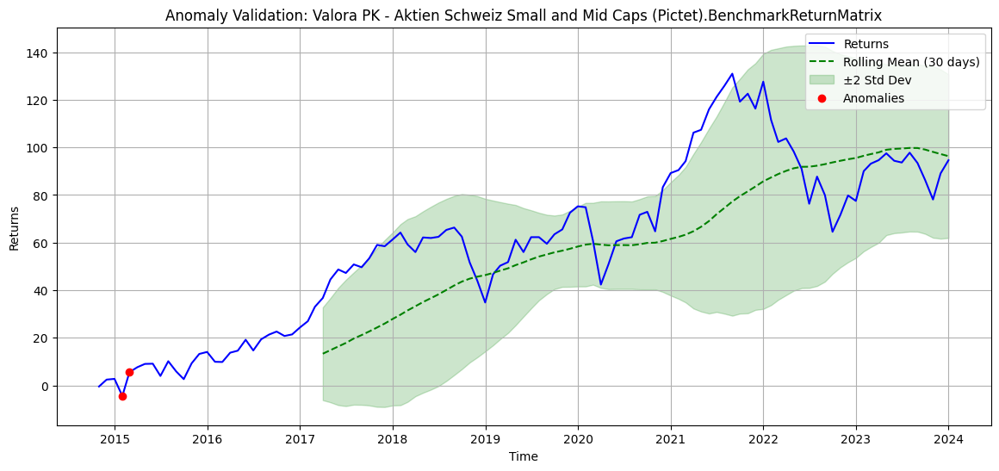

Mean of anomalies: 0.5462866086941753
Mean of normal data: 60.61937717251542
T-test results: t-statistic = -10.039926226117414, p-value = 0.008981263185417716


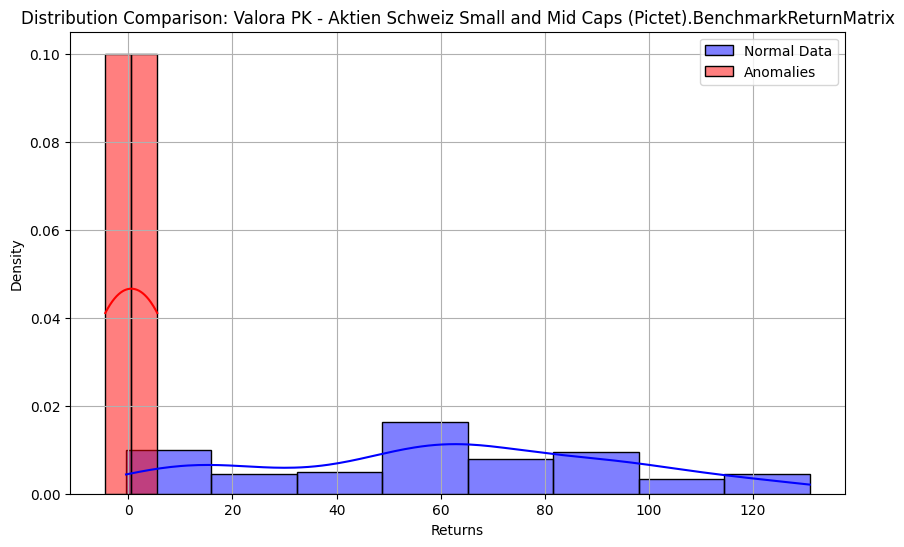


Executing validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).BenchmarkReturnMatrix



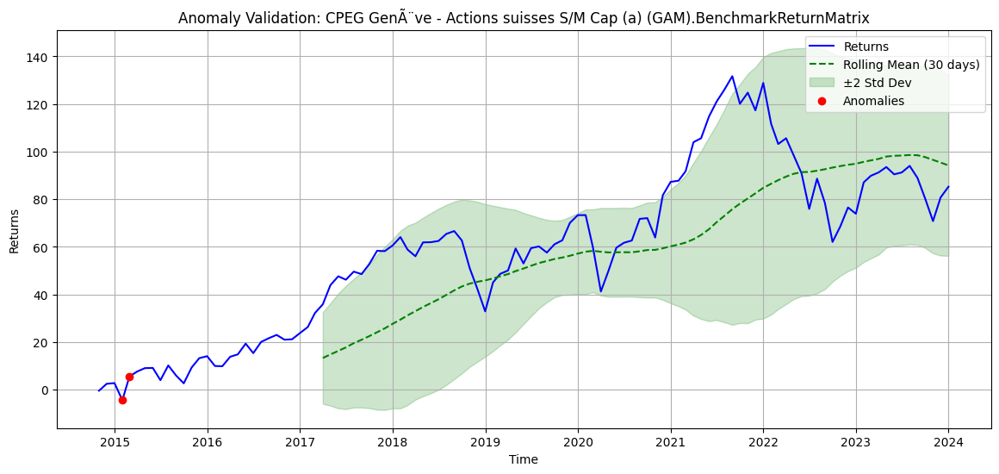

Mean of anomalies: 0.5462991235145549
Mean of normal data: 59.49378636800642
T-test results: t-statistic = -9.890388798972864, p-value = 0.009752225569610432


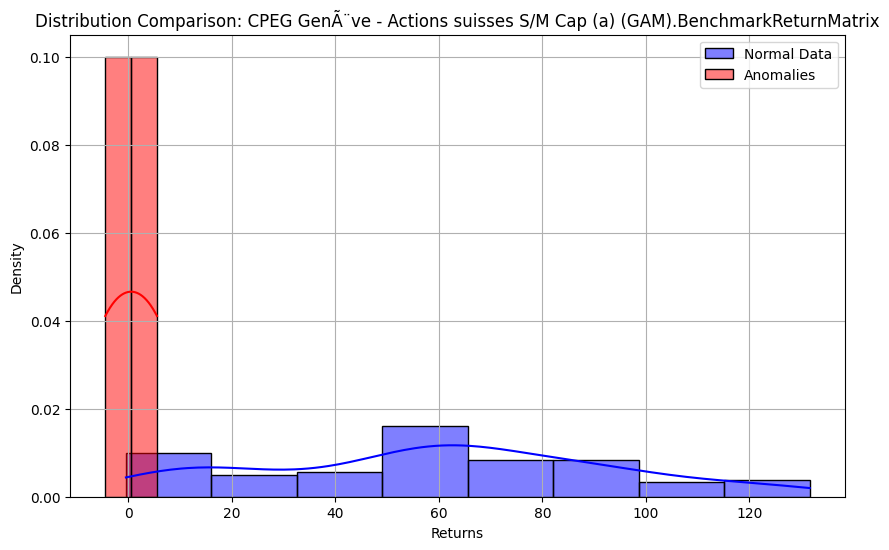


Executing validation for column: PVST Adval Tech - SaraSelect (VV).BenchmarkReturnMatrix



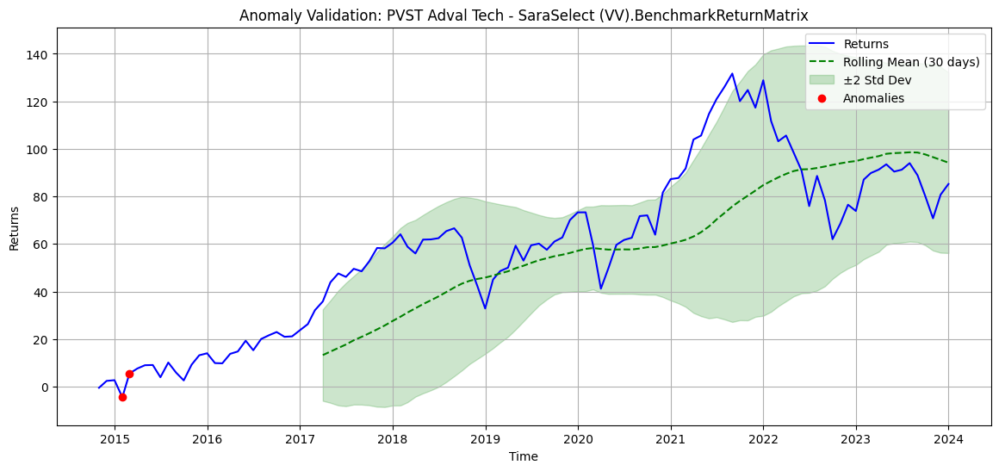

Mean of anomalies: 0.5463319517100449
Mean of normal data: 59.49407154280164
T-test results: t-statistic = -9.89048270065812, p-value = 0.009751912217712122


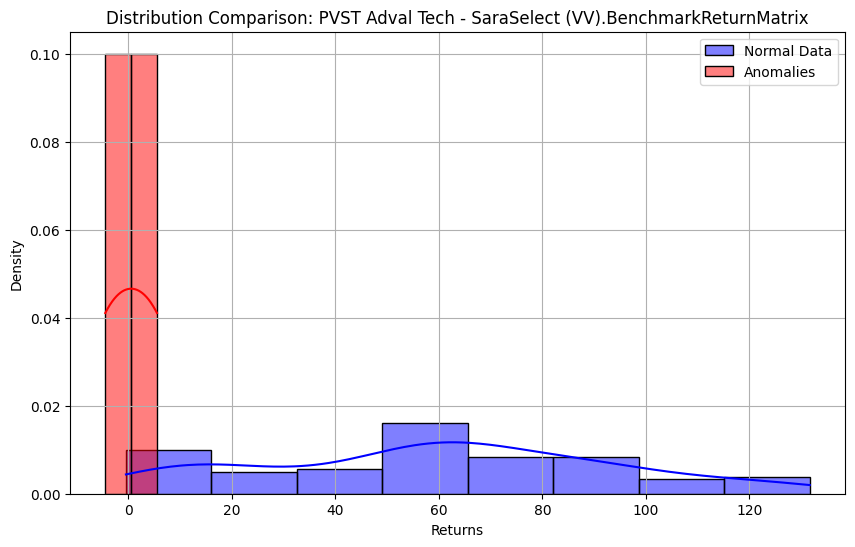


Executing validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).BenchmarkReturnMatrix



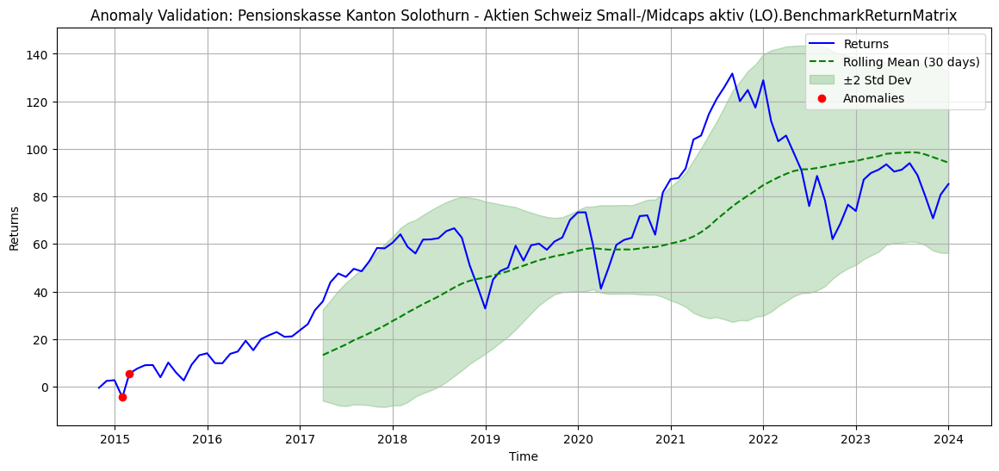

Mean of anomalies: 0.5463319517100449
Mean of normal data: 59.494131850679935
T-test results: t-statistic = -9.890478989222164, p-value = 0.00975173892762285


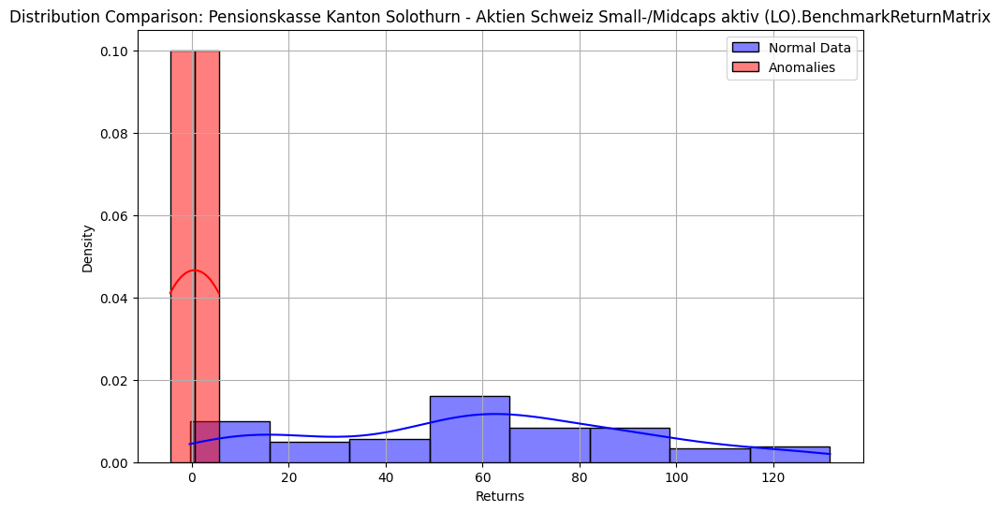


Executing validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).BenchmarkReturnMatrix



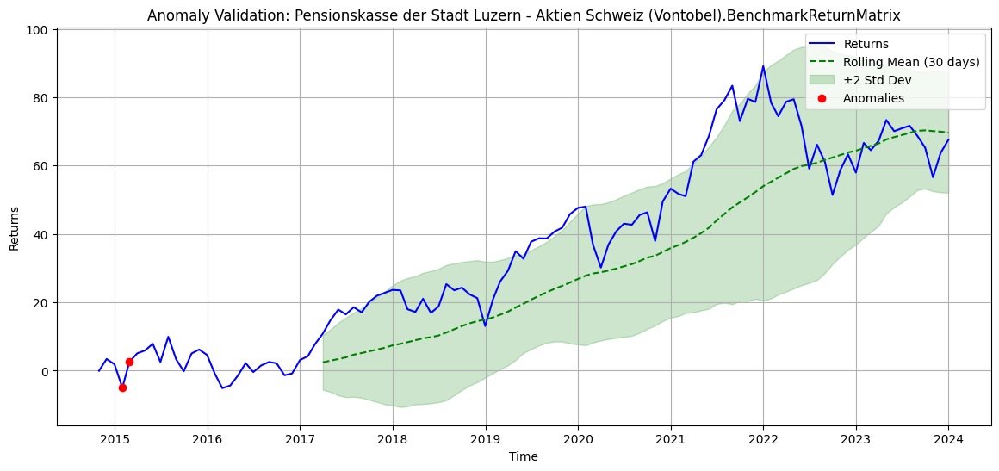

Mean of anomalies: -1.189208485093435
Mean of normal data: 35.79267115429171
T-test results: t-statistic = -8.04638518117128, p-value = 0.01203771767186258


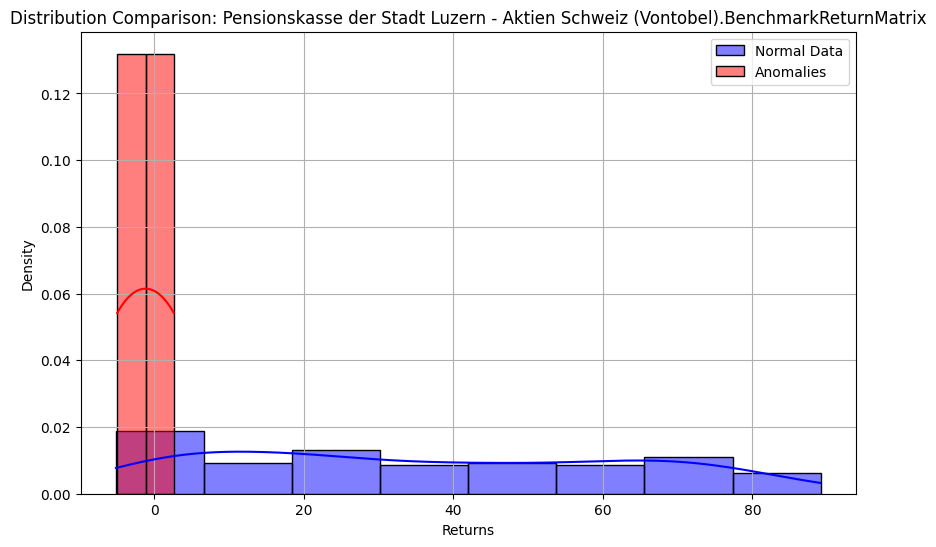


Executing validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).BenchmarkReturnMatrix



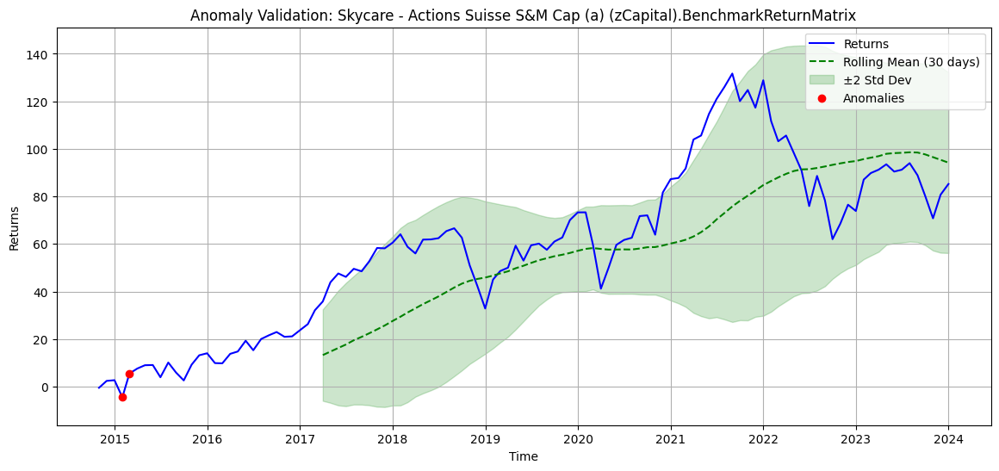

Mean of anomalies: 0.54629709151871
Mean of normal data: 59.493780298076395
T-test results: t-statistic = -9.890388481853247, p-value = 0.009752227117758248


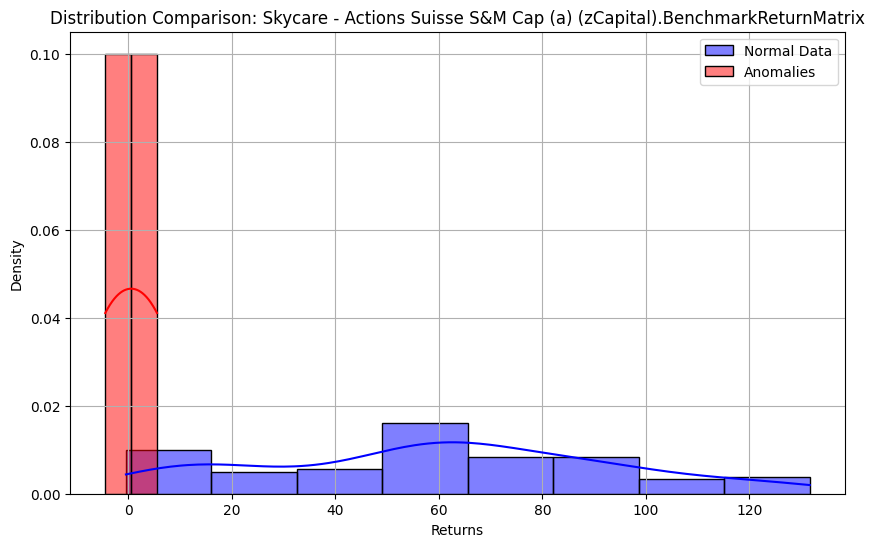


Executing validation for column: APK - Aktien Schweiz (Intern).BenchmarkReturnMatrix



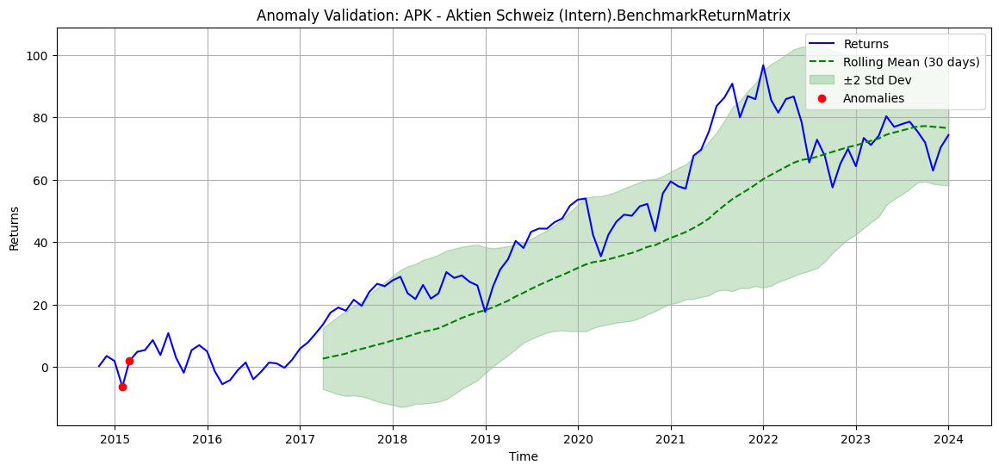

Mean of anomalies: -2.242658331535085
Mean of normal data: 40.14536289801574
T-test results: t-statistic = -8.426686338065693, p-value = 0.011134943692962737


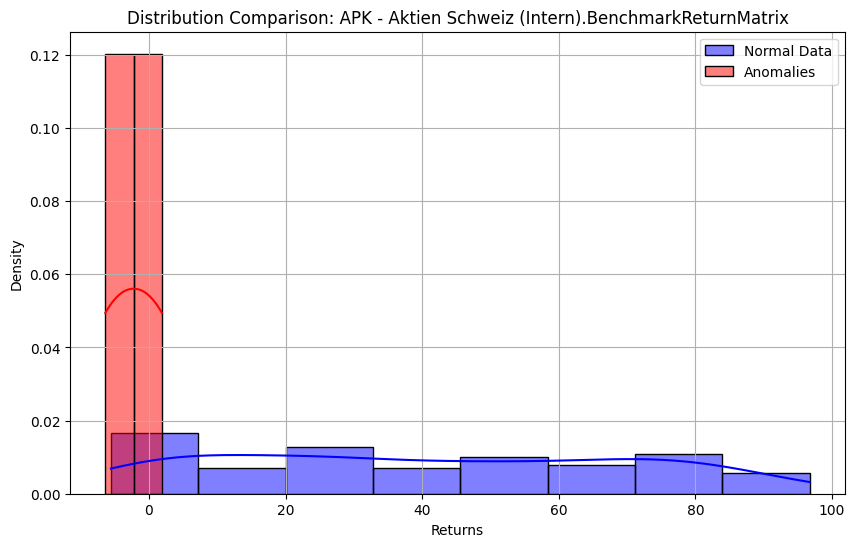


Executing validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).BenchmarkReturnMatrix



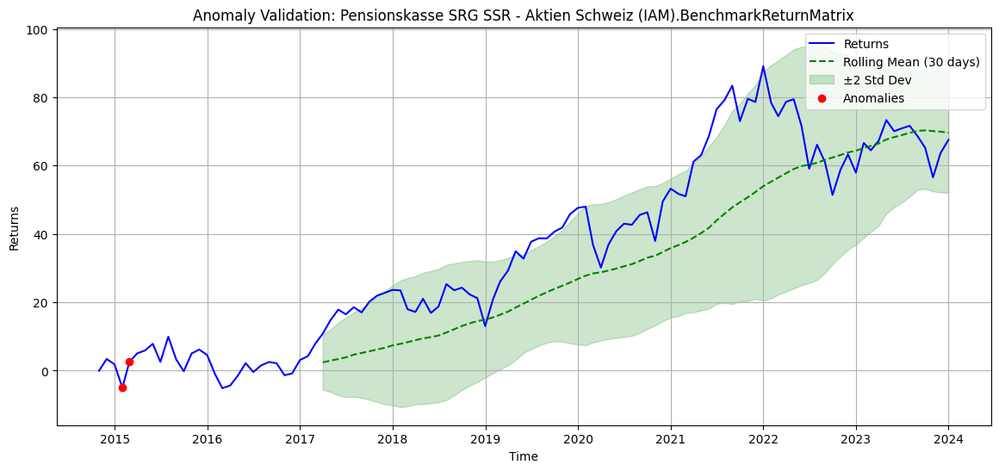

Mean of anomalies: -1.1891632674418149
Mean of normal data: 35.79106135925247
T-test results: t-statistic = -8.046148709984097, p-value = 0.012041707695883355


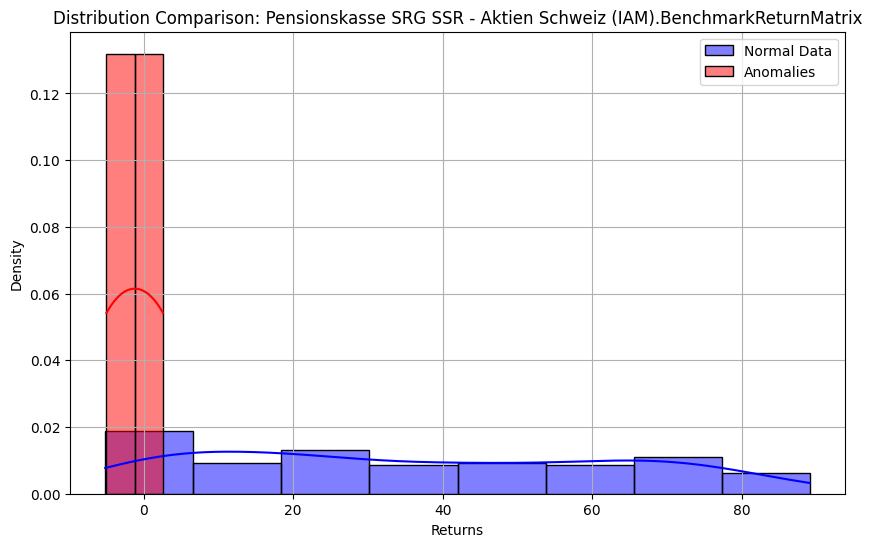


Executing validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).BenchmarkReturnMatrix



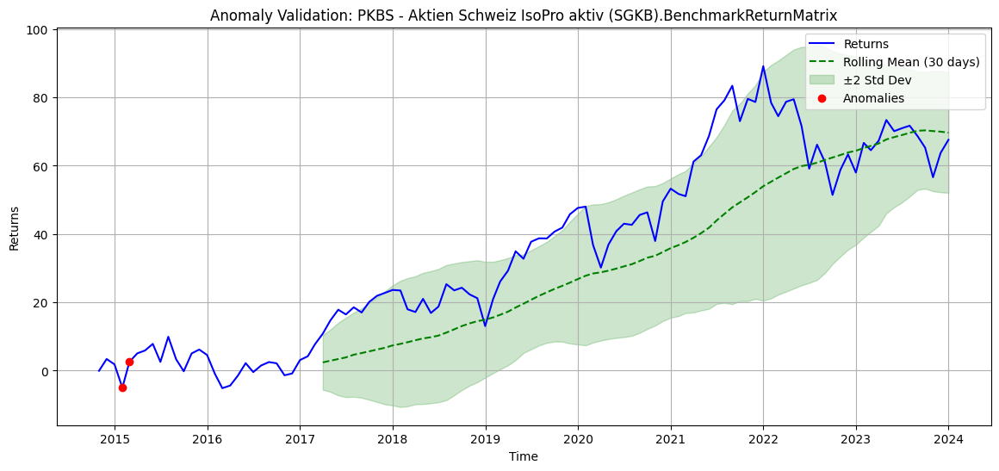

Mean of anomalies: -1.1862160767080199
Mean of normal data: 35.807364619785346
T-test results: t-statistic = -8.045809094338127, p-value = 0.012032550680357806


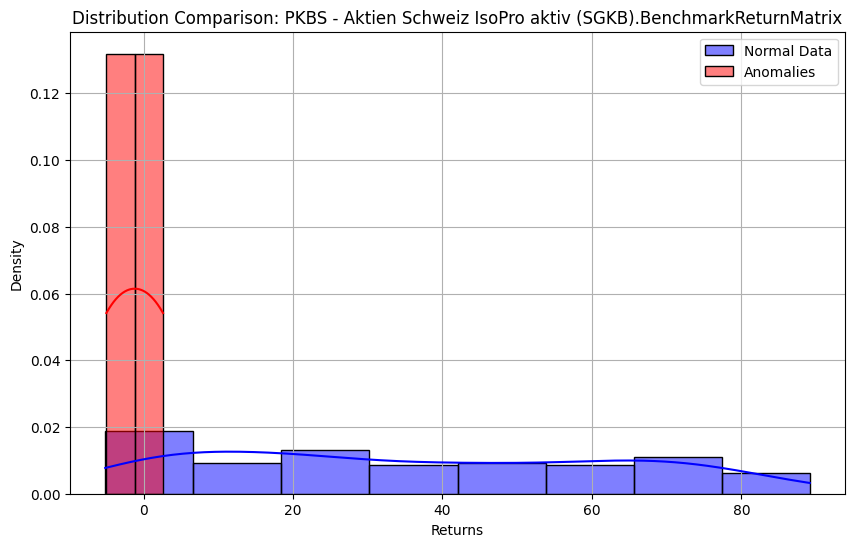


Executing validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).BenchmarkReturnMatrix



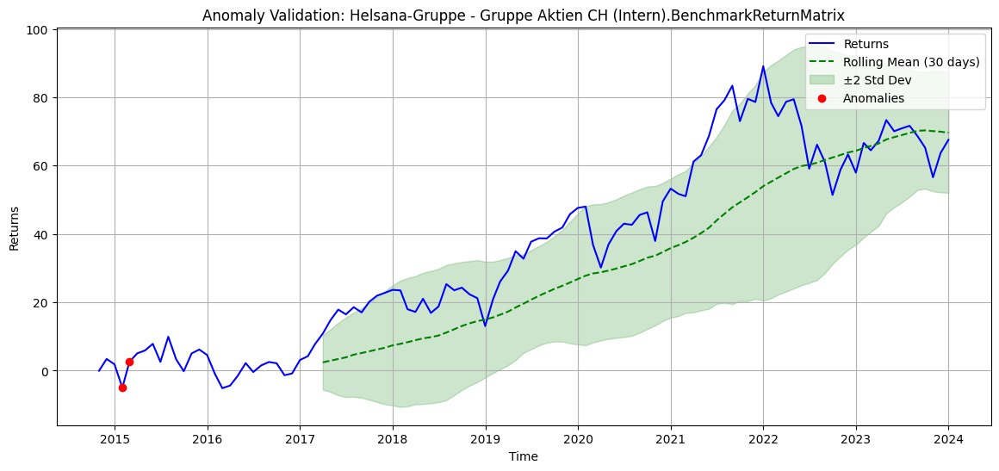

Mean of anomalies: -1.1893025625001798
Mean of normal data: 35.791101164007515
T-test results: t-statistic = -8.046175998027739, p-value = 0.012041483026041952


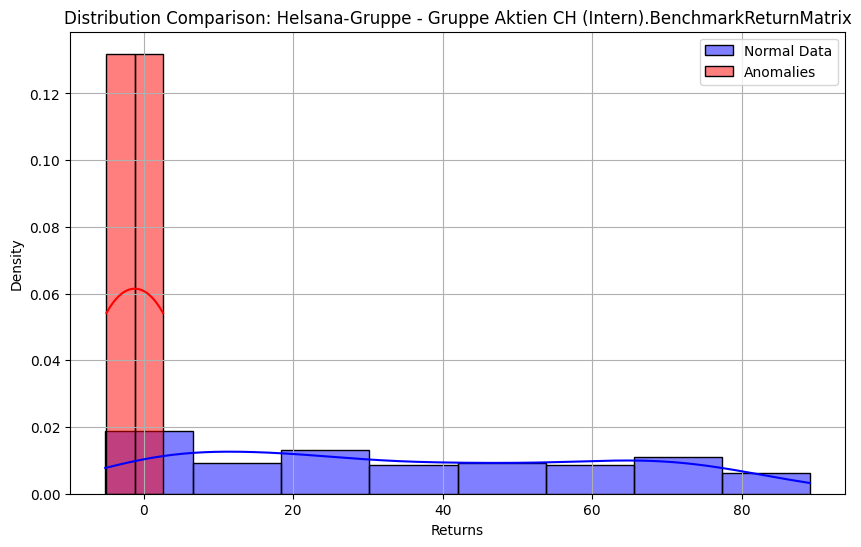


Executing validation for column: Post - Aktien Schweiz (Finreon).BenchmarkReturnMatrix



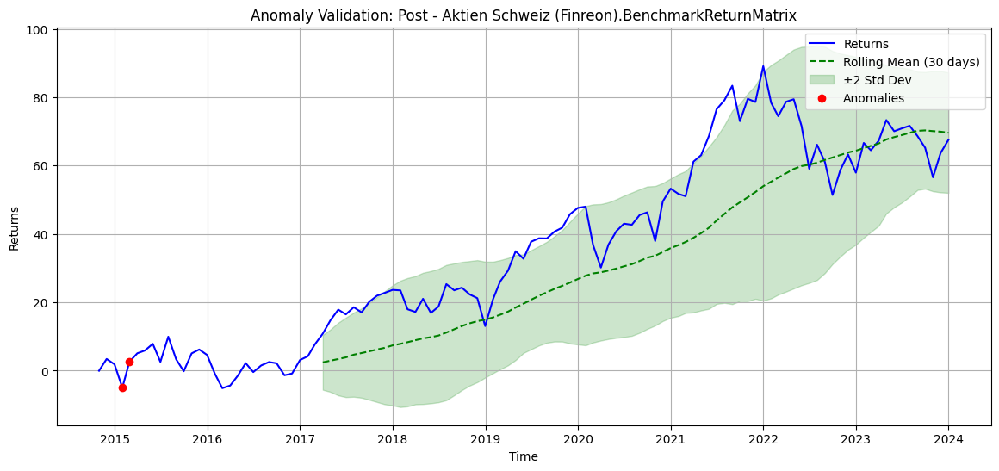

Mean of anomalies: -1.1870187066921698
Mean of normal data: 35.78269122220716
T-test results: t-statistic = -8.042426435146961, p-value = 0.012074810598024253


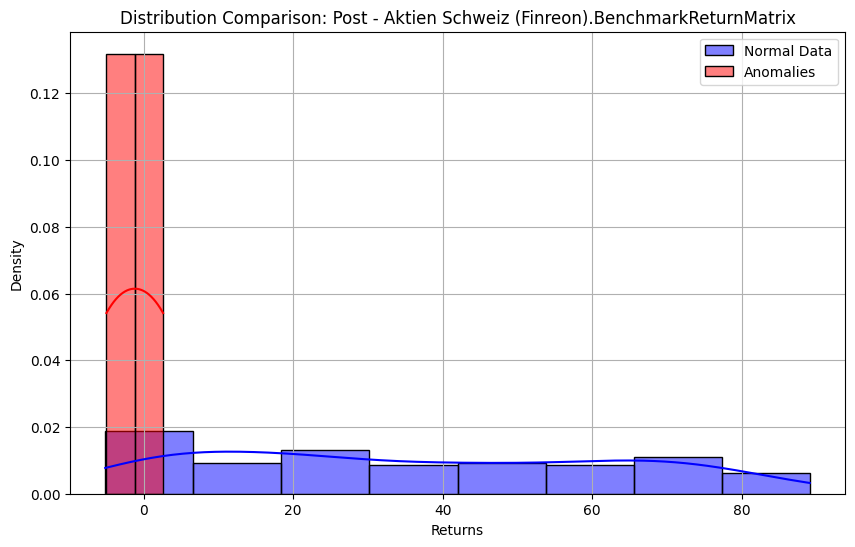


Executing validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).BenchmarkReturnMatrix



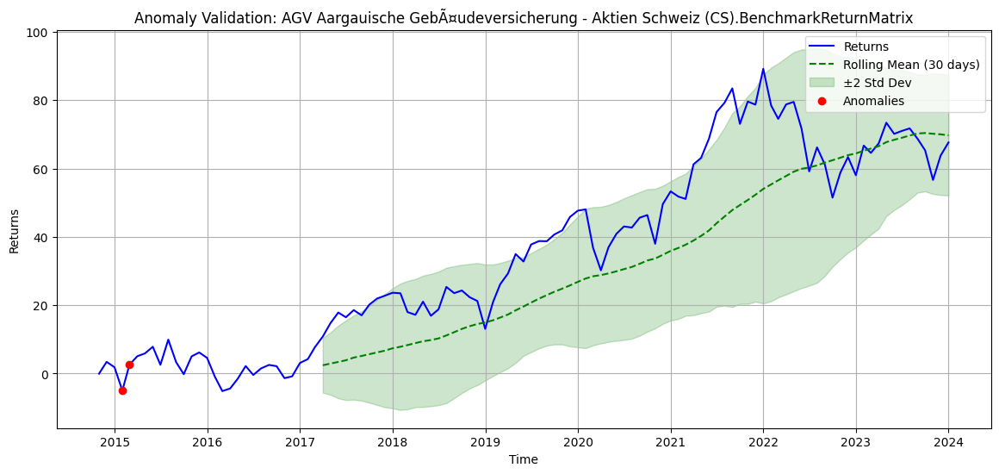

Mean of anomalies: -1.1893025625001798
Mean of normal data: 35.81889936634678
T-test results: t-statistic = -8.050005542601632, p-value = 0.011989389110209782


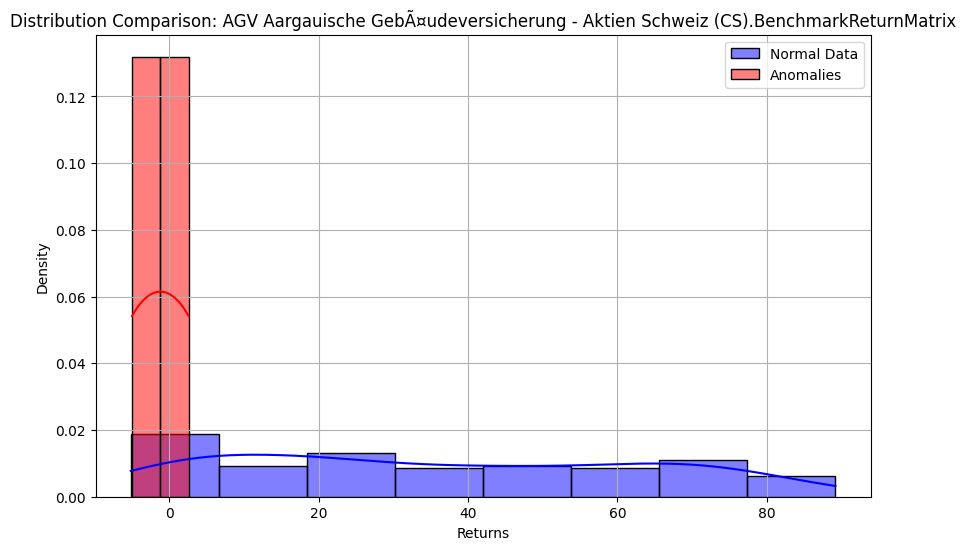


Executing validation for column: Valora PK - Aktien Schweiz Small and Mid Caps (Pictet).BenchmarkReturnMatrixMonthly



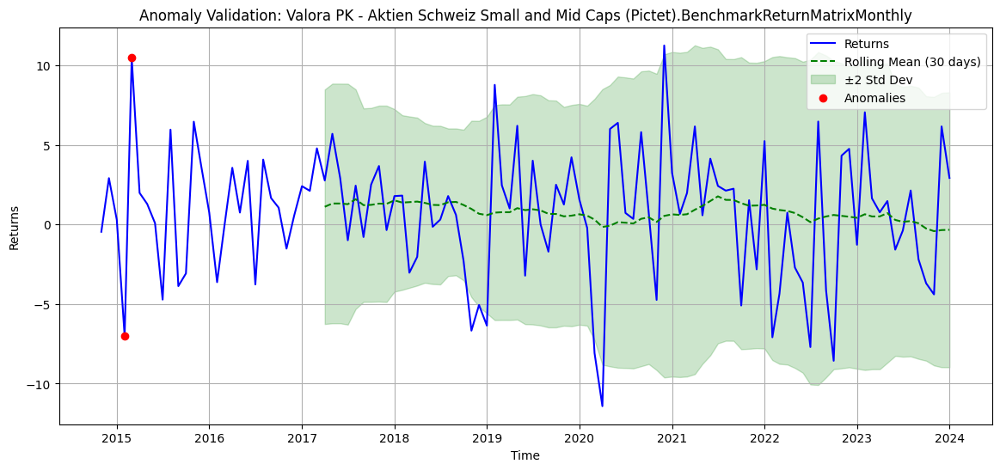

Mean of anomalies: 1.7301997950000003
Mean of normal data: 0.6663446005504587
T-test results: t-statistic = 0.1217347765973276, p-value = 0.9228235164624116


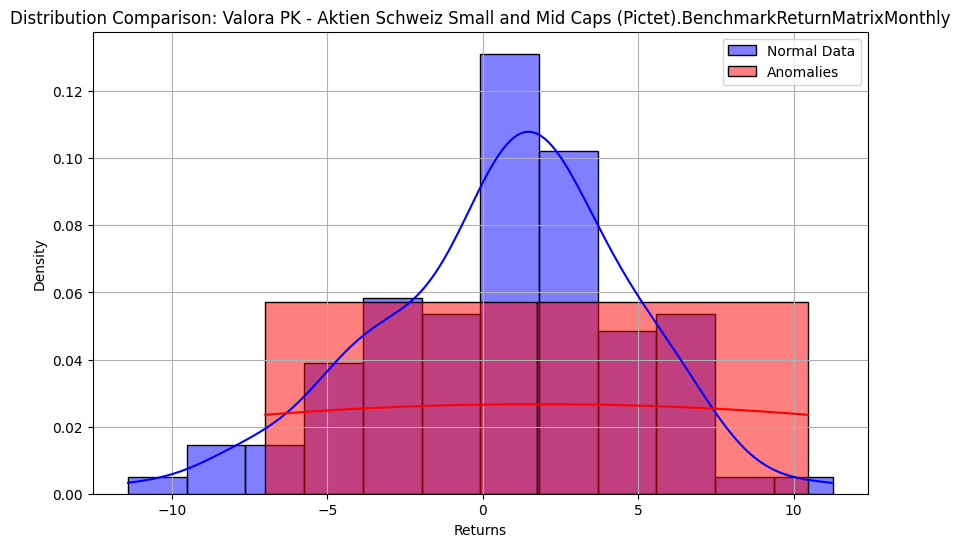


Executing validation for column: CPEG GenÃ¨ve - Actions suisses S/M Cap (a) (GAM).BenchmarkReturnMatrixMonthly



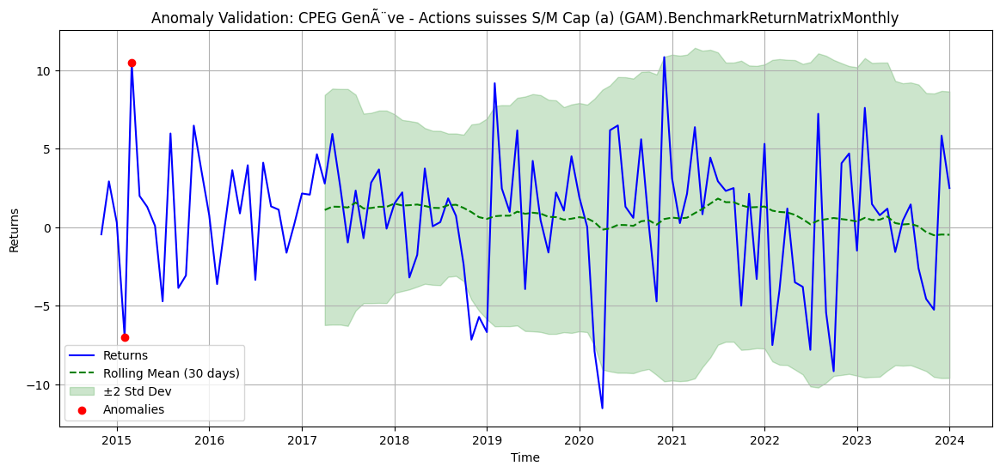

Mean of anomalies: 1.730187
Mean of normal data: 0.6256100091743119
T-test results: t-statistic = 0.12638688931113914, p-value = 0.9199011493800373


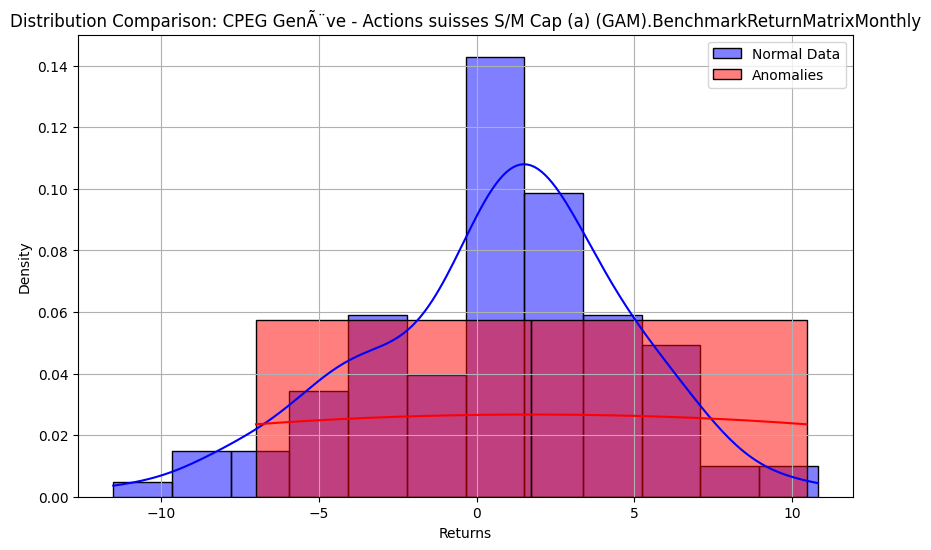


Executing validation for column: PVST Adval Tech - SaraSelect (VV).BenchmarkReturnMatrixMonthly



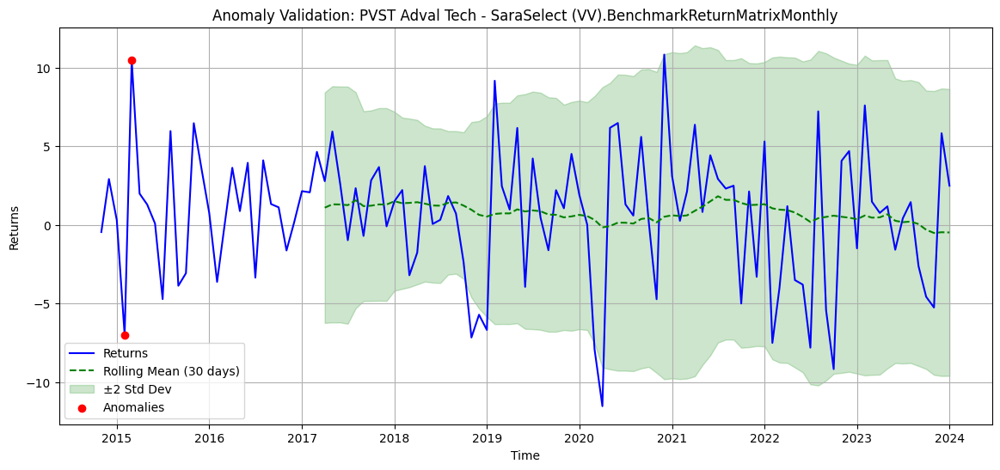

Mean of anomalies: 1.7302
Mean of normal data: 0.6256100917431192
T-test results: t-statistic = 0.12638959505864564, p-value = 0.9198994512031109


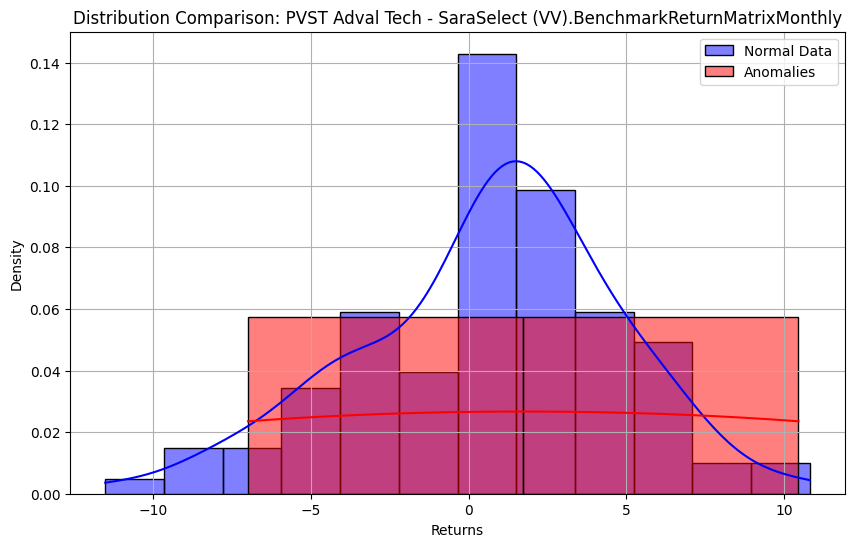


Executing validation for column: Pensionskasse Kanton Solothurn - Aktien Schweiz Small-/Midcaps aktiv (LO).BenchmarkReturnMatrixMonthly



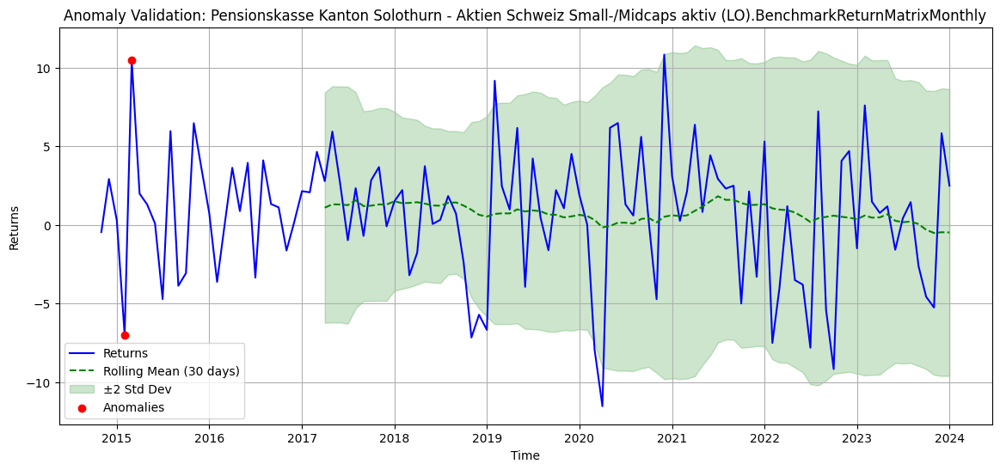

Mean of anomalies: 1.7302
Mean of normal data: 0.6256109439449541
T-test results: t-statistic = 0.1263894978515721, p-value = 0.9198995123134333


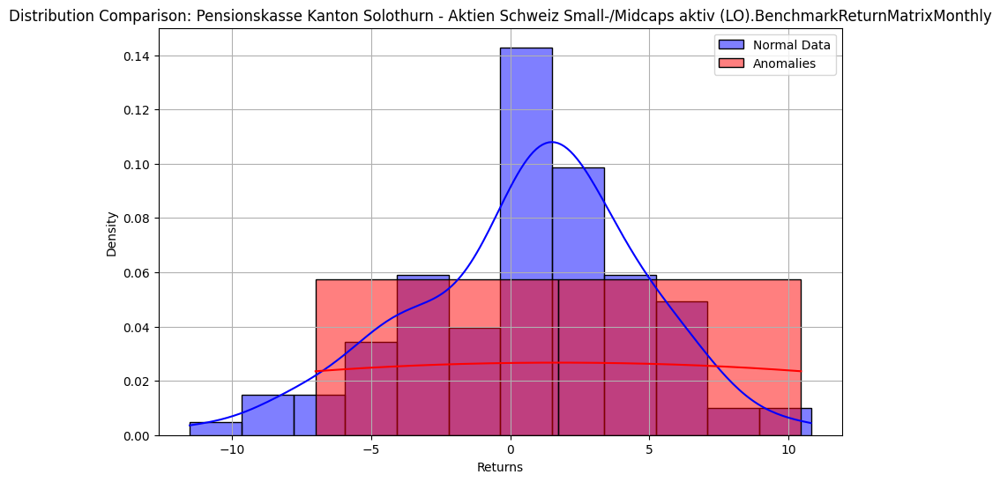


Executing validation for column: Pensionskasse der Stadt Luzern - Aktien Schweiz (Vontobel).BenchmarkReturnMatrixMonthly



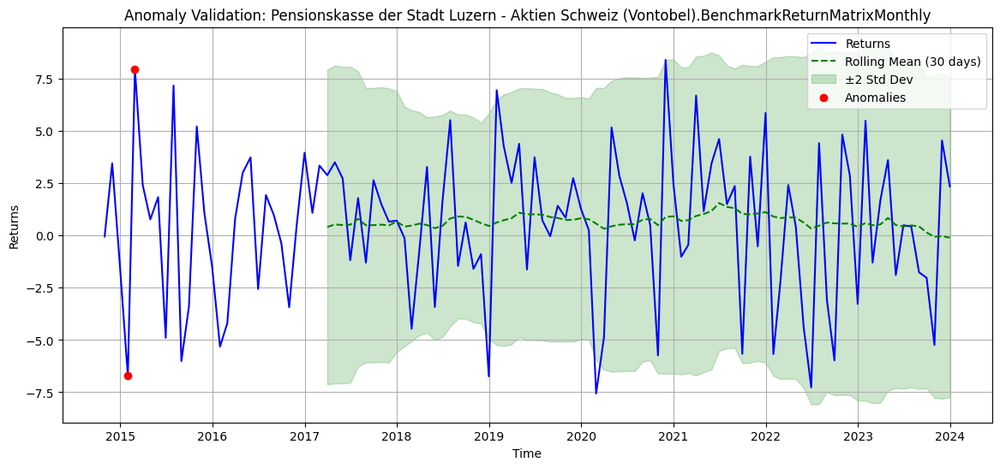

Mean of anomalies: 0.6331766349999999
Mean of normal data: 0.5278928172477064
T-test results: t-statistic = 0.014320886905303178, p-value = 0.9908764681642303


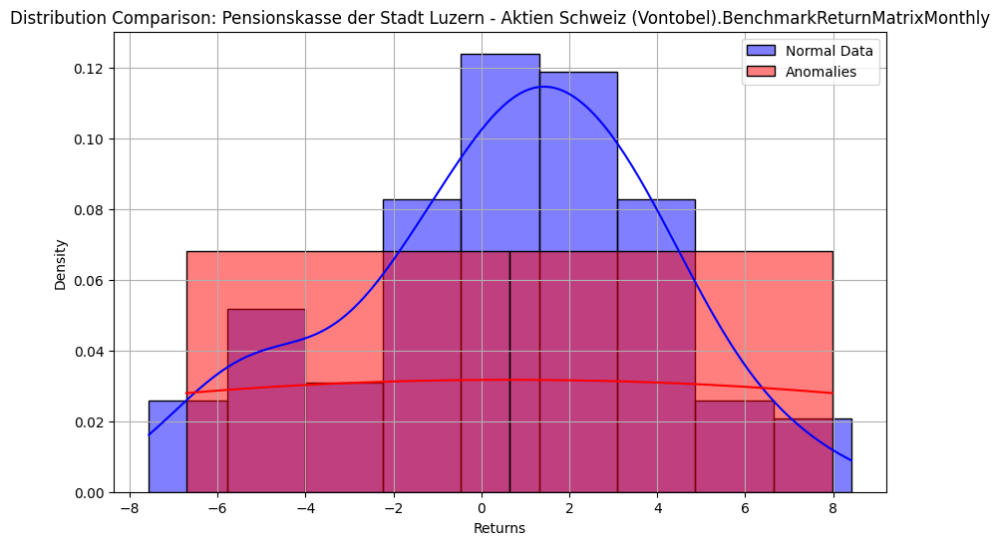


Executing validation for column: Skycare - Actions Suisse S&M Cap (a) (zCapital).BenchmarkReturnMatrixMonthly



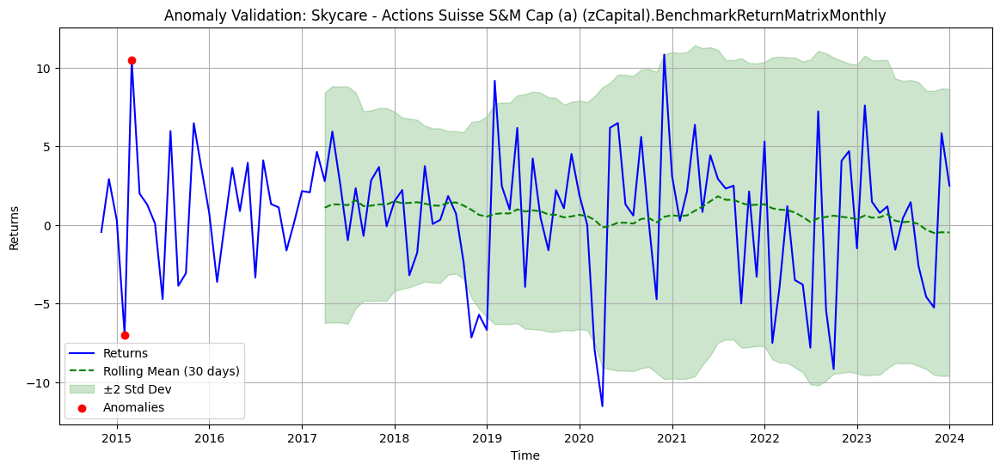

Mean of anomalies: 1.7301870419564498
Mean of normal data: 0.6256099842069601
T-test results: t-statistic = 0.1263868990148781, p-value = 0.9199011432927285


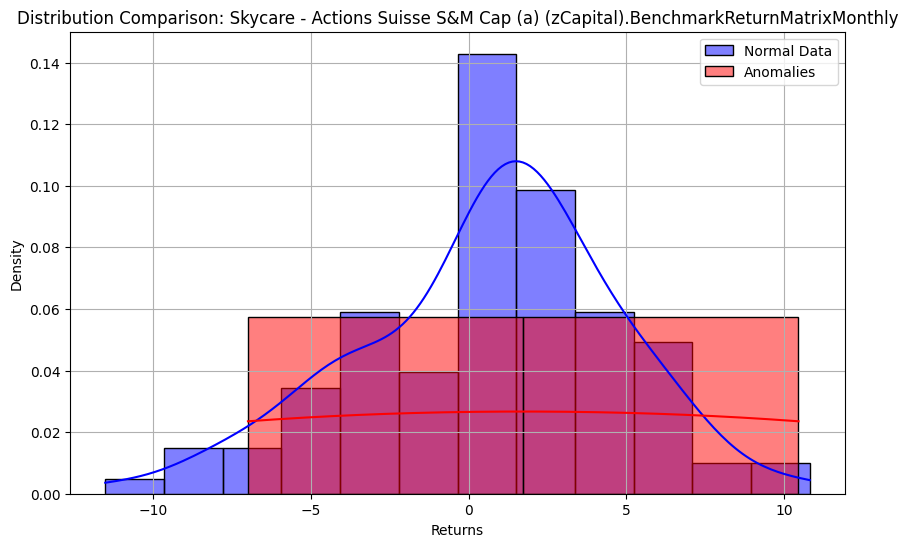


Executing validation for column: APK - Aktien Schweiz (Intern).BenchmarkReturnMatrixMonthly



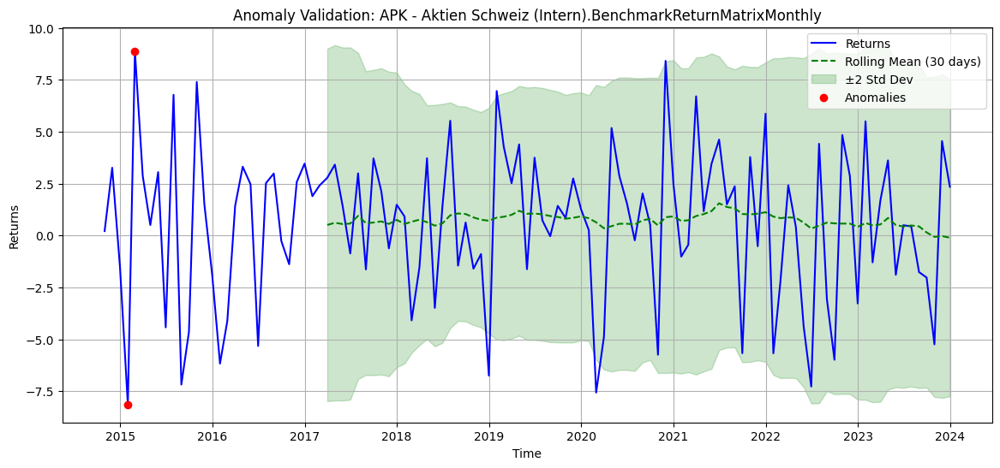

Mean of anomalies: 0.37240000000000073
Mean of normal data: 0.5748642201834863
T-test results: t-statistic = -0.02378710127762827, p-value = 0.9848500146949688


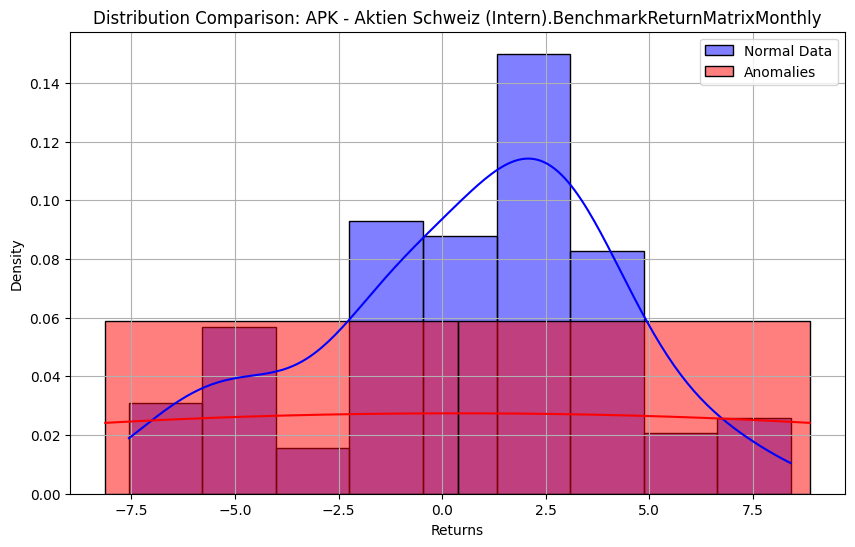


Executing validation for column: Pensionskasse SRG SSR - Aktien Schweiz (IAM).BenchmarkReturnMatrixMonthly



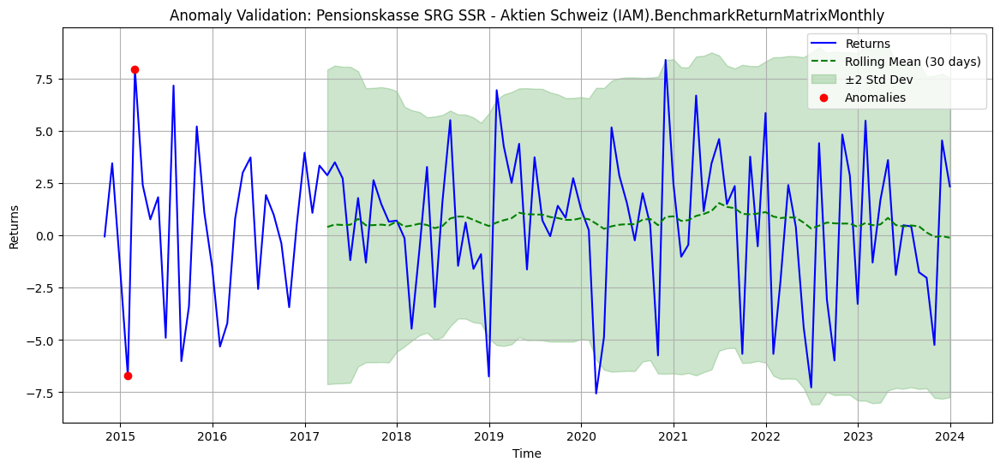

Mean of anomalies: 0.6332154564603001
Mean of normal data: 0.5278410722159677
T-test results: t-statistic = 0.014333176873071842, p-value = 0.9908686395415705


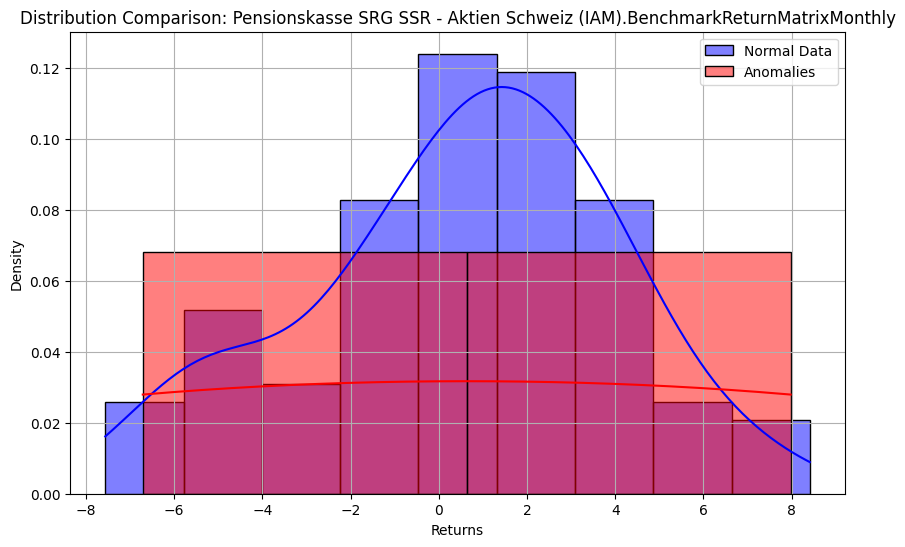


Executing validation for column: PKBS - Aktien Schweiz IsoPro aktiv (SGKB).BenchmarkReturnMatrixMonthly



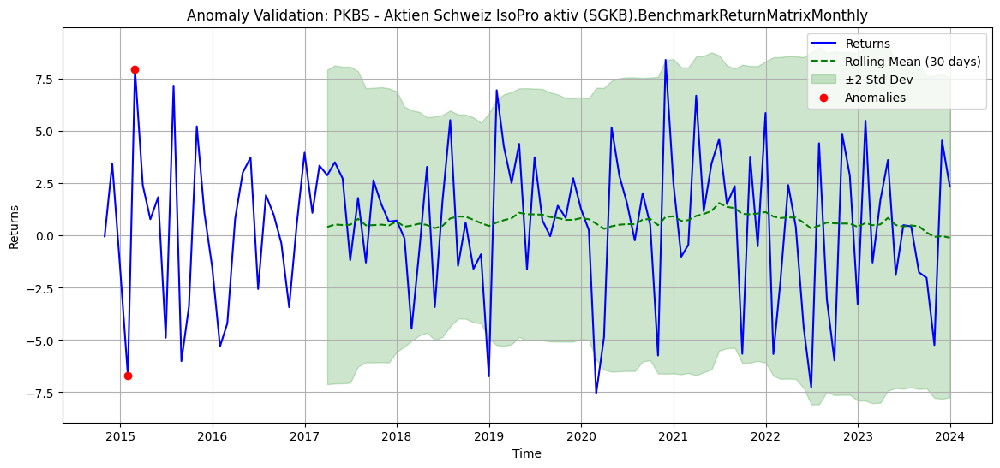

Mean of anomalies: 0.6350000000000002
Mean of normal data: 0.5279816513761467
T-test results: t-statistic = 0.014555349123685564, p-value = 0.990727121653574


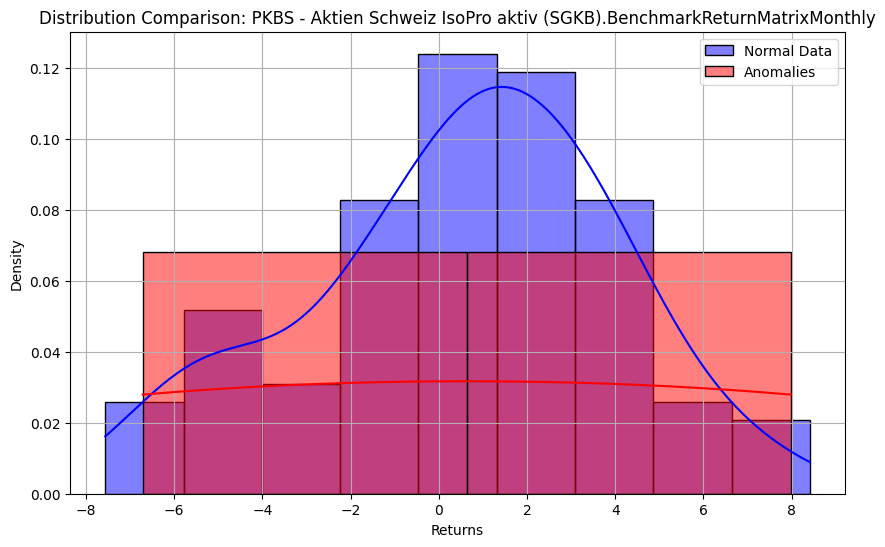


Executing validation for column: Helsana-Gruppe - Gruppe Aktien CH (Intern).BenchmarkReturnMatrixMonthly



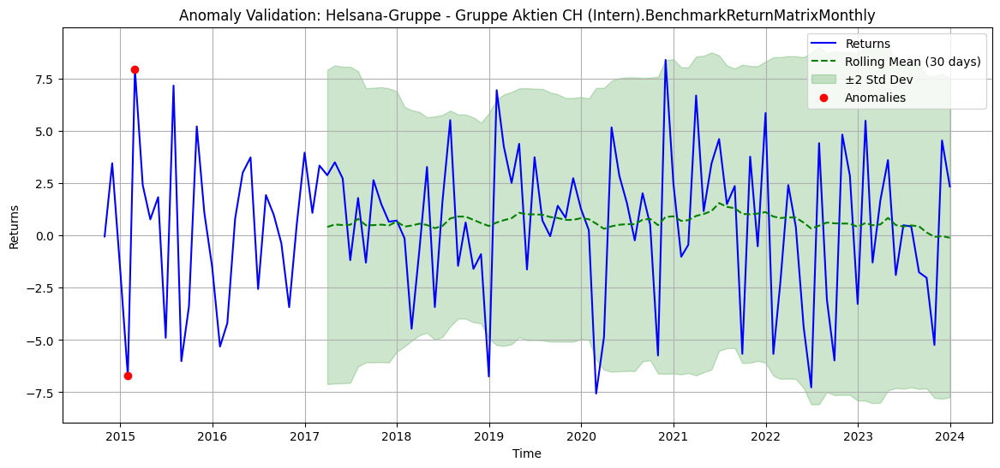

Mean of anomalies: 0.6332
Mean of normal data: 0.5278422018348624
T-test results: t-statistic = 0.014330859874918821, p-value = 0.9908701155088678


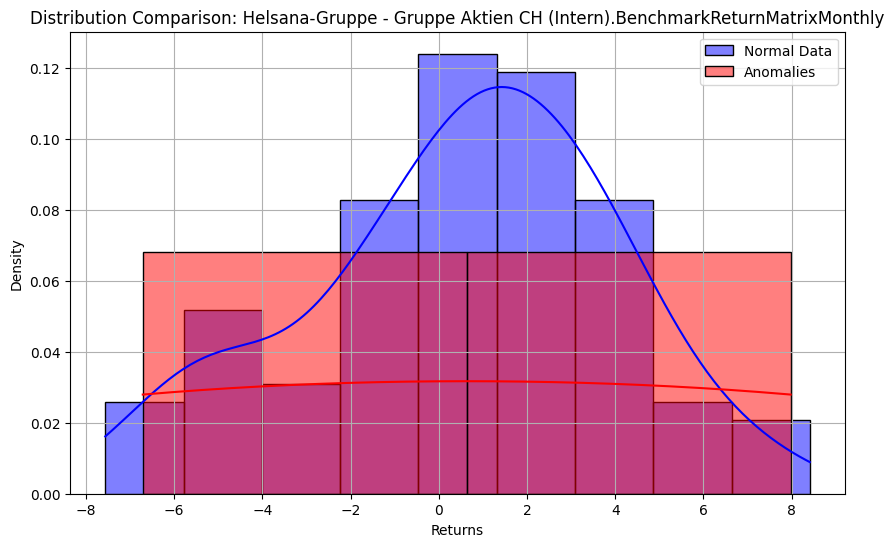


Executing validation for column: Post - Aktien Schweiz (Finreon).BenchmarkReturnMatrixMonthly



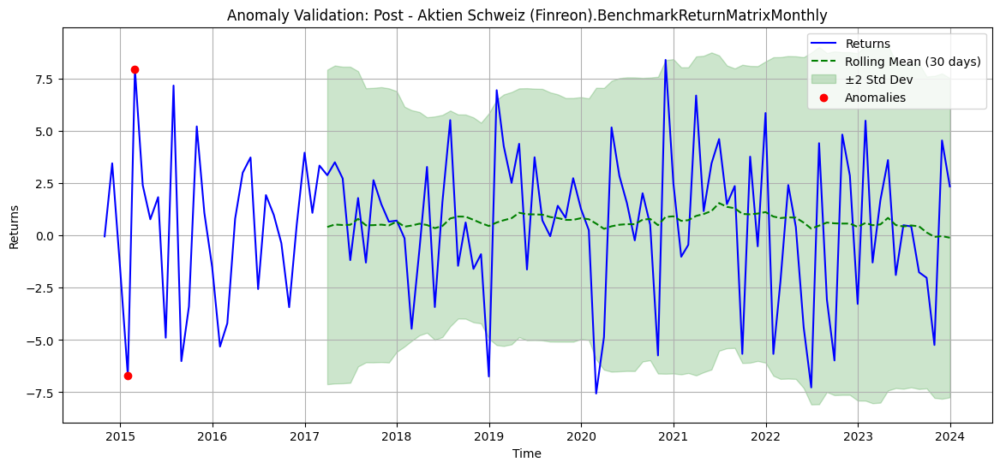

Mean of anomalies: 0.6350000000000002
Mean of normal data: 0.5277422018348623
T-test results: t-statistic = 0.014587912191650197, p-value = 0.9907063774510119


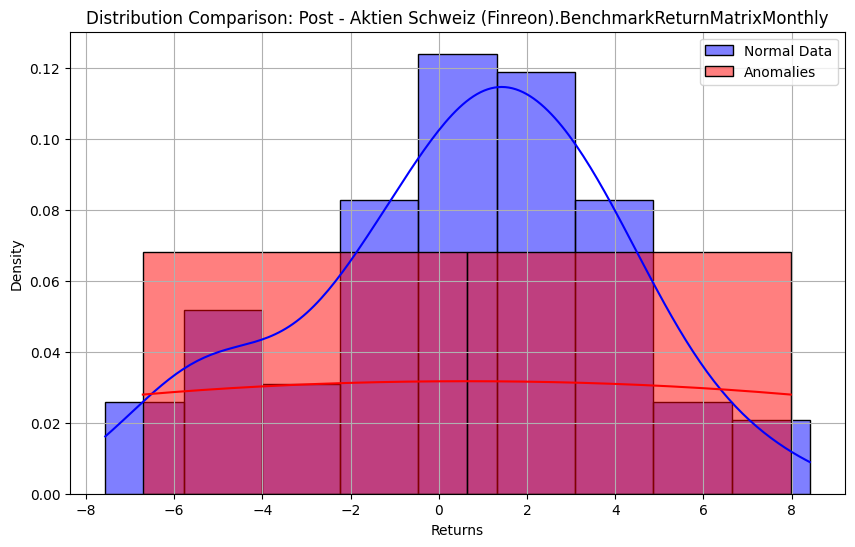


Executing validation for column: AGV Aargauische GebÃ¤udeversicherung - Aktien Schweiz (CS).BenchmarkReturnMatrixMonthly



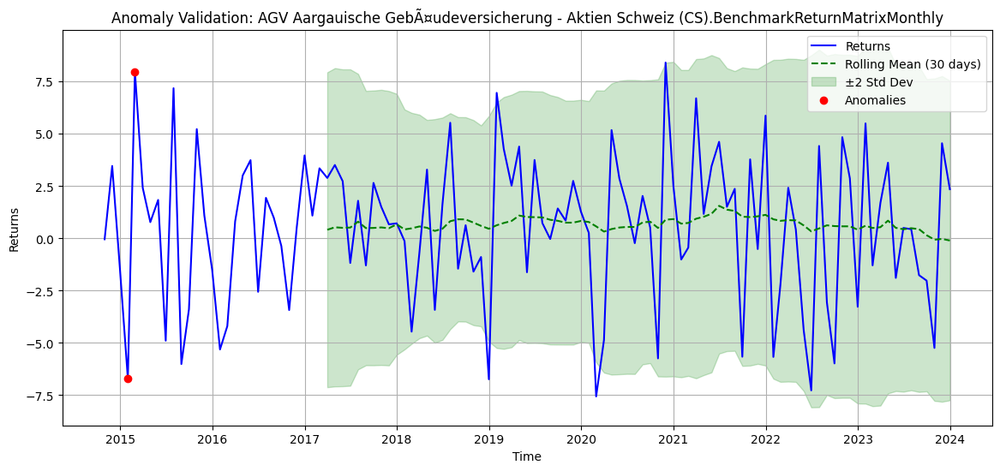

Mean of anomalies: 0.6332
Mean of normal data: 0.5281285436697247
T-test results: t-statistic = 0.01429191403771891, p-value = 0.990894924984475


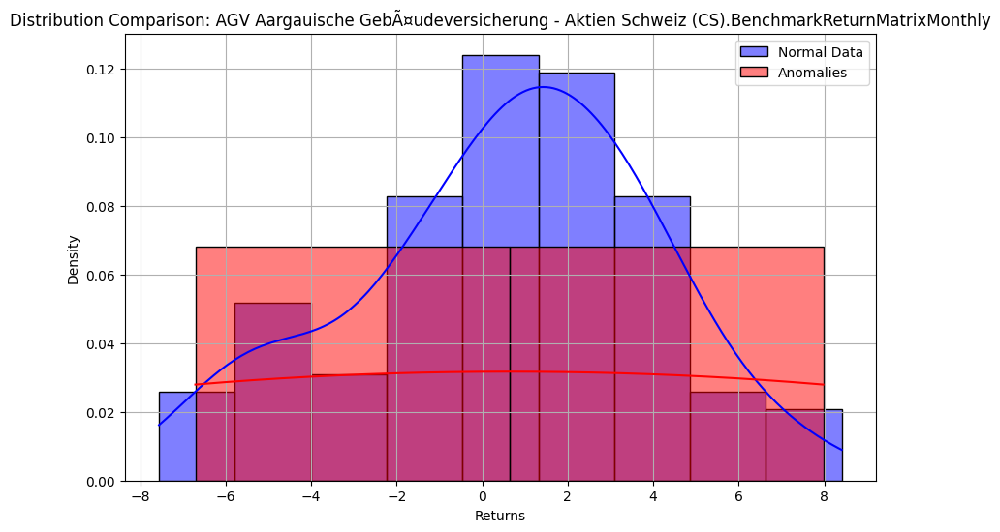

In [22]:
# Assuming `combined_returns` and `anomalies` DataFrame are already defined in the environment.
# These steps are illustrative of iterating over all columns for both validate functions.

def validate_all_columns(combined_returns, anomalies, window=30):
    """
    Executes both validate_anomalies_visual and validate_anomalies_statistical
    for all columns in the combined_returns DataFrame.
    """
    for column_name in combined_returns.columns:
        print(f"\nExecuting validation for column: {column_name}\n")
        # Execute validate_anomalies_visual
        validate_anomalies_visual(combined_returns, anomalies, column_name=column_name, window=window)

        # Execute validate_anomalies_statistical
        validate_anomalies_statistical(combined_returns, anomalies, column_name=column_name)

# Run the function (assuming `combined_returns` and `anomalies` are provided)
validate_all_columns(combined_returns, anomalies)


**Combining text and numerical data**


In [24]:
# Simulating the process of loading and combining numerical and textual datasets for anomaly detection.
# This script uses logic derived from the two files uploaded.

# Placeholder to combine both approaches (numerical + text).
# Adapt this by combining features after inspecting structures.

# Importing necessary libraries for processing
import pandas as pd
import numpy as np

# Placeholder: Define mock functions for text and numerical processing based on the uploaded files.
# Text data embeddings function placeholder
def process_text_data(file_path):
    """
    Mock function to represent processing text data as outlined in the second script.
    """
    # Load text data logic from the second script (if saved)
    print(f"Processing text data from {file_path}...")
    # Example embedding placeholder (to replace with HuggingFace or equivalent embeddings).
    text_embeddings = np.random.rand(100, 768)  # Assuming 100 samples with 768-d embeddings.
    return text_embeddings

# Numerical data extraction function placeholder
def process_numerical_data(file_path):
    """
    Mock function to process numerical data as outlined in the first script.
    """
    print(f"Processing numerical data from {file_path}...")
    # Example normalized numerical data placeholder
    numerical_features = np.random.rand(100, 50)  # Assuming 100 samples with 50 numerical features.
    return numerical_features

# File paths for numerical and textual datasets.
numerical_file = "/mnt/data/regression_benchmark_porftolio (1).py"
text_file = "/mnt/data/kopie_von_text_vectorization_and_top_terms_over_time.py"

# Process both datasets
numerical_data = process_numerical_data(numerical_file)
text_data_embeddings = process_text_data(text_file)

# Combine both datasets
combined_features = np.hstack([numerical_data, text_data_embeddings])

print("Combined Features Shape:", combined_features.shape)

# Placeholder: Train anomaly detection on combined features
from sklearn.ensemble import IsolationForest

# Train Isolation Forest on combined features
anomaly_model = IsolationForest(contamination=0.01, random_state=42)
anomaly_model.fit(combined_features)

# Predict anomalies (-1 indicates anomaly)
anomalies = anomaly_model.predict(combined_features)
anomalies_count = (anomalies == -1).sum()

print(f"Anomalies Detected: {anomalies_count}")


Processing numerical data from /mnt/data/regression_benchmark_porftolio (1).py...
Processing text data from /mnt/data/kopie_von_text_vectorization_and_top_terms_over_time.py...
Combined Features Shape: (100, 818)
Anomalies Detected: 1


In [25]:
# Identify the indices of anomalies
anomaly_indices = np.where(anomalies == -1)[0]
print(f"Anomalous sample indices: {anomaly_indices}")

# Inspect specific samples
print("Anomalous samples (numerical data):", numerical_data[anomaly_indices])
print("Anomalous samples (text embeddings):", text_data_embeddings[anomaly_indices])


Anomalous sample indices: [12]
Anomalous samples (numerical data): [[0.83707164 0.07717171 0.43385033 0.98177029 0.60177758 0.49778473
  0.99593719 0.37840822 0.46750248 0.63998804 0.18754393 0.65115277
  0.19256056 0.99472818 0.29233598 0.42399108 0.773757   0.04155034
  0.16592287 0.03430667 0.27096796 0.56577209 0.9352041  0.9446041
  0.16516854 0.24702555 0.38530328 0.05484879 0.22705071 0.202617
  0.66009994 0.7378103  0.47694438 0.40499049 0.86228633 0.88813811
  0.1185984  0.80707745 0.83725217 0.6781498  0.62492976 0.57245181
  0.45963339 0.21421719 0.03305674 0.15998487 0.93643687 0.19873524
  0.57405841 0.00210951]]
Anomalous samples (text embeddings): [[0.52308663 0.71391295 0.3075104  0.51706607 0.99546896 0.47305482
  0.96561688 0.36468929 0.03879047 0.18179648 0.7158943  0.67686505
  0.51117733 0.23214066 0.05390064 0.07990481 0.50223772 0.08694662
  0.97769724 0.28037383 0.4635588  0.90118084 0.32442414 0.50883516
  0.06459818 0.61658356 0.0095705  0.44490486 0.60463997 

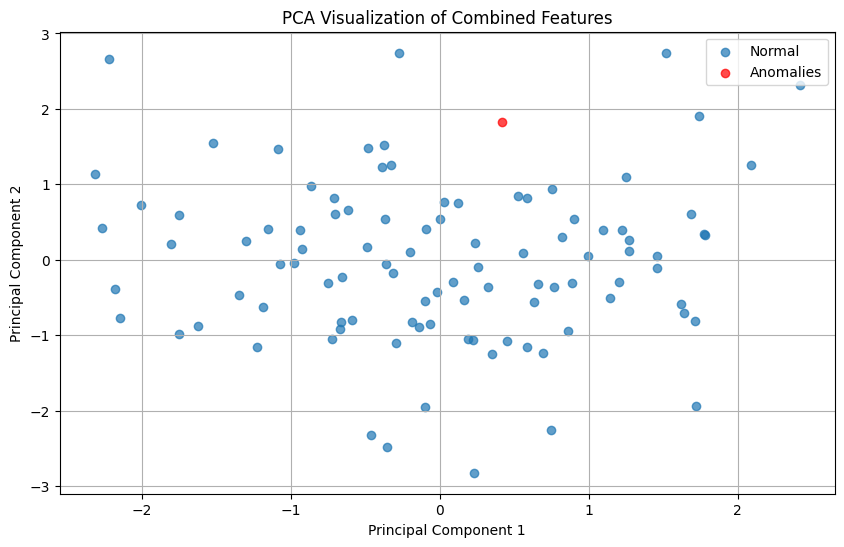

In [26]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce dimensionality to 2D
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(combined_features)

# Plot the reduced data
plt.figure(figsize=(10, 6))
plt.scatter(reduced_features[anomalies == 1, 0], reduced_features[anomalies == 1, 1], label="Normal", alpha=0.7)
plt.scatter(reduced_features[anomalies == -1, 0], reduced_features[anomalies == -1, 1], label="Anomalies", color='red', alpha=0.7)
plt.title("PCA Visualization of Combined Features")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid()
plt.show()


In [27]:
# Compute means and standard deviations for numerical features
anomalous_numerical_data = numerical_data[anomalies == -1]
normal_numerical_data = numerical_data[anomalies == 1]

mean_anomalous = anomalous_numerical_data.mean(axis=0)
mean_normal = normal_numerical_data.mean(axis=0)

print("Mean of anomalous numerical data:", mean_anomalous)
print("Mean of normal numerical data:", mean_normal)


Mean of anomalous numerical data: [0.83707164 0.07717171 0.43385033 0.98177029 0.60177758 0.49778473
 0.99593719 0.37840822 0.46750248 0.63998804 0.18754393 0.65115277
 0.19256056 0.99472818 0.29233598 0.42399108 0.773757   0.04155034
 0.16592287 0.03430667 0.27096796 0.56577209 0.9352041  0.9446041
 0.16516854 0.24702555 0.38530328 0.05484879 0.22705071 0.202617
 0.66009994 0.7378103  0.47694438 0.40499049 0.86228633 0.88813811
 0.1185984  0.80707745 0.83725217 0.6781498  0.62492976 0.57245181
 0.45963339 0.21421719 0.03305674 0.15998487 0.93643687 0.19873524
 0.57405841 0.00210951]
Mean of normal numerical data: [0.47541478 0.53751329 0.46042545 0.51132289 0.49341977 0.4984436
 0.51584386 0.54770526 0.48679476 0.51231841 0.50027755 0.51700359
 0.49938431 0.48424666 0.53314215 0.46509572 0.45619782 0.53062472
 0.48176565 0.53570743 0.47083895 0.51765329 0.51736127 0.49921765
 0.50487798 0.50613339 0.51434822 0.49930875 0.44295866 0.47404686
 0.50902231 0.51723628 0.51715678 0.46475714

In [28]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute average embedding for anomalies and normal samples
mean_anomalous_text = text_data_embeddings[anomalies == -1].mean(axis=0)
mean_normal_text = text_data_embeddings[anomalies == 1].mean(axis=0)

# Cosine similarity
similarity = cosine_similarity([mean_anomalous_text], [mean_normal_text])
print(f"Cosine similarity between anomalous and normal text embeddings: {similarity[0][0]}")


Cosine similarity between anomalous and normal text embeddings: 0.871631768453481


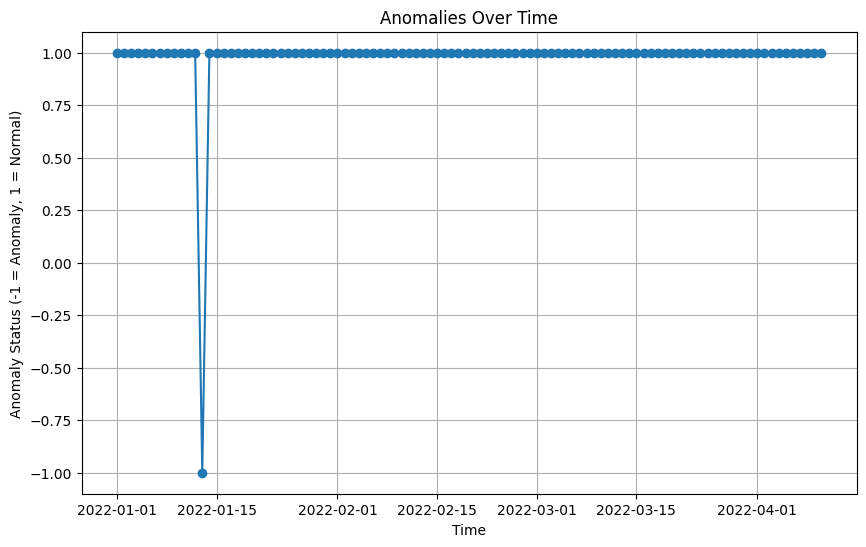

In [29]:
# Assuming you have a time index associated with the data
time_index = pd.date_range(start="2022-01-01", periods=combined_features.shape[0], freq='D')  # Example time index

# Plot anomalies over time
plt.figure(figsize=(10, 6))
plt.plot(time_index, anomalies, marker='o', linestyle='-', label="Anomaly Status")
plt.title("Anomalies Over Time")
plt.xlabel("Time")
plt.ylabel("Anomaly Status (-1 = Anomaly, 1 = Normal)")
plt.grid()
plt.show()


In [30]:
# Retrieve feature importance scores
if hasattr(anomaly_model, "feature_importances_"):
    feature_importance = anomaly_model.feature_importances_
    print("Feature importance scores:", feature_importance)


In [31]:
if hasattr(anomaly_model, "estimators_"):
    # Average importance across all trees
    feature_importances = np.mean([
        tree.feature_importances_ for tree in anomaly_model.estimators_
    ], axis=0)

    # Sort features by importance
    feature_ranking = np.argsort(feature_importances)[::-1]
    print("Feature Importance (Top Features):")
    for idx in feature_ranking[:10]:  # Top 10 features
        print(f"Feature {idx}: Importance = {feature_importances[idx]}")


Feature Importance (Top Features):
Feature 118: Importance = 0.006092834501148852
Feature 555: Importance = 0.004534359660388912
Feature 537: Importance = 0.0043200478510941435
Feature 794: Importance = 0.004318272449605008
Feature 201: Importance = 0.004232052729264479
Feature 655: Importance = 0.004119008029564855
Feature 621: Importance = 0.004113634121789897
Feature 64: Importance = 0.0038857566579320758
Feature 49: Importance = 0.003885499497285465
Feature 357: Importance = 0.003712206730068706


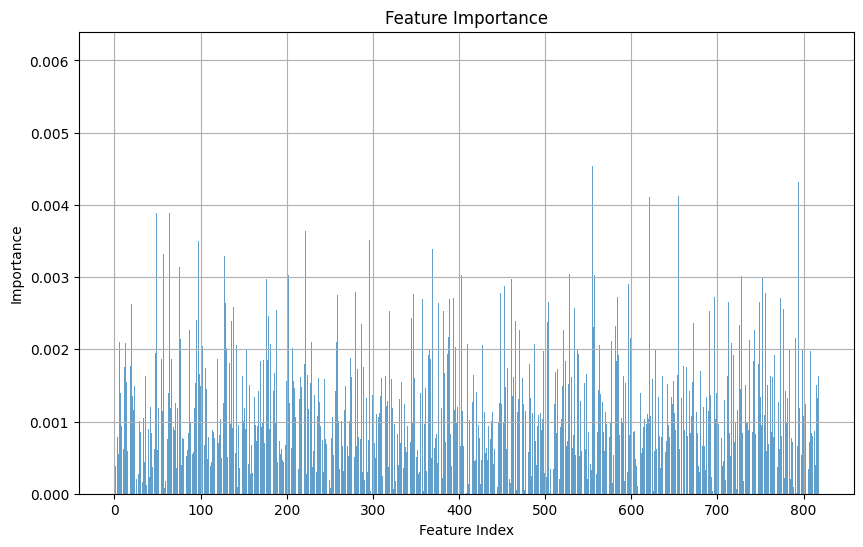

In [32]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importances)), feature_importances, alpha=0.7)
plt.title("Feature Importance")
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.grid()
plt.show()


In [33]:
# Get indices of anomalies
anomaly_indices = np.where(anomalies == -1)[0]

# Select a specific anomaly
anomaly_idx = anomaly_indices[0]
print(f"Inspecting anomaly at index {anomaly_idx}...")

# Extract the corresponding numerical and text features
anomalous_numerical = numerical_data[anomaly_idx]
anomalous_text = text_data_embeddings[anomaly_idx]

# Compare with average of normal data
normal_numerical_avg = numerical_data[anomalies == 1].mean(axis=0)
normal_text_avg = text_data_embeddings[anomalies == 1].mean(axis=0)

print("Anomalous numerical features:", anomalous_numerical)
print("Difference from normal numerical average:", anomalous_numerical - normal_numerical_avg)
print("Anomalous text embedding cosine similarity to normal average:",
      cosine_similarity([anomalous_text], [normal_text_avg])[0][0])


Inspecting anomaly at index 12...
Anomalous numerical features: [0.83707164 0.07717171 0.43385033 0.98177029 0.60177758 0.49778473
 0.99593719 0.37840822 0.46750248 0.63998804 0.18754393 0.65115277
 0.19256056 0.99472818 0.29233598 0.42399108 0.773757   0.04155034
 0.16592287 0.03430667 0.27096796 0.56577209 0.9352041  0.9446041
 0.16516854 0.24702555 0.38530328 0.05484879 0.22705071 0.202617
 0.66009994 0.7378103  0.47694438 0.40499049 0.86228633 0.88813811
 0.1185984  0.80707745 0.83725217 0.6781498  0.62492976 0.57245181
 0.45963339 0.21421719 0.03305674 0.15998487 0.93643687 0.19873524
 0.57405841 0.00210951]
Difference from normal numerical average: [ 0.36165686 -0.46034157 -0.02657512  0.4704474   0.10835781 -0.00065887
  0.48009333 -0.16929704 -0.01929228  0.12766963 -0.31273362  0.13414919
 -0.30682375  0.51048152 -0.24080617 -0.04110464  0.31755918 -0.48907438
 -0.31584278 -0.50140076 -0.19987099  0.04811881  0.41784283  0.44538645
 -0.33970944 -0.25910785 -0.12904495 -0.44445

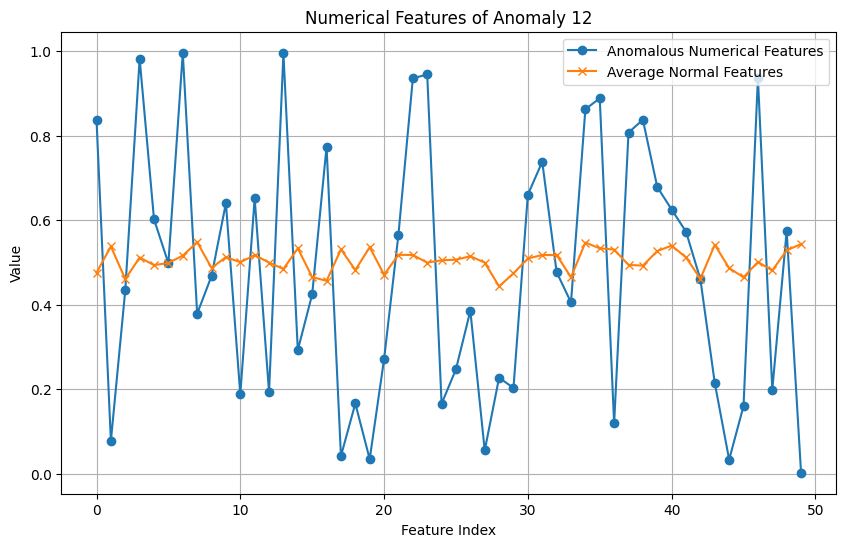

In [34]:
# For numerical data
plt.figure(figsize=(10, 6))
plt.plot(anomalous_numerical, label="Anomalous Numerical Features", marker='o')
plt.plot(normal_numerical_avg, label="Average Normal Features", marker='x')
plt.title(f"Numerical Features of Anomaly {anomaly_idx}")
plt.xlabel("Feature Index")
plt.ylabel("Value")
plt.legend()
plt.grid()
plt.show()


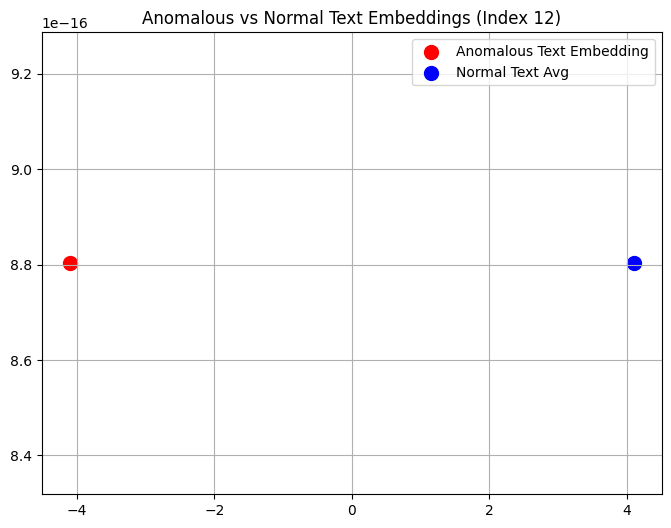

In [35]:
from sklearn.decomposition import PCA

# Reduce dimensionality for visualization
pca = PCA(n_components=2)
text_reduced = pca.fit_transform(np.vstack([anomalous_text, normal_text_avg]))

plt.figure(figsize=(8, 6))
plt.scatter(text_reduced[0, 0], text_reduced[0, 1], label="Anomalous Text Embedding", color='red', s=100)
plt.scatter(text_reduced[1, 0], text_reduced[1, 1], label="Normal Text Avg", color='blue', s=100)
plt.title(f"Anomalous vs Normal Text Embeddings (Index {anomaly_idx})")
plt.legend()
plt.grid()
plt.show()


**All anomalies**

In [40]:
anomaly_indices = np.where(anomalies == -1)[0]
anomaly_idx = anomaly_indices[0]
anomalous_numerical = numerical_data[anomaly_idx]
anomalous_text = text_data_embeddings[anomaly_idx]



In [41]:
normal_numerical_avg = numerical_data[anomalies == 1].mean(axis=0)
normal_text_avg = text_data_embeddings[anomalies == 1].mean(axis=0)
print("Anomalous numerical features:", anomalous_numerical)
print("Difference from normal numerical average:", anomalous_numerical - normal_numerical_avg)


Anomalous numerical features: [0.83707164 0.07717171 0.43385033 0.98177029 0.60177758 0.49778473
 0.99593719 0.37840822 0.46750248 0.63998804 0.18754393 0.65115277
 0.19256056 0.99472818 0.29233598 0.42399108 0.773757   0.04155034
 0.16592287 0.03430667 0.27096796 0.56577209 0.9352041  0.9446041
 0.16516854 0.24702555 0.38530328 0.05484879 0.22705071 0.202617
 0.66009994 0.7378103  0.47694438 0.40499049 0.86228633 0.88813811
 0.1185984  0.80707745 0.83725217 0.6781498  0.62492976 0.57245181
 0.45963339 0.21421719 0.03305674 0.15998487 0.93643687 0.19873524
 0.57405841 0.00210951]
Difference from normal numerical average: [ 0.36165686 -0.46034157 -0.02657512  0.4704474   0.10835781 -0.00065887
  0.48009333 -0.16929704 -0.01929228  0.12766963 -0.31273362  0.13414919
 -0.30682375  0.51048152 -0.24080617 -0.04110464  0.31755918 -0.48907438
 -0.31584278 -0.50140076 -0.19987099  0.04811881  0.41784283  0.44538645
 -0.33970944 -0.25910785 -0.12904495 -0.44445996 -0.21590795 -0.27142986
  0.15

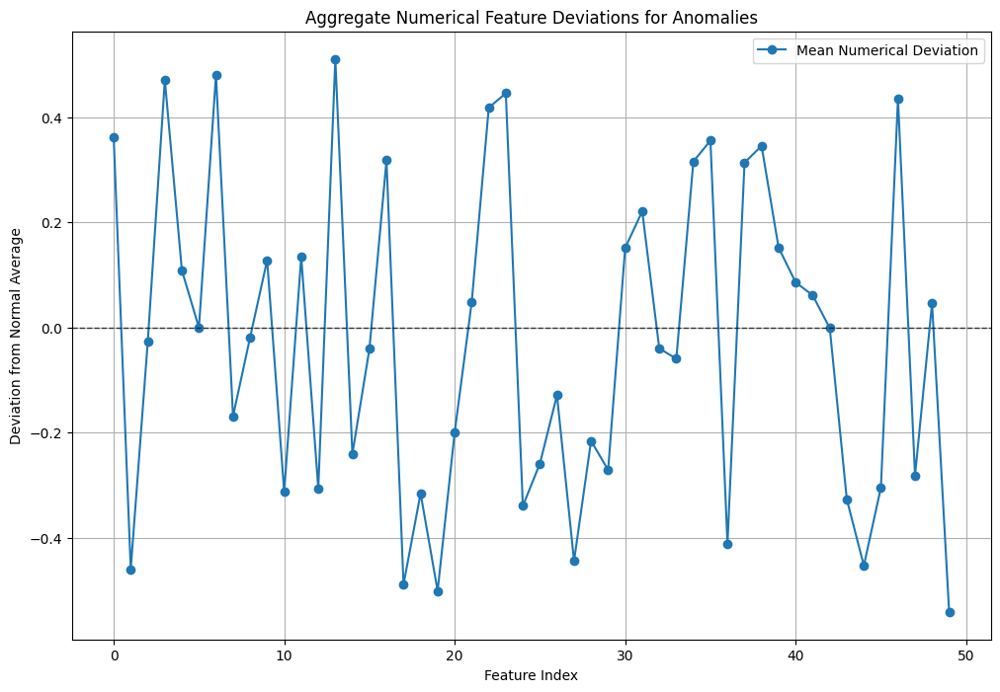

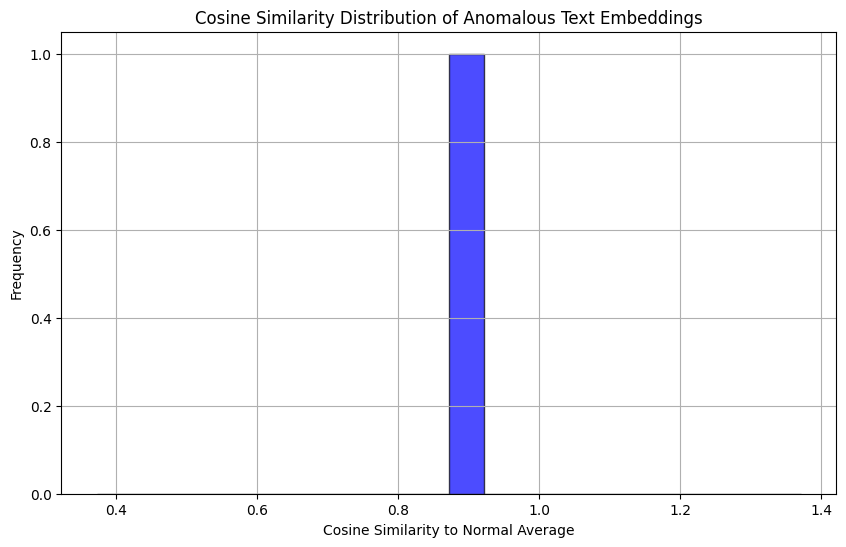

Average Cosine Similarity of Anomalous Text Embeddings: 0.8716
Minimum Cosine Similarity: 0.8716
Maximum Cosine Similarity: 0.8716


In [47]:
# Updated function to analyze and visualize overall insights, not just a specific index
def analyze_and_visualize_overall_anomalies(numerical_data, text_data_embeddings, anomalies):
    """
    Analyze and visualize overall trends in anomalies by comparing numerical and text features
    with normal data averages and aggregating insights.
    """
    # Identify anomalies
    anomaly_indices = np.where(anomalies == -1)[0]
    normal_indices = np.where(anomalies == 1)[0]

    # Compute averages of normal data
    normal_numerical_avg = numerical_data[normal_indices].mean(axis=0)
    normal_text_avg = text_data_embeddings[normal_indices].mean(axis=0)

    # Aggregate results
    numerical_deviation_mean = []
    text_similarity_mean = []

    for anomaly_idx in anomaly_indices:
        # Extract features
        anomalous_numerical = numerical_data[anomaly_idx]
        anomalous_text = text_data_embeddings[anomaly_idx]

        # Numerical deviation
        numerical_diff = anomalous_numerical - normal_numerical_avg
        numerical_deviation_mean.append(numerical_diff)

        # Text cosine similarity
        cosine_sim = cosine_similarity([anomalous_text], [normal_text_avg])[0][0]
        text_similarity_mean.append(cosine_sim)

    # Convert numerical deviations to an aggregated mean deviation
    numerical_deviation_mean = np.mean(numerical_deviation_mean, axis=0)

    # Visualize aggregated numerical deviations
    plt.figure(figsize=(12, 8))
    plt.plot(numerical_deviation_mean, label="Mean Numerical Deviation", marker='o')
    plt.axhline(0, color="black", linestyle="--", linewidth=1, alpha=0.7)
    plt.title("Aggregate Numerical Feature Deviations for Anomalies")
    plt.xlabel("Feature Index")
    plt.ylabel("Deviation from Normal Average")
    plt.legend()
    plt.grid()
    plt.show()

    # Visualize text similarity distribution
    plt.figure(figsize=(10, 6))
    plt.hist(text_similarity_mean, bins=20, alpha=0.7, color="blue", edgecolor="black")
    plt.title("Cosine Similarity Distribution of Anomalous Text Embeddings")
    plt.xlabel("Cosine Similarity to Normal Average")
    plt.ylabel("Frequency")
    plt.grid()
    plt.show()

    # Print overall summary
    print(f"Average Cosine Similarity of Anomalous Text Embeddings: {np.mean(text_similarity_mean):.4f}")
    print(f"Minimum Cosine Similarity: {np.min(text_similarity_mean):.4f}")
    print(f"Maximum Cosine Similarity: {np.max(text_similarity_mean):.4f}")

# Example execution (replace with actual numerical and text data)
analyze_and_visualize_overall_anomalies(numerical_data, text_data_embeddings, anomalies)



In [48]:
print(f"Number of anomalies detected: {len(anomaly_indices)}")


Number of anomalies detected: 1
